# DeepSHAP and TF-Modisco on tRNet multi-tasl model

#### Import k-fold CV multi-class model previously trained
See `tRNet_model_training.ipynb`

Generate importance scores and visualise contributions 
See:
https://docs.google.com/presentation/d/1JCLMTW7ppA3Oaz9YA2ldDgx8ItW9XHASXM1B3regxPw/edit#slide=id.g65244ca07a_0_327
https://github.com/AvantiShri/colab_notebooks/blob/ecf2909528ff47dbc36c87666b44520f07cbaab2/labmeeting/Oct18/DeepSHAP_Unimodal_Input.ipynb
https://github.com/kundajelab/tfmodisco/blob/master/examples/simulated_TAL_GATA_deeplearning/Generate%20Importance%20Scores.ipynb

## Load data
### load all sequences in one-hot format for final contribution score calculation after SHAP

In [1]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import numpy as np

# The LabelEncoder encodes a sequence of bases as a sequence of integers.
integer_encoder = LabelEncoder()  
# The OneHotEncoder converts an array of integers to a sparse matrix where 
# each row corresponds to one possible value of each feature.
one_hot_encoder = OneHotEncoder(categories='auto')   

In [16]:
from collections import defaultdict
tasks = ['housekeeping', 'repressed', 'off']

In [3]:
# Load seq sets

def loadData(housekeeping, restricted, off):
    """Load data and output train and test set from fasta files of upstream sequence of different groups of tRNAs
    
    Args:
    housekeeping: fasta of 200bp upstream seq of housekeeping tRNAs
    restricted: fasta of restricted/regulated tRNAs across diff.
    off: fasta of persistently off tRNAs
    """
    
    # Convert fasta files to 1-hot encoded arrays
    # Generate y arrays (1-hot matrix for 4 tasks)
    
    seqSet_1hot = []
    seqSet_y = []
    for i, task in enumerate([housekeeping, restricted, off]):
        default_y = [0,0,0]
        seqSet = []
        with open(task, "r") as seqs:
            for line in seqs:
                if not line.startswith(">"):
                    seq = line.strip().upper()
                    seqSet.append(seq)
    
        one_hot_encoder = OneHotEncoder(categories='auto')
        for sequence in seqSet:
            integer_encoded = integer_encoder.fit_transform(list(sequence))
            integer_encoded = np.array(integer_encoded).reshape(-1, 1)
            one_hot_encoded = one_hot_encoder.fit_transform(integer_encoded)
            seqSet_1hot.append(one_hot_encoded.toarray())
        
        default_y[i] = 1
        y_set = np.array([default_y] * len(seqSet))
        seqSet_y.append(y_set)
        # Combine pos and neg X and y data
    
    X = np.array(seqSet_1hot)
    y = np.concatenate(seqSet_y)
    
    #X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=25)
    
    return X, y

In [4]:
onehot_sequences, y = loadData("data/hg38-tRNAs-multiFiltered_upstream200_housekeeping.fa", "data/hg38-tRNAs-multiFiltered_upstream200_repressed.fa", "data/hg38-tRNAs-multiFiltered_upstream200_inactive.fa")

In [5]:
onehot_sequences.shape

(558, 200, 4)

In [6]:
y.shape

(558, 3)

## Import model (from tRNet_model_training.ipynb)
#### See this notebook for the specs as well as training parameters etc...

In [7]:
from tensorflow import keras
from tensorflow.keras.models import model_from_json
keras_model_weights = "model/tRNet_multitask_modelWeights.h5"
keras_model_json = "model/tRNet_multitask_modelJSON.json"
keras_model = model_from_json(open(keras_model_json).read())
keras_model.load_weights(keras_model_weights)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [8]:
keras_model.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.00025026247369061555),
                  loss="categorical_crossentropy",
                  metrics=['accuracy'])
keras_model.evaluate(onehot_sequences, y)

558/558 [==============================] - 1s 2ms/sample - loss: 0.3696 - acc: 0.8835


[0.3696327342995606, 0.88351256]

In [9]:
keras_model.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_main (InputLayer)         [(None, 200, 4)]     0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 200, 128)     10368       input_main[0][0]                 
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 200, 128)     163968      conv1d[0][0]                     
__________________________________________________________________________________________________
add (Add)                       (None, 200, 128)     0           conv1d_1[0][0]                   
                                                                 conv1d[0][0]               

## SHAP importance scores generation
For amazing detailed explanations of commands and pipeline see
https://docs.google.com/presentation/d/1JCLMTW7ppA3Oaz9YA2ldDgx8ItW9XHASXM1B3regxPw/edit#slide=id.g65244ca07a_0_327


For our SHAP function, we will need to define a function that returns the references to use for each input. The function will take a single input and then return a collection of references. In this case, we will generate references by dinucleotide shuffling the input sequences

In [10]:
from deeplift.dinuc_shuffle import dinuc_shuffle
import numpy as np

def dinuc_shuffle_several_times(list_containing_input_modes_for_an_example,
                                seed=1234):
    assert len(list_containing_input_modes_for_an_example)==1
    onehot_seq = list_containing_input_modes_for_an_example[0]
    rng = np.random.RandomState(seed)
    to_return = np.array([dinuc_shuffle(onehot_seq, rng=rng) for i in range(10)])
    return [to_return] #wrap in list for compatibility with multiple modes|

In [11]:
from deeplift.visualization import viz_sequence

Define function to calculate mean normalized hypothetical contribution scores

In [12]:
def combine_mult_and_diffref(mult, orig_inp, bg_data):
    assert len(orig_inp)==1
    projected_hypothetical_contribs = np.zeros_like(bg_data[0]).astype("float")
    assert len(orig_inp[0].shape)==2
    #At each position in the input sequence, we iterate over the one-hot encoding
    # possibilities (eg: for genomic sequence, this is ACGT i.e.
    # 1000, 0100, 0010 and 0001) and compute the hypothetical 
    # difference-from-reference in each case. We then multiply the hypothetical
    # differences-from-reference with the multipliers to get the hypothetical contributions.
    #For each of the one-hot encoding possibilities,
    # the hypothetical contributions are then summed across the ACGT axis to estimate
    # the total hypothetical contribution of each position. This per-position hypothetical
    # contribution is then assigned ("projected") onto whichever base was present in the
    # hypothetical sequence.
    #The reason this is a fast estimate of what the importance scores *would* look
    # like if different bases were present in the underlying sequence is that
    # the multipliers are computed once using the original sequence, and are not
    # computed again for each hypothetical sequence.
    for i in range(orig_inp[0].shape[-1]):
        hypothetical_input = np.zeros_like(orig_inp[0]).astype("float")
        hypothetical_input[:,i] = 1.0
        hypothetical_difference_from_reference = (hypothetical_input[None,:,:]-bg_data[0])
        hypothetical_contribs = hypothetical_difference_from_reference*mult[0]
        projected_hypothetical_contribs[:,:,i] = np.sum(hypothetical_contribs,axis=-1) 
    return [np.mean(projected_hypothetical_contribs,axis=0)]

Instantiate the shap explainer and calculate scores and hyp scores for each task

In [13]:
import shap
task_to_contrib_scores = {}
task_to_hyp_contrib_scores = {}
all_tasks = [0,1,2]

for task_idx in all_tasks:
    explainer = shap.DeepExplainer(model=([keras_model.input], keras_model.layers[-2].output[:,task_idx]), 
                                   data=dinuc_shuffle_several_times,
                                   combine_mult_and_diffref=combine_mult_and_diffref)
    task_to_hyp_contrib_scores[task_idx] = explainer.shap_values(onehot_sequences)
    # actual contributions are hypothetical scores multiplied by the one-hot matrix per tRNA upstream sequence
    task_to_contrib_scores[task_idx] = explainer.shap_values(onehot_sequences)*onehot_sequences 

/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Using TensorFlow backend.


hypothetical contributions:


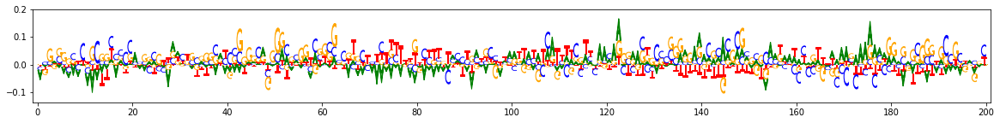

Actual contributions:


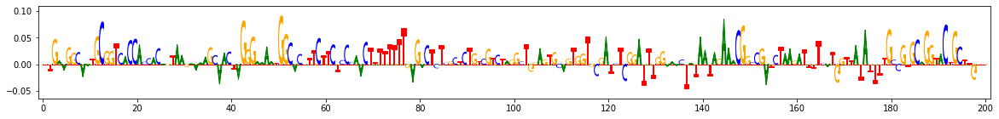

In [14]:
# Example of hyp and actual contribution scores in an upstream tRNA region
# To print a different example change the "10" in the second set of parentheses below
print("hypothetical contributions:")
viz_sequence.plot_weights(task_to_hyp_contrib_scores[0][10], subticks_frequency=20)
print("Actual contributions:")
viz_sequence.plot_weights(task_to_contrib_scores[0][10], subticks_frequency=20)

In [19]:
# Save contribution scores
!mkdir SHAP_scores
for task_idx in all_tasks:
    contribution_out = task_to_hyp_contrib_scores[task_idx].reshape(558,4,200)
    np.savez_compressed("SHAP_scores/" + tasks[task_idx] + "_contributionScores.npz", contribution_out)

mkdir: cannot create directory ‘SHAP_scores’: File exists


## Save the importance scores

In [20]:
import h5py
import os

In [22]:
if (os.path.isfile("SHAP_scores/tRNet_SHAP_scores.h5")):
    !rm tRNet_SHAP_scores.h5
f = h5py.File("SHAP_scores/tRNet_SHAP_scores.h5")
g = f.create_group("contrib_scores")
for task_idx in all_tasks:
    g.create_dataset("task"+str(task_idx), data=task_to_contrib_scores[task_idx])
g = f.create_group("hyp_contrib_scores")
for task_idx in all_tasks:
    g.create_dataset("task"+str(task_idx), data=task_to_hyp_contrib_scores[task_idx])
f.close()

/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/ipykernel_launcher.py:3: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  This is separate from the ipykernel package so we can avoid doing imports until


## Run TF-MoDISco

TF-MoDISco first identifies seqlets, then splits the seqlets into "metaclusters" according to their pattern of activity across all the tasks, and then performs clustering within each task. If all three (housekeeping, repressed, inactive) tasks are specified under "task_names", then there will be 27 possible metaclusters (consisting of a +1, -1 or 0 for each task). If only task0 is specified, there will only be two possible metaclusters (+1 and -1). We run tfmodisco here on a single task at a time.

### Prepare data for TF_MoDISco

In [23]:
import h5py
from collections import OrderedDict

task_to_scores = OrderedDict()
task_to_hyp_scores = OrderedDict()

f = h5py.File("SHAP_scores/tRNet_SHAP_scores.h5","r")
tasks = f["contrib_scores"].keys()
for task in tasks:
    #Note that the sequences can be of variable lengths;
    #in this example they all have the same length (200bp) but that is
    #not necessary.
    task_to_scores[task] = [np.array(x) for x in f['contrib_scores'][task][:]]
    task_to_hyp_scores[task] = [np.array(x) for x in f['hyp_contrib_scores'][task][:]]

#onehot_data = [one_hot_encode_along_channel_axis(seq) for seq in fasta_sequences][:n]

In [24]:
import modisco

### Task 0 - housekeeping

MEMORY 1.319305216
On task task0
Computing windowed sums on original
Generating null dist
peak(mu)= 0.02502854049700546
Computing threshold
For increasing = True , the minimum IR precision was 0.32558424031001637 occurring at 2.4182576453535276e-06 implying a frac_neg of 0.4827648755712372
To be conservative, adjusted frac neg is 0.95
For increasing = False , the minimum IR precision was 0.35086104833586096 occurring at -2.1942658350315725e-06 implying a frac_neg of 0.5405022259662435
To be conservative, adjusted frac neg is 0.95
Thresholds from null dist were -0.47876611263491187  and  0.35389540402684405 with frac passing 0.00010972130787798991
Passing windows frac was 0.00010972130787798991 , which is below  0.03 ; adjusting
Final raw thresholds are -0.19600860430090683  and  0.19600860430090683
Final transformed thresholds are -0.9699912222953697  and  0.9699912222953697


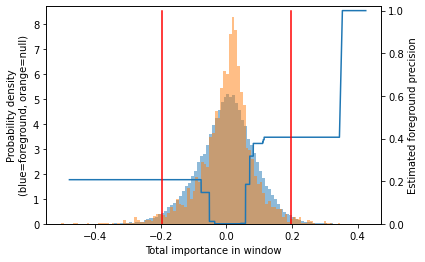

Got 922 coords
After resolving overlaps, got 922 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9698912222953697
MEMORY 1.34375424
922 identified in total
2 activity patterns with support >= 100 out of 2 possible patterns
Metacluster sizes:  [516, 406]
Idx to activities:  {0: '-1', 1: '1'}
MEMORY 1.343807488
On metacluster 1
Metacluster size 406
Relevant tasks:  ('task0',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 406
(Round 1) Computing coarse affmat
MEMORY 1.342881792
Beginning embedding computation
MEMORY 1.342889984


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 120 tasks      | elapsed:    2.8s
[Parallel(n_jobs=40)]: Done 406 out of 406 | elapsed:    4.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.4s
[Parallel(n_jobs=40)]: Done 406 out of 406 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 406 out of 406 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.08463263511657715 s


[Parallel(n_jobs=1)]: Done 406 out of 406 | elapsed:    1.0s finished


Constructing csr matrix...
csr matrix made in 0.07928776741027832 s
Finished embedding computation in 10.64 s
MEMORY 1.387986944
Starting affinity matrix computations
MEMORY 1.387986944
Batching in slices of size 406


100%|██████████| 1/1 [00:10<00:00, 10.19s/it]

Finished affinity matrix computations in 10.2 s
MEMORY 1.390911488
(Round 1) Computed coarse affmat
MEMORY 1.38907648
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 1.38907648
Launching nearest neighbors affmat calculation job
MEMORY 1.38907648


Parallel runs completed
MEMORY 1.52676352
Job completed in: 4.18 s
MEMORY 1.52676352
Launching nearest neighbors affmat calculation job
MEMORY 1.52676352
Parallel runs completed
MEMORY 1.53401344
Job completed in: 4.73 s
MEMORY 1.53401344
(Round 1) Computed affinity matrix on nearest neighbors in 9.08 s
MEMORY 1.53401344
Filtered down to 391 of 406
(Round 1) Retained 391 rows out of 406 after filtering
MEMORY 1.534353408
(Round 1) Computing density adapted affmat
MEMORY 1.534353408
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 1.567080448
Beginning preprocessing + Leiden
Affmat shape: 391


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    1.8s remaining:    2.3s


Quality: 0.032268069329154304
Quality: 0.032268627569636076
Got 5 clusters after round 1
Counts:
{1: 169, 0: 202, 2: 17, 3: 2, 4: 1}
MEMORY 1.567105024
(Round 1) Aggregating seqlets in each cluster
MEMORY 1.567105024
Aggregating for cluster 0 with 202 seqlets
MEMORY 1.567105024
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 3 seqlets that went over the sequence edge during flank expansion


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    2.3s finished


Skipped 71 seqlets that went over sequence edge during flank expansion
Skipped 2 due to duplicates
Trimming eliminated 0 seqlets out of 125
Skipped 8 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 169 seqlets
MEMORY 1.567105024
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 168
Skipped 15 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 17 seqlets
MEMORY 1.567105024
Skipped 2 seqlets that went over sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 15
Skipped 1 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 2 seqlets
MEMORY 1.567105024
Trimming eliminated 0 seqlets out of 2
Aggregating for cluster 4 with 1 seqlets
MEMORY 1.567105024
Trimming eliminated 0 seqlets out of 1
(Round 2) num seqlets: 287
(Round 2) Computing coarse affmat
MEMORY 1.500278784
Beginning embedding computation
MEMORY 1.500278784


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.4s
[Parallel(n_jobs=40)]: Done 208 out of 287 | elapsed:    1.6s remaining:    0.6s
[Parallel(n_jobs=40)]: Done 287 out of 287 | elapsed:    2.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 287 out of 287 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 287 out of 287 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.05462169647216797 s


[Parallel(n_jobs=1)]: Done 287 out of 287 | elapsed:    0.7s finished


Constructing csr matrix...
csr matrix made in 0.05401253700256348 s
Finished embedding computation in 5.85 s
MEMORY 1.506381824
Starting affinity matrix computations
MEMORY 1.506381824
Batching in slices of size 287


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

Finished affinity matrix computations in 1.19 s
MEMORY 1.506381824
(Round 2) Computed coarse affmat
MEMORY 1.504284672
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 1.504284672
Launching nearest neighbors affmat calculation job
MEMORY 1.504284672


Parallel runs completed
MEMORY 1.505153024
Job completed in: 2.7 s
MEMORY 1.505153024
Launching nearest neighbors affmat calculation job
MEMORY 1.505153024
Parallel runs completed
MEMORY 1.5064064
Job completed in: 2.69 s
MEMORY 1.5064064
(Round 2) Computed affinity matrix on nearest neighbors in 5.54 s
MEMORY 1.506541568
Not applying filtering for rounds above first round
MEMORY 1.506541568
(Round 2) Computing density adapted affmat
MEMORY 1.506541568
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 1.505734656
Beginning preprocessing + Leiden
Affmat shape: 287


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.8s remaining:    1.0s


Quality: 0.054960129104155424
Quality: 0.05496136228042967
Got 4 clusters after round 2
Counts:
{1: 136, 2: 5, 0: 144, 3: 2}
MEMORY 1.505734656
(Round 2) Aggregating seqlets in each cluster
MEMORY 1.505734656
Aggregating for cluster 0 with 144 seqlets
MEMORY 1.505734656


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.2s finished


Skipped 5 due to duplicates
Trimming eliminated 0 seqlets out of 139
Aggregating for cluster 1 with 136 seqlets
MEMORY 1.505734656
Skipped 3 seqlets that went over sequence edge during flank expansion
Skipped 5 due to duplicates
Trimming eliminated 0 seqlets out of 128
Skipped 3 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 5 seqlets
MEMORY 1.505734656
Trimming eliminated 0 seqlets out of 5
Aggregating for cluster 3 with 2 seqlets
MEMORY 1.505734656
Trimming eliminated 0 seqlets out of 2
Got 4 clusters
Splitting into subclusters...
MEMORY 1.505734656
Inspecting pattern 0 for spurious merging


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.


[t-SNE] Computed conditional probabilities for sample 139 / 139
[t-SNE] Mean sigma: 0.456181
Beginning preprocessing + Leiden


[Parallel(n_jobs=40)]: Done 139 out of 139 | elapsed:    0.2s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.


Affmat shape: 139


[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.17457947282652855
Quality: 0.17782408177221276
Quality: 0.17897611239350453
Quality: 0.18018685460244577
Quality: 0.18022682904734652
Quality: 0.18023601615374435
Quality: 0.18041968059306443
Quality: 0.18043063307525933
Got subclusters: Counter({0: 41, 1: 30, 2: 28, 3: 26, 4: 14})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.1s finished


Numbers for each pattern pre-subsample: [41, 30, 28, 26, 14]
Numbers after subsampling: [41, 30, 28, 26, 14]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.42530012130737305 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.298797607421875 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.28726959228515625 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.2559092044830322 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.17045903205871582 s
Cluster sizes
[41 30 28 26 14]
Cross-contamination matrix:
[[1.   0.6  0.61 0.85 0.71]
 [0.84 1.   0.74 0.92 0.8 ]
 [0.85 0.68 1.   0.9  0.69]
 [0.53 0.4  0.46 1.   0.51]
 [0.76 0.64 0.46 0.87 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.57 0.54 0.6  0.55]
 [0.57 1.   0.57 0.73 0.48]
 [0.54 0.57 1.   0.64 0.43]
 [0.6  0.73 0.64 1.   0.51]
 [0.55 0.48 0.43 0.51 1.  ]]
Inspecting pattern 1 for spurious merging


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 125 out of 125 | elapsed:    0.1s finished


[t-SNE] Computed conditional probabilities for sample 125 / 125
[t-SNE] Mean sigma: 0.458273
Beginning preprocessing + Leiden
Affmat shape: 125


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.17252069177220283
Quality: 0.1726267046584484
Quality: 0.17312109166658146
Quality: 0.1732160923769393
Quality: 0.17394412271811774
Got subclusters: Counter({0: 32, 1: 23, 2: 20, 3: 18, 4: 16, 5: 16})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.1s finished


Numbers for each pattern pre-subsample: [32, 23, 20, 18, 16, 16]
Numbers after subsampling: [32, 23, 20, 18, 16, 16]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.3745384216308594 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.28615570068359375 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.27127766609191895 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.2644541263580322 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.23989582061767578 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.25119900703430176 s
Cluster sizes
[32 23 20 18 16 16]
Cross-contamination matrix:
[[1.   0.79 0.86 0.85 0.96 0.71]
 [0.45 1.   0.74 0.62 0.64 0.34]
 [0.42 0.6  1.   0.64 0.69 0.3 ]
 [0.62 0.73 0.79 1.   0.79 0.51]
 [0.44 0.53 0.61 0.53 1.   0.32]
 [0.81 0.75 0.62 0.84 0.88 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.37 0.42 0.51 0.52 0.5 ]
 [0.37 1.   0.63 0.48 0.47 0.29]
 [0.42 0.63 1.   0.48 0.46 0.4 ]
 [

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done   4 out of  41 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=40)]: Done  41 out of  41 | elapsed:    0.1s finished
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/neighbors/_base.py:176: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Iteration 50: error = 43.6363106, gradient norm = 0.5495480 (50 iterations in 7.038s)
[t-SNE] Iteration 100: error = 44.9326859, gradient norm = 0.5676473 (50 iterations in 7.102s)
[t-SNE] Iteration 150: error = 43.8126068, gradient norm = 0.3991544 (50 iterations in 5.362s)
[t-SNE] Iteration 200: error = 45.3359566, gradient norm = 0.3876603 (50 iterations in 0.066s)
[t-SNE] Iteration 250: error = 46.1041985, gradient norm = 0.3902919 (50 iterations in 0.062s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.104198
[t-SNE] Iteration 300: error = 0.5840831, gradient norm = 0.0007083 (50 iterations in 0.886s)
[t-SNE] Iteration 350: error = 0.5724443, gradient norm = 0.0000870 (50 iterations in 7.056s)
[t-SNE] Iteration 400: error = 0.5712732, gradient norm = 0.0000573 (50 iterations in 7.120s)
[t-SNE] Iteration 450: error = 0.5701044, gradient norm = 0.0000409 (50 iterations in 6.996s)
[t-SNE] Iteration 500: error = 0.5696922, gradient norm = 0.0000353 (50 

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 1.8185453143360052e-13


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  19 out of  32 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  32 out of  32 | elapsed:    0.0s finished


Got subclusters: Counter({0: 41})
On pattern 1
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.002s...
[t-SNE] Computed neighbors for 32 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.007s
[t-SNE] Iteration 50: error = 45.0391655, gradient norm = 0.5915984 (50 iterations in 1.220s)
[t-SNE] Iteration 100: error = 41.5301628, gradient norm = 0.6421952 (50 iterations in 0.189s)
[t-SNE] Iteration 150: error = 41.7794266, gradient norm = 0.5639641 (50 iterations in 0.030s)
[t-SNE] Iteration 200: error = 42.5937614, gradient norm = 0.5189880 (50 iterations in 0.540s)
[t-SNE] Iteration 250: error = 48.9627762, gradient norm = 0.4000197 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.962776
[t-SNE] Iteration 300: error = 0.5347083, gradient norm = 0.0006481 (50 iterations in 6.421s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 2.0650148258028073e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  13 out of  30 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  30 out of  30 | elapsed:    0.0s finished


Got subclusters: Counter({0: 32})
On pattern 2
[t-SNE] Computing 29 nearest neighbors...
[t-SNE] Indexed 30 samples in 0.001s...
[t-SNE] Computed neighbors for 30 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 30 / 30
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 43.2136459, gradient norm = 0.3478597 (50 iterations in 7.047s)
[t-SNE] Iteration 100: error = 44.5518456, gradient norm = 0.6739807 (50 iterations in 7.042s)
[t-SNE] Iteration 150: error = 43.4177437, gradient norm = 0.7131931 (50 iterations in 7.123s)
[t-SNE] Iteration 200: error = 41.6086540, gradient norm = 0.7720285 (50 iterations in 5.028s)
[t-SNE] Iteration 250: error = 44.0026779, gradient norm = 0.6494718 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 44.002678
[t-SNE] Iteration 300: error = 0.5412545, gradient norm = 0.0008786 (50 iterations in 0.133s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 1.9095836023552904e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done   7 out of  28 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=40)]: Done  28 out of  28 | elapsed:    0.0s finished


Got subclusters: Counter({0: 30})
On pattern 3
[t-SNE] Computing 27 nearest neighbors...
[t-SNE] Indexed 28 samples in 0.002s...
[t-SNE] Computed neighbors for 28 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 28 / 28
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 46.2600632, gradient norm = 0.6256164 (50 iterations in 6.942s)
[t-SNE] Iteration 100: error = 41.9110107, gradient norm = 0.6946596 (50 iterations in 6.984s)
[t-SNE] Iteration 150: error = 43.9861412, gradient norm = 0.5679206 (50 iterations in 6.990s)
[t-SNE] Iteration 200: error = 42.8857841, gradient norm = 0.5895539 (50 iterations in 7.008s)
[t-SNE] Iteration 250: error = 43.2038803, gradient norm = 0.5808924 (50 iterations in 6.920s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.203880
[t-SNE] Iteration 300: error = 0.5990546, gradient norm = 0.0008714 (50 iterations in 7.025s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: -6.694644838489791e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  26 out of  26 | elapsed:    0.0s finished


Got subclusters: Counter({0: 28})
On pattern 4
[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 26 samples in 0.002s...
[t-SNE] Computed neighbors for 26 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 26 / 26
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 45.2909966, gradient norm = 0.6804135 (50 iterations in 6.982s)
[t-SNE] Iteration 100: error = 47.0380402, gradient norm = 0.4849893 (50 iterations in 6.994s)
[t-SNE] Iteration 150: error = 45.5909653, gradient norm = 0.6228424 (50 iterations in 7.073s)
[t-SNE] Iteration 200: error = 45.9993820, gradient norm = 0.5189822 (50 iterations in 7.158s)
[t-SNE] Iteration 250: error = 43.9974442, gradient norm = 0.6744986 (50 iterations in 7.199s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.997444
[t-SNE] Iteration 300: error = 0.5115682, gradient norm = 0.0007732 (50 iterations in 7.037s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 1.7763568394002767e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  16 out of  23 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  23 out of  23 | elapsed:    0.0s finished


Got subclusters: Counter({0: 26})
On pattern 5
[t-SNE] Computing 22 nearest neighbors...
[t-SNE] Indexed 23 samples in 0.002s...
[t-SNE] Computed neighbors for 23 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 23 / 23
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 46.0002747, gradient norm = 0.4982804 (50 iterations in 1.464s)
[t-SNE] Iteration 100: error = 44.1054726, gradient norm = 0.5513866 (50 iterations in 1.689s)
[t-SNE] Iteration 150: error = 48.6219025, gradient norm = 0.4345824 (50 iterations in 4.346s)
[t-SNE] Iteration 200: error = 44.8836594, gradient norm = 0.4291351 (50 iterations in 0.997s)
[t-SNE] Iteration 250: error = 48.0164413, gradient norm = 0.5554816 (50 iterations in 7.088s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.016441
[t-SNE] Iteration 300: error = 0.4577458, gradient norm = 0.0007066 (50 iterations in 7.042s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 8.881784197001296e-16


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done   4 out of  20 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  20 out of  20 | elapsed:    0.0s finished


Got subclusters: Counter({0: 23})
On pattern 6
[t-SNE] Computing 19 nearest neighbors...
[t-SNE] Indexed 20 samples in 0.001s...
[t-SNE] Computed neighbors for 20 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 20 / 20
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 49.2328720, gradient norm = 0.5608081 (50 iterations in 7.062s)
[t-SNE] Iteration 100: error = 46.4881592, gradient norm = 0.4801966 (50 iterations in 5.064s)
[t-SNE] Iteration 150: error = 43.9348679, gradient norm = 0.5333685 (50 iterations in 0.125s)
[t-SNE] Iteration 200: error = 46.6968002, gradient norm = 0.3998051 (50 iterations in 4.487s)
[t-SNE] Iteration 250: error = 49.8732758, gradient norm = 0.7177394 (50 iterations in 3.077s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.873276
[t-SNE] Iteration 300: error = 0.7730783, gradient norm = 0.0013238 (50 iterations in 4.727s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 4.1522341120980754e-14
Got subclusters: Counter({0: 20})
On metacluster 0
Metacluster size 516
Relevant tasks:  ('task0',)
Relevant signs:  (-1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 516
(Round 1) Computing coarse affmat
MEMORY 1.506390016
Beginning embedding computation
MEMORY 1.506390016


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 437 out of 516 | elapsed:    3.4s remaining:    0.6s
[Parallel(n_jobs=40)]: Done 516 out of 516 | elapsed:    3.7s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.4s
[Parallel(n_jobs=40)]: Done 437 out of 516 | elapsed:    3.4s remaining:    0.6s
[Parallel(n_jobs=40)]: Done 516 out of 516 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 516 out of 516 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.10443401336669922 s


[Parallel(n_jobs=1)]: Done 516 out of 516 | elapsed:    1.2s finished


Constructing csr matrix...
csr matrix made in 0.10056400299072266 s
Finished embedding computation in 10.59 s
MEMORY 1.526587392
Starting affinity matrix computations
MEMORY 1.526587392
Batching in slices of size 516


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]

Finished affinity matrix computations in 1.24 s
MEMORY 1.526587392
(Round 1) Computed coarse affmat
MEMORY 1.524228096
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 1.524228096


Launching nearest neighbors affmat calculation job
MEMORY 1.524228096
Parallel runs completed
MEMORY 1.663561728
Job completed in: 6.36 s
MEMORY 1.663561728
Launching nearest neighbors affmat calculation job
MEMORY 1.663561728
Parallel runs completed
MEMORY 1.672736768
Job completed in: 5.98 s
MEMORY 1.672736768
(Round 1) Computed affinity matrix on nearest neighbors in 12.53 s
MEMORY 1.673383936
Filtered down to 498 of 516
(Round 1) Retained 498 rows out of 516 after filtering
MEMORY 1.673383936
(Round 1) Computing density adapted affmat
MEMORY 1.673383936
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 1.731108864
Beginning preprocessing + Leiden
Affmat shape: 498


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    1.5s remaining:    1.9s


Quality: 0.025714056453787822
Got 4 clusters after round 1
Counts:
{1: 204, 0: 206, 3: 5, 2: 83}
MEMORY 1.731108864
(Round 1) Aggregating seqlets in each cluster
MEMORY 1.731108864
Aggregating for cluster 0 with 206 seqlets
MEMORY 1.731108864
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 19 seqlets that went over the sequence edge during flank expansion


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    2.2s finished


Skipped 23 seqlets that went over sequence edge during flank expansion
Skipped 2 due to duplicates
Trimming eliminated 0 seqlets out of 161
Skipped 39 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 204 seqlets
MEMORY 1.731108864
Skipped 35 seqlets that went over the sequence edge during flank expansion
Skipped 12 seqlets that went over the sequence edge during flank expansion
Skipped 11 due to duplicates
Trimming eliminated 0 seqlets out of 146
Skipped 4 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 83 seqlets
MEMORY 1.731108864
Skipped 5 seqlets that went over sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 78
Skipped 1 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 5 seqlets
MEMORY 1.731108864
Trimming eliminated 0 seqlets out of 5
(Round 2) num seqlets: 346
(Round 2) Computing coarse affmat
MEMORY 1.731108864
Begin

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 346 out of 346 | elapsed:    2.4s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 346 out of 346 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 346 out of 346 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.07576346397399902 s


[Parallel(n_jobs=1)]: Done 346 out of 346 | elapsed:    0.8s finished


Constructing csr matrix...
csr matrix made in 0.06558394432067871 s
Finished embedding computation in 6.84 s
MEMORY 1.737232384
Starting affinity matrix computations
MEMORY 1.737232384
Batching in slices of size 346


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

Finished affinity matrix computations in 1.2 s
MEMORY 1.737232384
(Round 2) Computed coarse affmat
MEMORY 1.735872512
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 1.735872512
Launching nearest neighbors affmat calculation job
MEMORY 1.735872512


Parallel runs completed
MEMORY 1.735610368
Job completed in: 4.02 s
MEMORY 1.735610368
Launching nearest neighbors affmat calculation job
MEMORY 1.735610368
Parallel runs completed
MEMORY 1.73309952
Job completed in: 3.53 s
MEMORY 1.73309952
(Round 2) Computed affinity matrix on nearest neighbors in 7.7 s
MEMORY 1.73309952
Not applying filtering for rounds above first round
MEMORY 1.73309952
(Round 2) Computing density adapted affmat
MEMORY 1.73309952
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 1.729200128
Beginning preprocessing + Leiden
Affmat shape: 346


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.9s remaining:    1.2s


Quality: 0.032287522111854323
Got 5 clusters after round 2
Counts:
{0: 153, 2: 29, 1: 145, 4: 7, 3: 12}
MEMORY 1.729241088
(Round 2) Aggregating seqlets in each cluster
MEMORY 1.729241088
Aggregating for cluster 0 with 153 seqlets
MEMORY 1.729241088


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.3s finished


Skipped 2 seqlets that went over sequence edge during flank expansion
Skipped 12 due to duplicates
Trimming eliminated 0 seqlets out of 139
Skipped 2 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 145 seqlets
MEMORY 1.729241088
Removed 1 duplicate seqlets
Skipped 14 due to duplicates
Trimming eliminated 0 seqlets out of 130
Aggregating for cluster 2 with 29 seqlets
MEMORY 1.729241088
Trimming eliminated 0 seqlets out of 29
Skipped 1 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 12 seqlets
MEMORY 1.729241088
Skipped 3 due to duplicates
Trimming eliminated 0 seqlets out of 9
Aggregating for cluster 4 with 7 seqlets
MEMORY 1.729241088
Trimming eliminated 0 seqlets out of 7
Got 5 clusters
Splitting into subclusters...
MEMORY 1.729241088
Inspecting pattern 0 for spurious merging
[t-SNE] Computed conditional probabilities for sample 137 / 137
[t-SNE] Mean sigma: 0.475531


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 137 out of 137 | elapsed:    0.2s finished


Beginning preprocessing + Leiden
Affmat shape: 137


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.23405509803566005
Quality: 0.2343565477345319
Quality: 0.2358523175560437
Quality: 0.23585753243424468
Got subclusters: Counter({0: 38, 1: 31, 2: 24, 3: 21, 4: 13, 5: 6, 6: 4})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


Numbers for each pattern pre-subsample: [38, 31, 24, 21, 13, 6, 4]
Numbers after subsampling: [38, 31, 24, 21, 13, 6, 4]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.5309603214263916 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.448777437210083 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.3363206386566162 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.3094906806945801 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.24422097206115723 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.16135907173156738 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.13952279090881348 s
Cluster sizes
[38 31 24 21 13  6  4]
Cross-contamination matrix:
[[1.   0.47 0.5  0.71 0.47 0.32 0.53]
 [0.63 1.   0.68 0.65 0.61 0.8  0.49]
 [0.71 0.64 1.   0.7  0.6  0.73 0.41]
 [0.66 0.46 0.43 1.   0.4  0.46 0.6 ]
 [0.68 0.6  0.62 0.43 1.   0.5  0.41]
 [0.05 0.1  0.11 0.07 0.04 1.   0.08]
 [0.32 0.11 0.1  

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 130 out of 130 | elapsed:    0.1s finished


Beginning preprocessing + Leiden
Affmat shape: 130


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.23098055688557947
Quality: 0.23129251662333644
Quality: 0.23146282873550708
Got subclusters: Counter({0: 32, 1: 27, 2: 25, 3: 17, 4: 14, 5: 13, 6: 2})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


Numbers for each pattern pre-subsample: [32, 27, 25, 17, 14, 13, 2]
Numbers after subsampling: [32, 27, 25, 17, 14, 13, 2]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.4748365879058838 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.3916656970977783 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.3506309986114502 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.28057003021240234 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.27375316619873047 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.25249266624450684 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.09323453903198242 s
Cluster sizes
[32 27 25 17 14 13  2]
Cross-contamination matrix:
[[1.   0.72 0.7  0.78 0.8  0.73 0.8 ]
 [0.37 1.   0.44 0.49 0.35 0.36 0.87]
 [0.53 0.59 1.   0.58 0.66 0.56 0.48]
 [0.47 0.57 0.34 1.   0.51 0.47 0.5 ]
 [0.45 0.41 0.5  0.59 1.   0.54 0.78]
 [0.52 0.44 0.53 0.52 0.55 1.   0.67]
 [0.   0.   0

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  38 out of  38 | elapsed:    0.0s finished
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/neighbors/_base.py:176: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Iteration 50: error = 42.6402779, gradient norm = 0.5205165 (50 iterations in 7.014s)
[t-SNE] Iteration 100: error = 47.5808868, gradient norm = 0.4590867 (50 iterations in 7.002s)
[t-SNE] Iteration 150: error = 46.8631363, gradient norm = 0.4692783 (50 iterations in 7.135s)
[t-SNE] Iteration 200: error = 46.3814087, gradient norm = 0.4031166 (50 iterations in 7.091s)
[t-SNE] Iteration 250: error = 42.7903214, gradient norm = 0.5435238 (50 iterations in 7.096s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 42.790321
[t-SNE] Iteration 300: error = 0.6839283, gradient norm = 0.0011233 (50 iterations in 7.131s)
[t-SNE] Iteration 350: error = 0.5762009, gradient norm = 0.0004565 (50 iterations in 2.511s)
[t-SNE] Iteration 400: error = 0.5543371, gradient norm = 0.0000669 (50 iterations in 0.061s)
[t-SNE] Iteration 450: error = 0.5534042, gradient norm = 0.0000290 (50 iterations in 0.061s)
[t-SNE] Iteration 500: error = 0.5531092, gradient norm = 0.0000199 (50 

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: -1.4643841694806183e-13


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  19 out of  32 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  32 out of  32 | elapsed:    0.0s finished


Got subclusters: Counter({0: 38})
On pattern 1
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.002s...
[t-SNE] Computed neighbors for 32 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 45.0391579, gradient norm = 0.5915984 (50 iterations in 6.246s)
[t-SNE] Iteration 100: error = 41.5301704, gradient norm = 0.6421952 (50 iterations in 0.012s)
[t-SNE] Iteration 150: error = 41.7794228, gradient norm = 0.5639641 (50 iterations in 5.991s)
[t-SNE] Iteration 200: error = 42.5937614, gradient norm = 0.5189880 (50 iterations in 2.187s)
[t-SNE] Iteration 250: error = 48.9627724, gradient norm = 0.4000197 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.962772
[t-SNE] Iteration 300: error = 0.5347083, gradient norm = 0.0006481 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 2.042810365310304e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  16 out of  31 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  31 out of  31 | elapsed:    0.0s finished


Got subclusters: Counter({0: 32})
On pattern 2
[t-SNE] Computing 30 nearest neighbors...
[t-SNE] Indexed 31 samples in 0.001s...
[t-SNE] Computed neighbors for 31 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 31 / 31
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 44.0677185, gradient norm = 0.6664385 (50 iterations in 0.017s)
[t-SNE] Iteration 100: error = 44.3436394, gradient norm = 0.4917835 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 45.2627029, gradient norm = 0.4731013 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 42.3066254, gradient norm = 0.4319640 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 42.6013527, gradient norm = 0.7314947 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 42.601353
[t-SNE] Iteration 300: error = 0.7107453, gradient norm = 0.0011175 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 9.747758156208742e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done   7 out of  28 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  28 out of  28 | elapsed:    0.0s finished


Got subclusters: Counter({0: 31})
On pattern 3
[t-SNE] Computing 27 nearest neighbors...
[t-SNE] Indexed 28 samples in 0.001s...
[t-SNE] Computed neighbors for 28 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 28 / 28
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 46.2600594, gradient norm = 0.6256164 (50 iterations in 0.017s)
[t-SNE] Iteration 100: error = 41.9110069, gradient norm = 0.6946596 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 43.9861412, gradient norm = 0.5679206 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 42.8857803, gradient norm = 0.5895539 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 43.2038879, gradient norm = 0.5808924 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.203888
[t-SNE] Iteration 300: error = 0.5990546, gradient norm = 0.0008714 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: -6.561418075534769e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done   4 out of  27 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=40)]: Done  27 out of  27 | elapsed:    0.0s finished


Got subclusters: Counter({0: 28})
On pattern 4
[t-SNE] Computing 26 nearest neighbors...
[t-SNE] Indexed 27 samples in 0.001s...
[t-SNE] Computed neighbors for 27 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 27 / 27
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 46.7478333, gradient norm = 0.4568534 (50 iterations in 0.018s)
[t-SNE] Iteration 100: error = 47.4522324, gradient norm = 0.4579464 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 44.4867249, gradient norm = 0.5431890 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 47.4877167, gradient norm = 0.2723247 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 42.5813179, gradient norm = 0.4632013 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 42.581318
[t-SNE] Iteration 300: error = 0.5378405, gradient norm = 0.0008411 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 6.306066779870841e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  25 out of  25 | elapsed:    0.0s finished


Got subclusters: Counter({0: 27})
On pattern 5
[t-SNE] Computing 24 nearest neighbors...
[t-SNE] Indexed 25 samples in 0.001s...
[t-SNE] Computed neighbors for 25 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 25 / 25
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 48.3642387, gradient norm = 0.4966776 (50 iterations in 0.018s)
[t-SNE] Iteration 100: error = 51.4994125, gradient norm = 0.5245329 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 41.6517639, gradient norm = 0.7918428 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 47.2219238, gradient norm = 0.3785344 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 41.7042007, gradient norm = 0.6758102 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 41.704201
[t-SNE] Iteration 300: error = 0.7896507, gradient norm = 0.0010434 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: -1.287858708565169e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  20 out of  24 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  24 out of  24 | elapsed:    0.0s finished


Got subclusters: Counter({0: 25})
On pattern 6
[t-SNE] Computing 23 nearest neighbors...
[t-SNE] Indexed 24 samples in 0.001s...
[t-SNE] Computed neighbors for 24 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 24 / 24
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 49.2344131, gradient norm = 0.5288350 (50 iterations in 0.017s)
[t-SNE] Iteration 100: error = 50.6861229, gradient norm = 0.5744531 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 45.8535461, gradient norm = 0.6550605 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 44.3336449, gradient norm = 0.3698129 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 48.0599899, gradient norm = 0.5015129 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.059990
[t-SNE] Iteration 300: error = 0.4756823, gradient norm = 0.0007955 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 6.061817714453333e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done   8 out of  21 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  21 out of  21 | elapsed:    0.0s finished


Got subclusters: Counter({0: 24})
On pattern 7
[t-SNE] Computing 20 nearest neighbors...
[t-SNE] Indexed 21 samples in 0.001s...
[t-SNE] Computed neighbors for 21 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 21 / 21
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 48.0560837, gradient norm = 0.3865097 (50 iterations in 0.017s)
[t-SNE] Iteration 100: error = 47.6853333, gradient norm = 0.4990253 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 44.5329323, gradient norm = 0.6750193 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 44.3952332, gradient norm = 0.6440527 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 42.6491432, gradient norm = 0.4963783 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 42.649143
[t-SNE] Iteration 300: error = 0.4813173, gradient norm = 0.0009006 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.8s remaining:    1.0s


Quality: 4.44089209850064e-16
Got subclusters: Counter({0: 21})


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.1s finished


In [25]:
null_per_pos_scores = modisco.coordproducers.LaplaceNullDist(num_to_samp=5000)
tfmodisco_results = modisco.tfmodisco_workflow.workflow.TfModiscoWorkflow(
                    #Slight modifications from the default settings
                    sliding_window_size=5,
                    flank_size=10,
                    target_seqlet_fdr=0.01,
                    seqlets_to_patterns_factory=
                     modisco.tfmodisco_workflow.seqlets_to_patterns.TfModiscoSeqletsToPatternsFactory(
                        trim_to_window_size=15,
                        initial_flank_to_add=5,
                        final_min_cluster_size=20,
                         n_cores=40)
                )(
                 task_names=["task0"],
                 contrib_scores=task_to_scores,
                 hypothetical_contribs=task_to_hyp_scores,
                 one_hot=onehot_sequences,
                 null_per_pos_scores = null_per_pos_scores)

## Save results

In [26]:
import h5py
from importlib import reload
import modisco.util
reload(modisco.util)

<module 'modisco.util' from '/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/modisco/util.py'>

In [28]:
!mkdir tf_modisco

In [29]:
import h5py
from importlib import reload
import modisco.util
reload(modisco.util)
grp = h5py.File("tf_modisco/tRNet_modisco_results_housekeeping.hdf5", "w")
tfmodisco_results.save_hdf5(grp)
grp.close()

## Print results directly from hdf5

Metaclusters heatmap


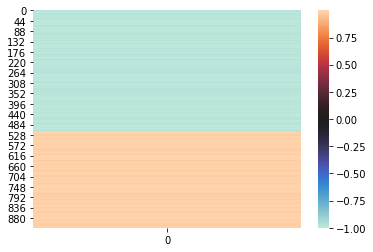

metacluster_0
activity pattern: [-1]
metacluster_0 pattern_0
total seqlets: 38
Task 0 hypothetical scores:


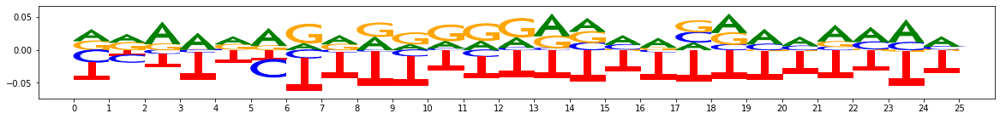

Task 0 actual importance scores:


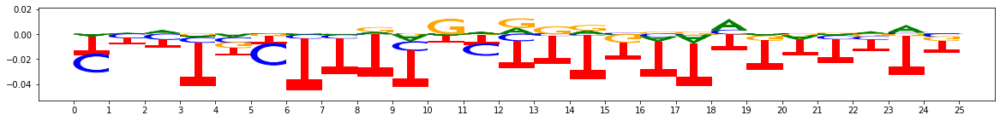

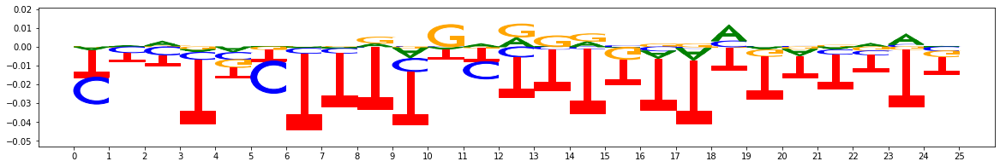

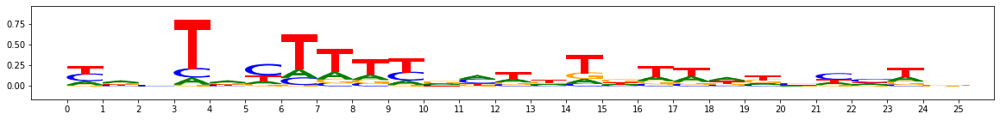

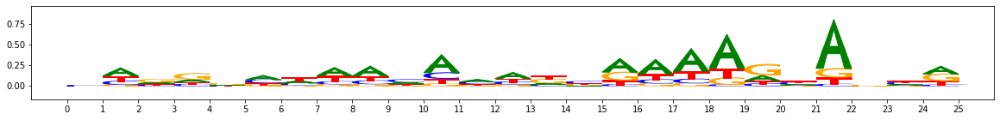

PLOTTING SUBCLUSTERS


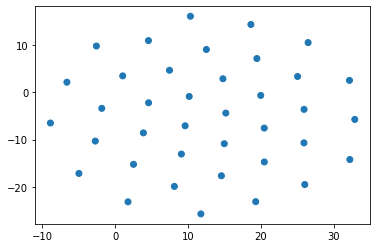

subcluster_0 size 38


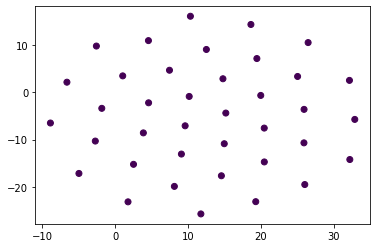

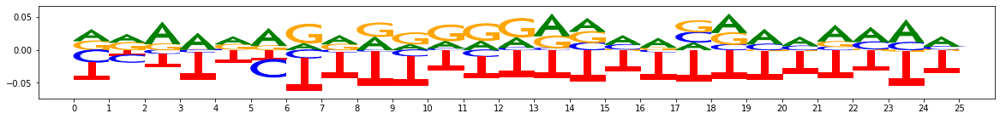

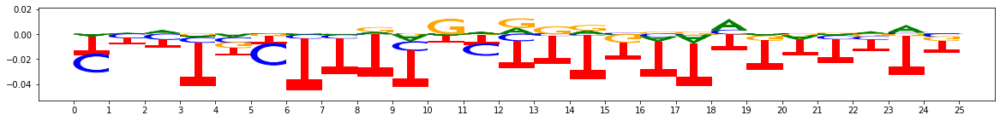

metacluster_0 pattern_1
total seqlets: 32
Task 0 hypothetical scores:


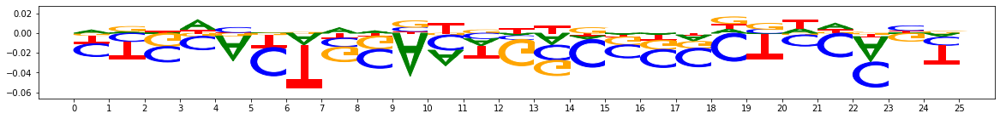

Task 0 actual importance scores:


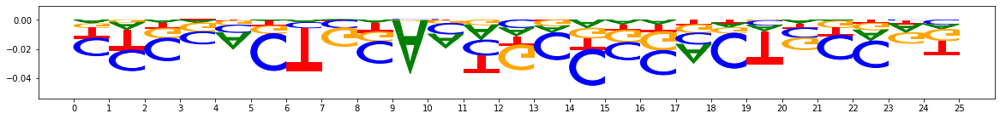

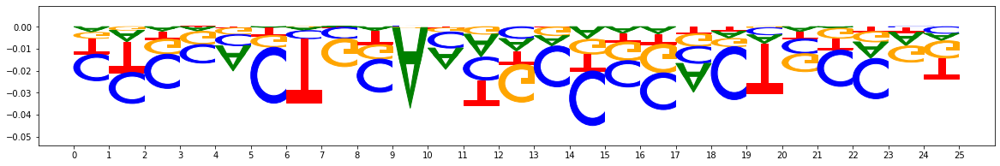

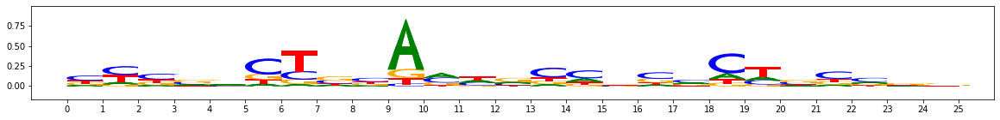

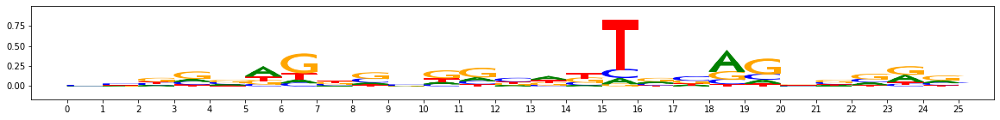

PLOTTING SUBCLUSTERS


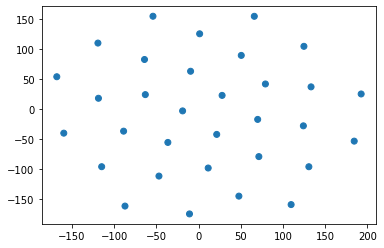

subcluster_0 size 32


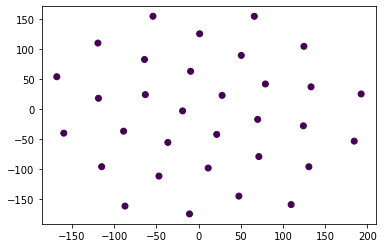

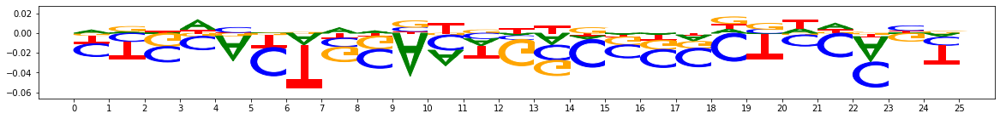

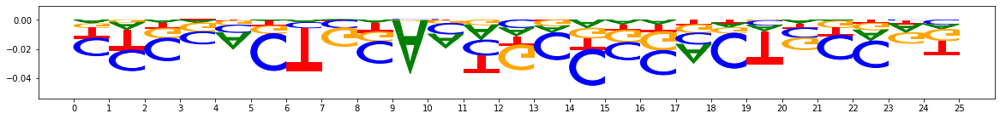

metacluster_0 pattern_2
total seqlets: 31
Task 0 hypothetical scores:


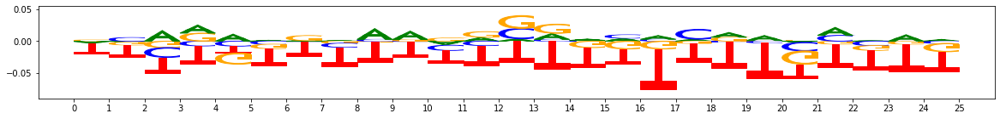

Task 0 actual importance scores:


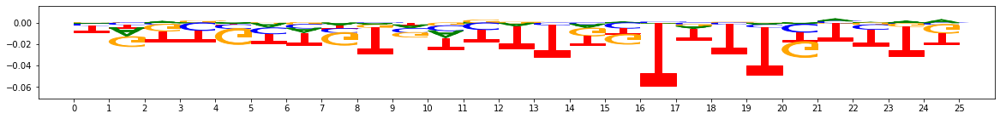

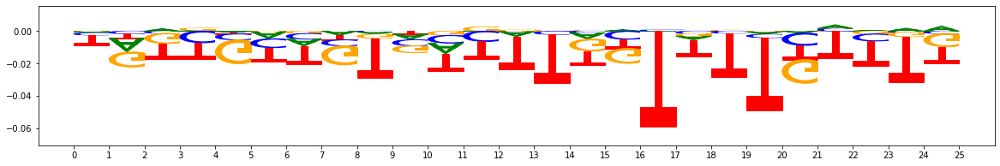

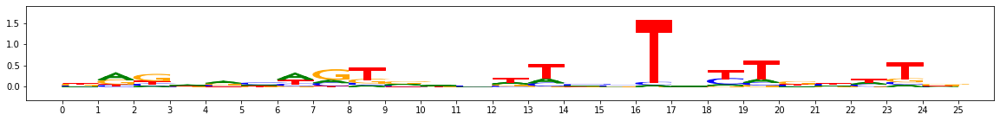

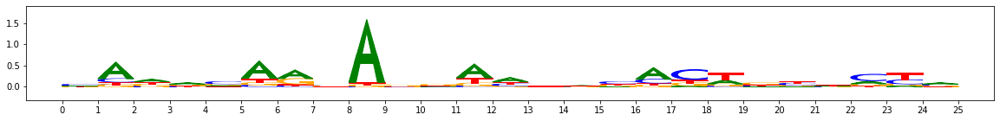

PLOTTING SUBCLUSTERS


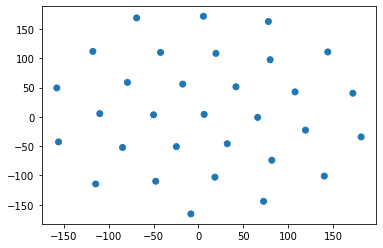

subcluster_0 size 31


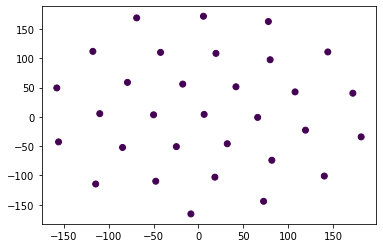

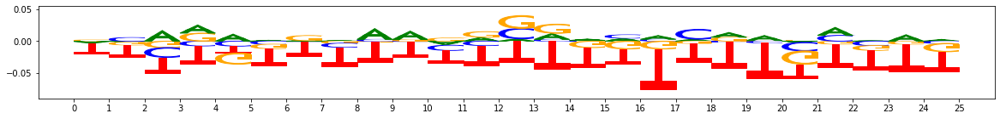

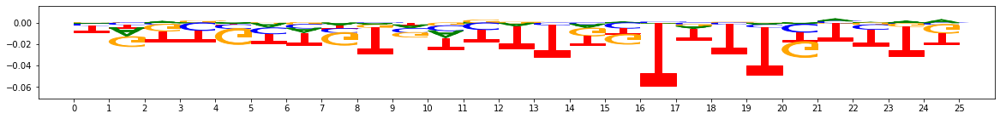

metacluster_0 pattern_3
total seqlets: 28
Task 0 hypothetical scores:


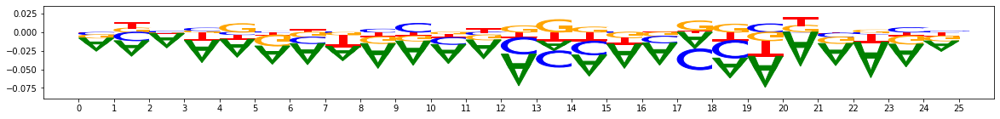

Task 0 actual importance scores:


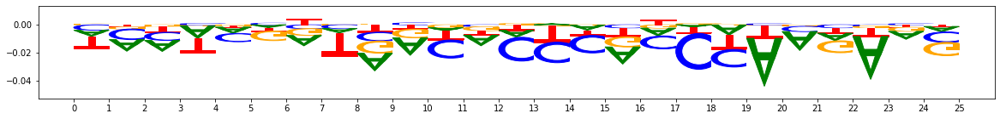

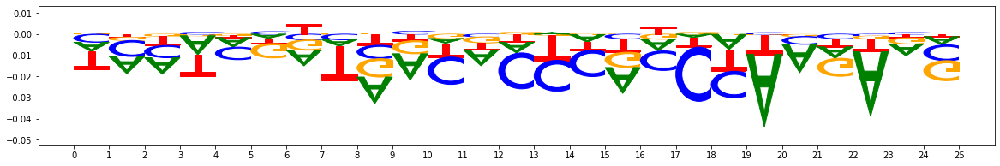

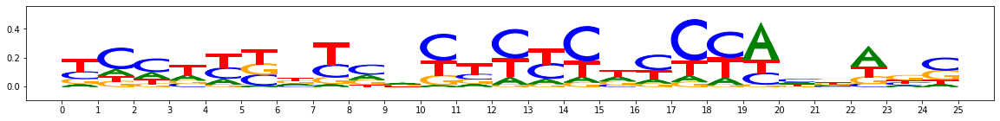

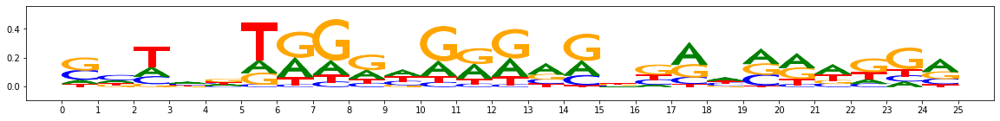

PLOTTING SUBCLUSTERS


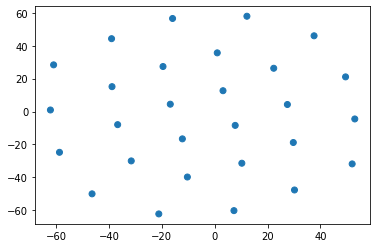

subcluster_0 size 28


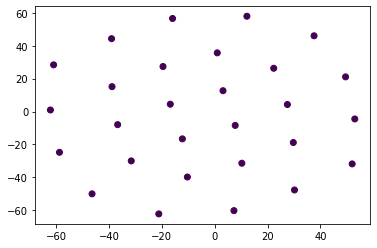

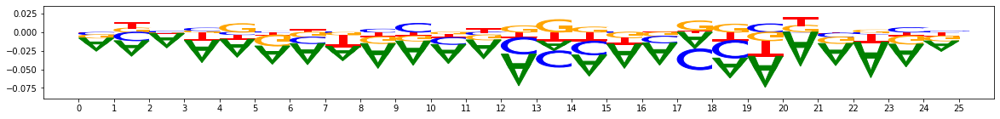

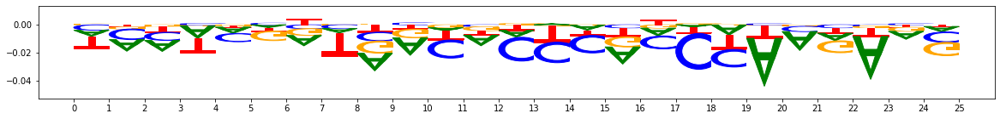

metacluster_0 pattern_4
total seqlets: 27
Task 0 hypothetical scores:


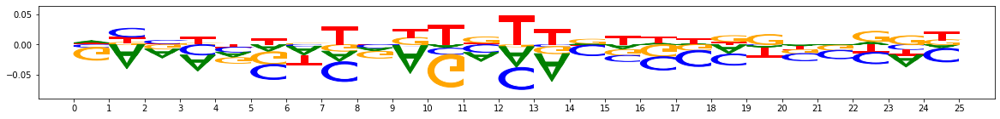

Task 0 actual importance scores:


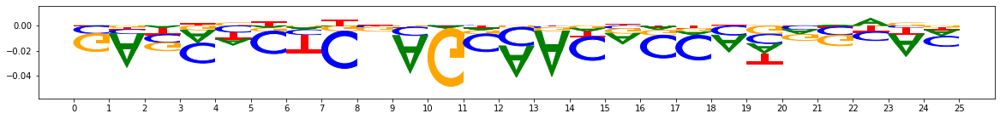

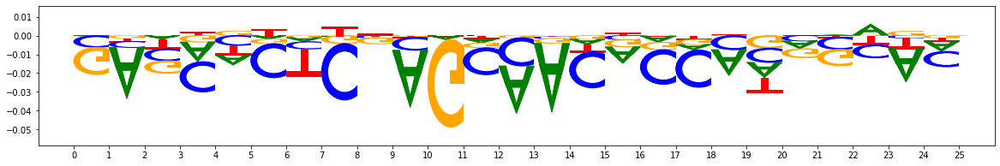

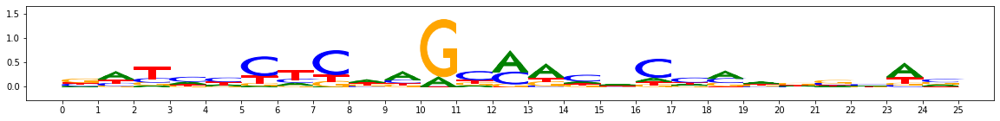

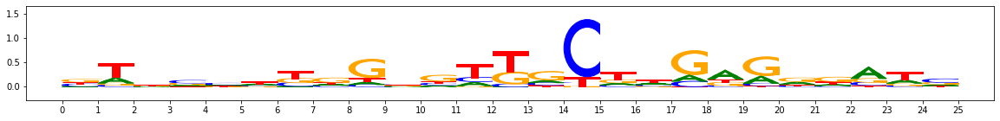

PLOTTING SUBCLUSTERS


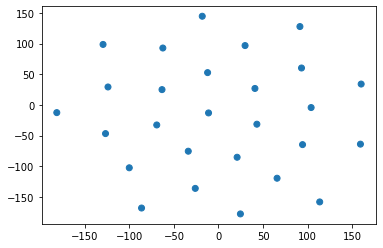

subcluster_0 size 27


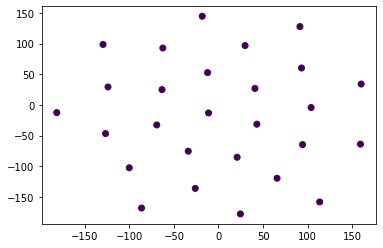

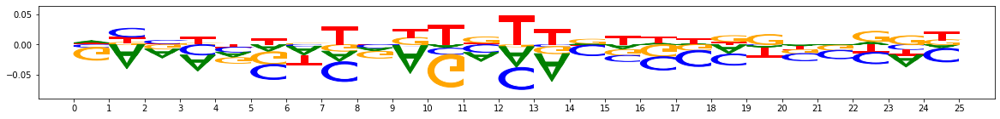

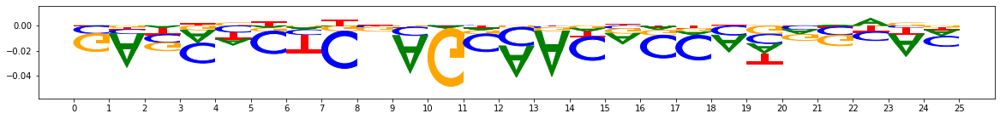

metacluster_0 pattern_5
total seqlets: 25
Task 0 hypothetical scores:


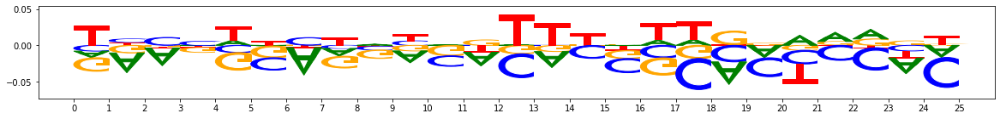

Task 0 actual importance scores:


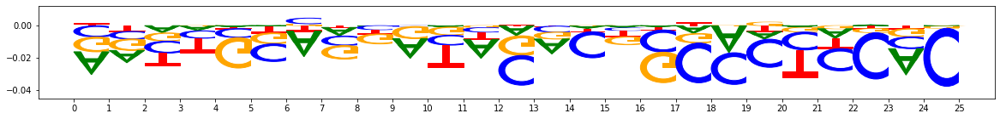

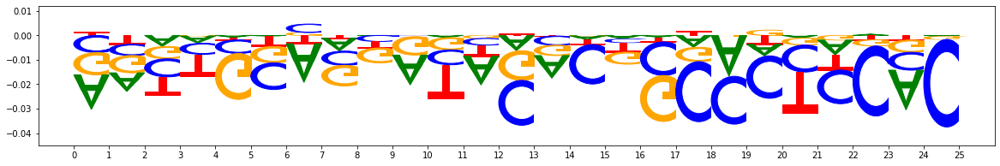

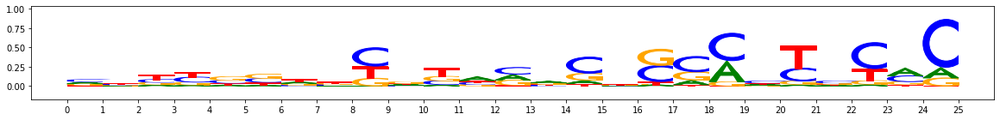

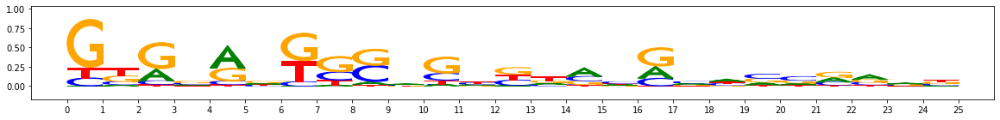

PLOTTING SUBCLUSTERS


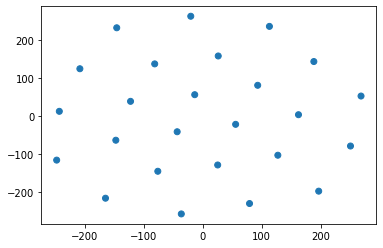

subcluster_0 size 25


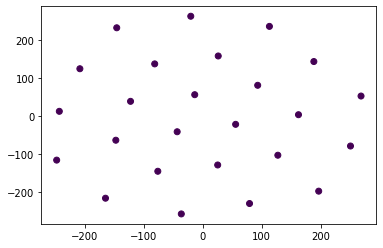

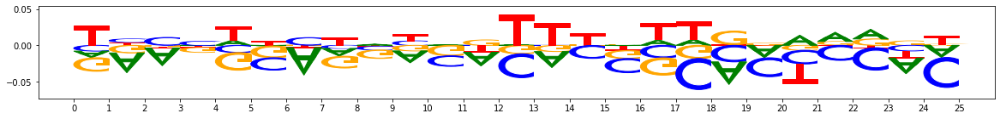

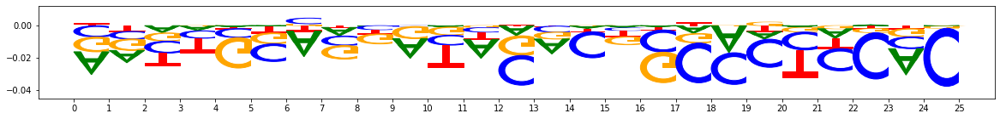

metacluster_0 pattern_6
total seqlets: 24
Task 0 hypothetical scores:


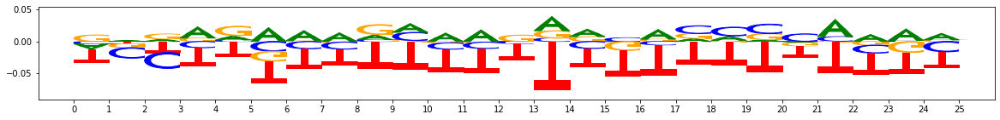

Task 0 actual importance scores:


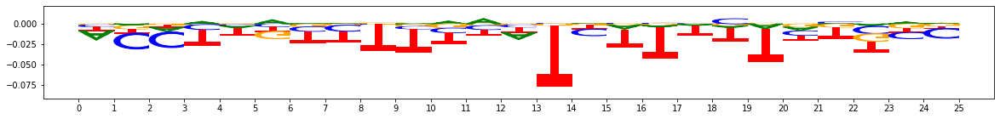

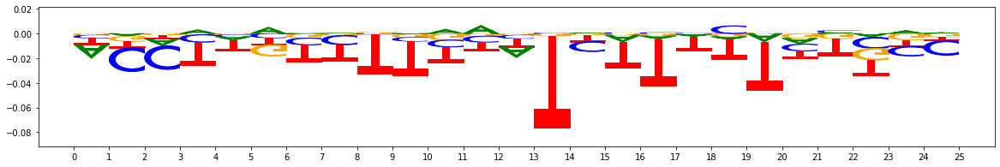

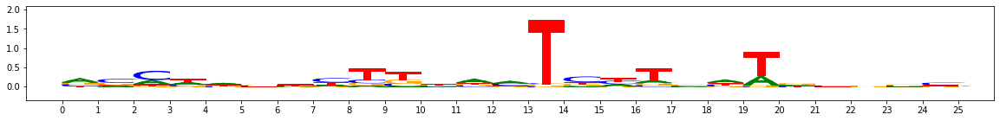

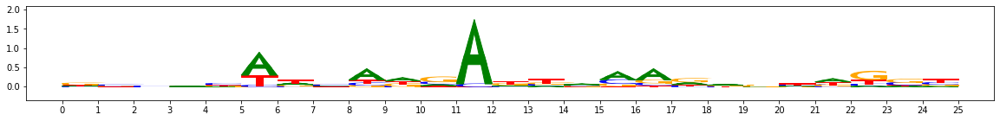

PLOTTING SUBCLUSTERS


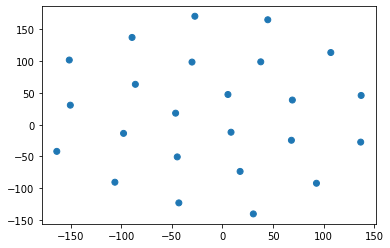

subcluster_0 size 24


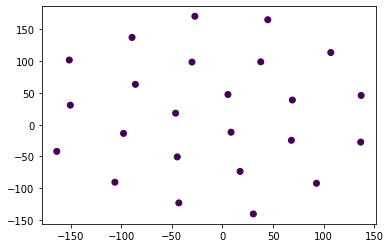

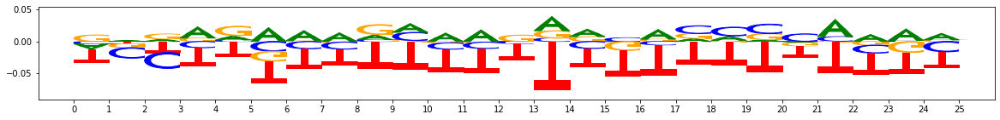

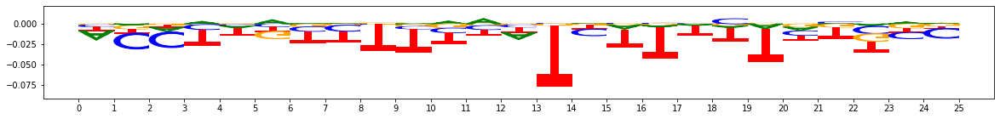

metacluster_0 pattern_7
total seqlets: 21
Task 0 hypothetical scores:


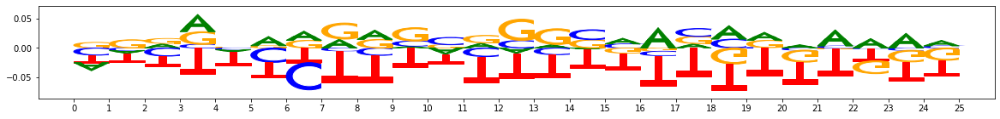

Task 0 actual importance scores:


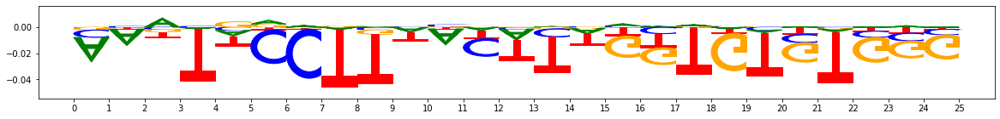

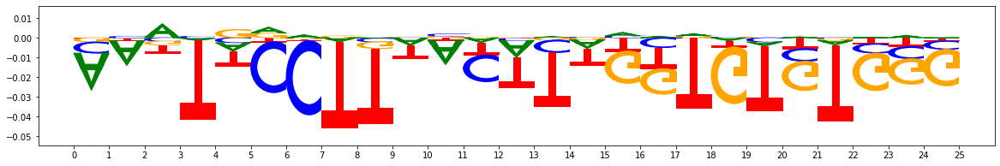

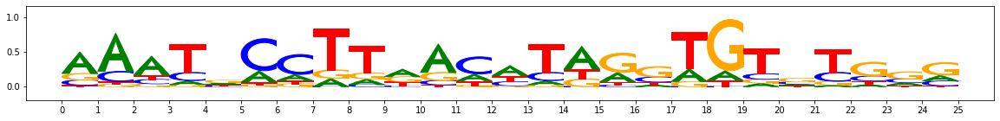

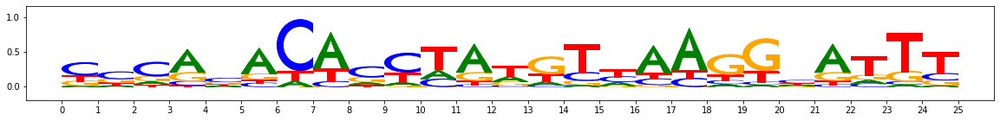

PLOTTING SUBCLUSTERS


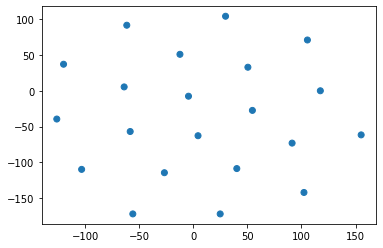

subcluster_0 size 21


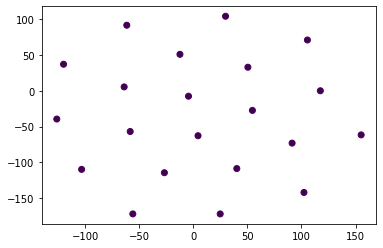

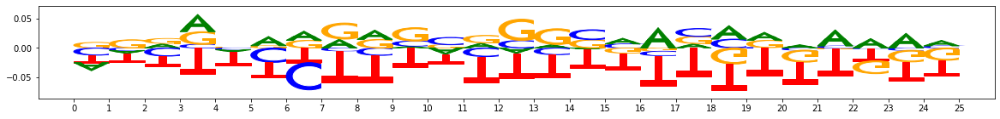

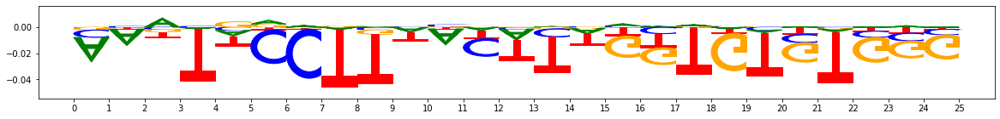

metacluster_1
activity pattern: [1]
metacluster_1 pattern_0
total seqlets: 41
Task 0 hypothetical scores:


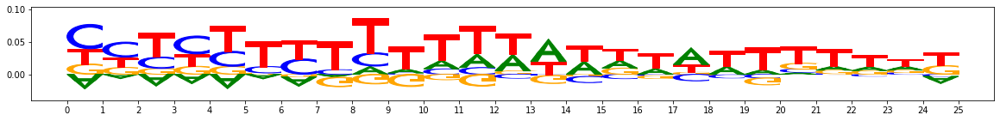

Task 0 actual importance scores:


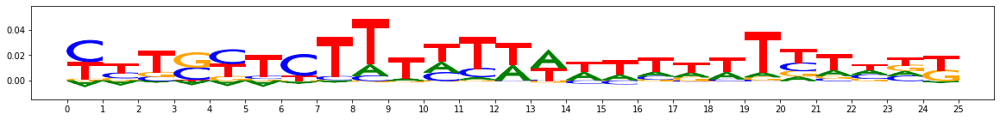

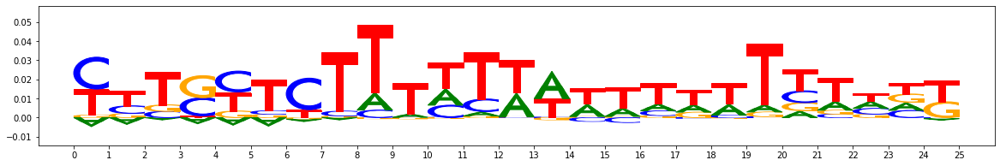

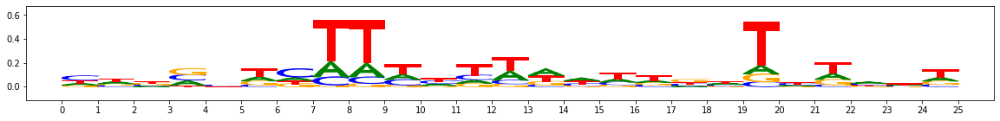

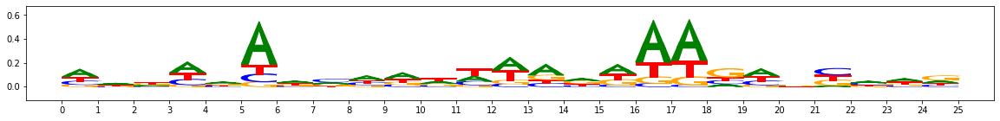

PLOTTING SUBCLUSTERS


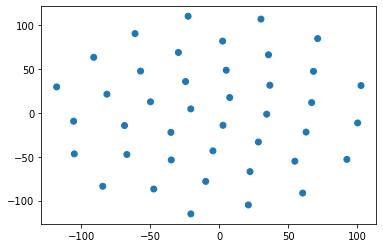

subcluster_0 size 41


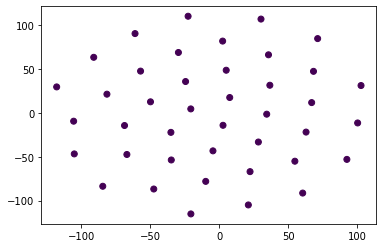

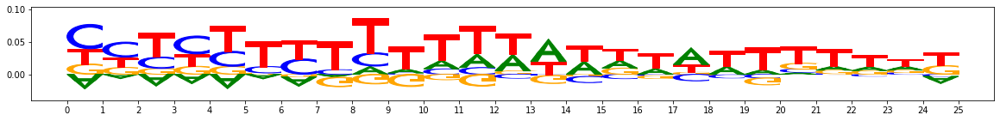

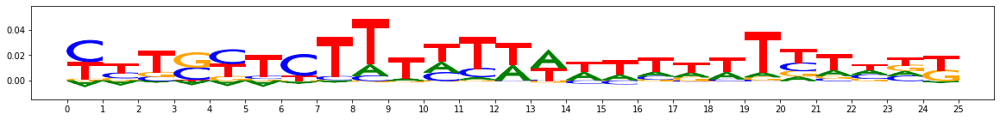

metacluster_1 pattern_1
total seqlets: 32
Task 0 hypothetical scores:


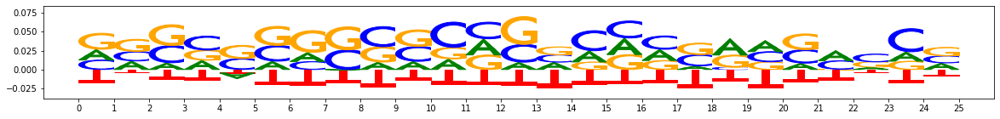

Task 0 actual importance scores:


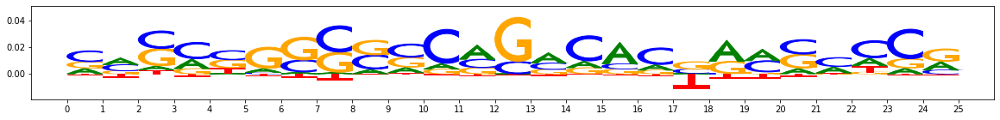

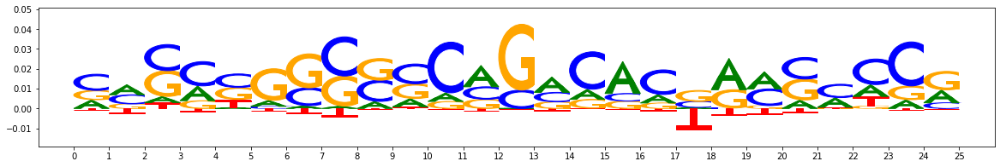

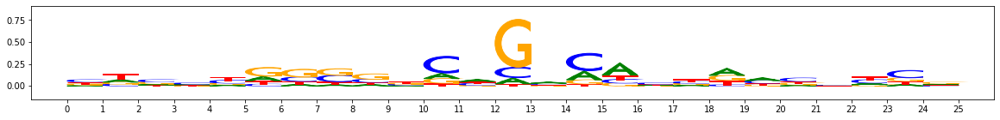

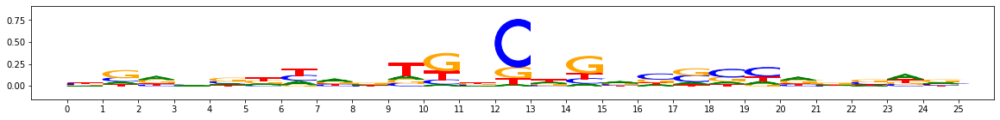

PLOTTING SUBCLUSTERS


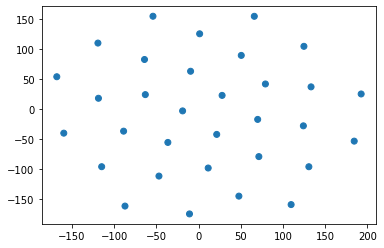

subcluster_0 size 32


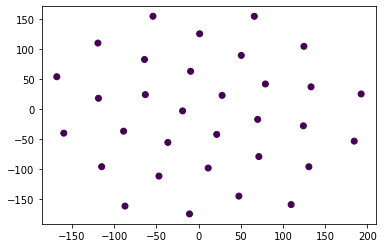

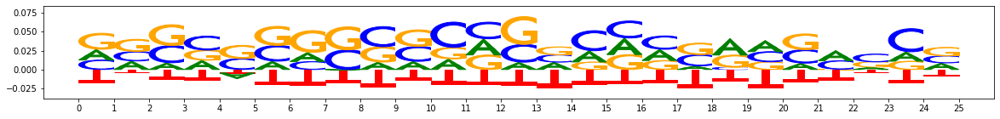

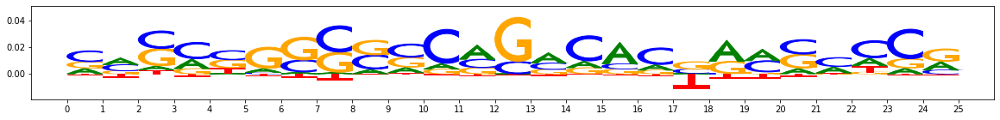

metacluster_1 pattern_2
total seqlets: 30
Task 0 hypothetical scores:


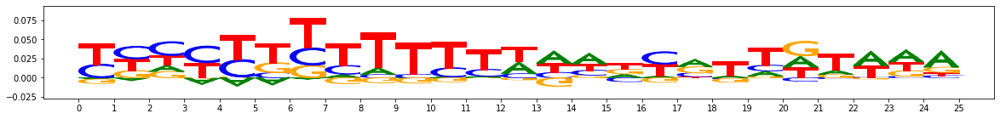

Task 0 actual importance scores:


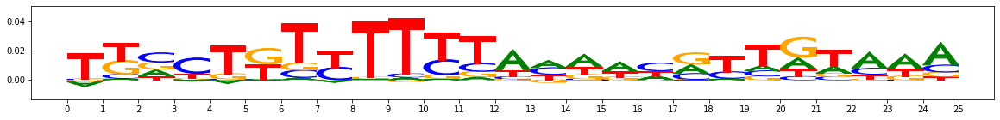

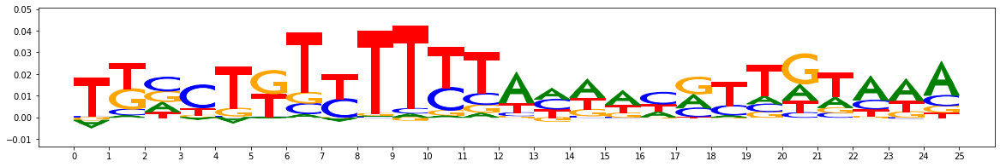

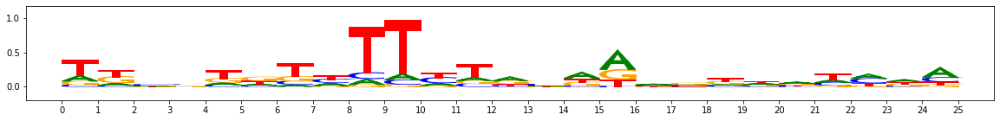

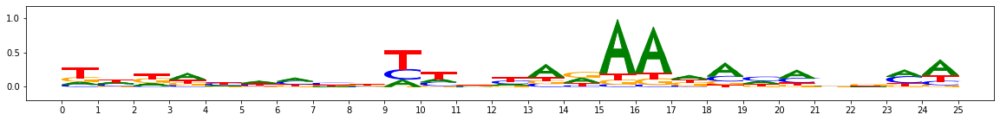

PLOTTING SUBCLUSTERS


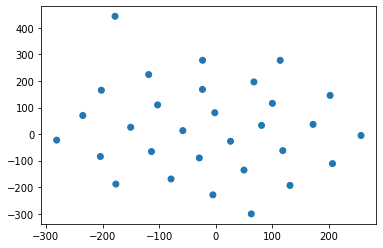

subcluster_0 size 30


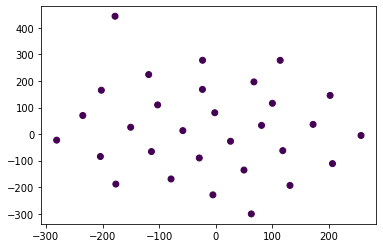

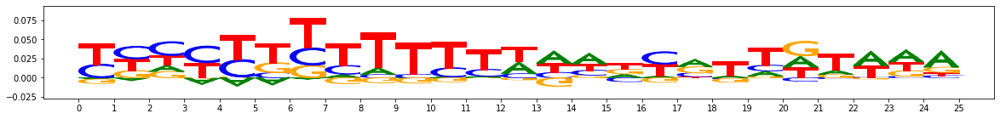

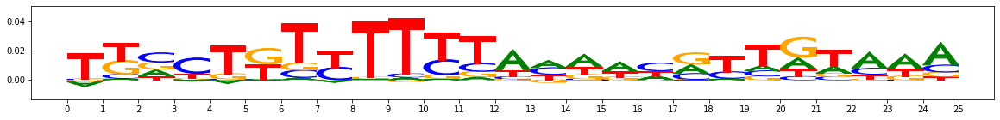

metacluster_1 pattern_3
total seqlets: 28
Task 0 hypothetical scores:


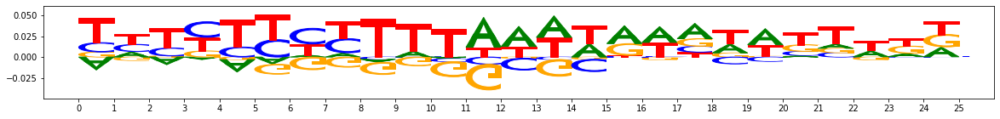

Task 0 actual importance scores:


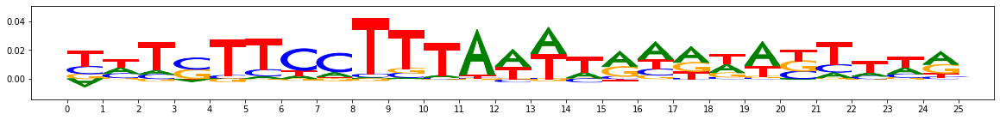

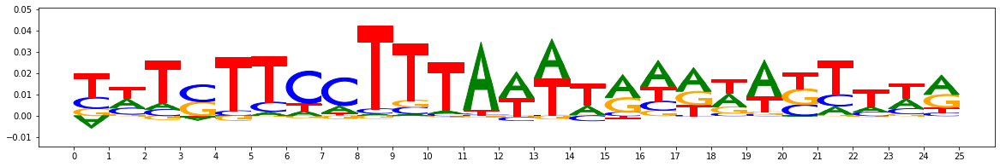

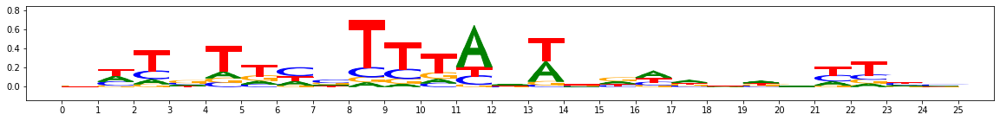

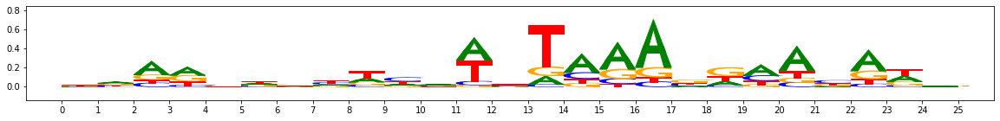

PLOTTING SUBCLUSTERS


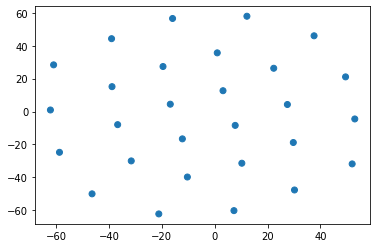

subcluster_0 size 28


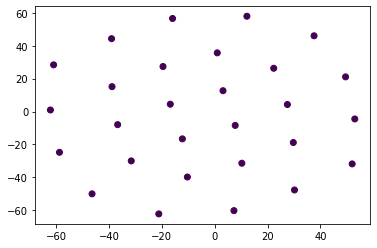

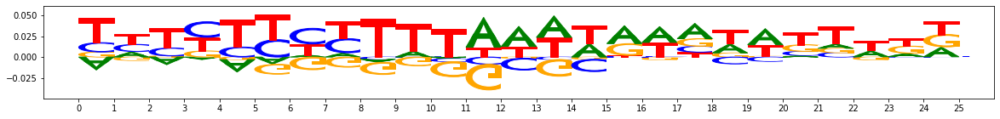

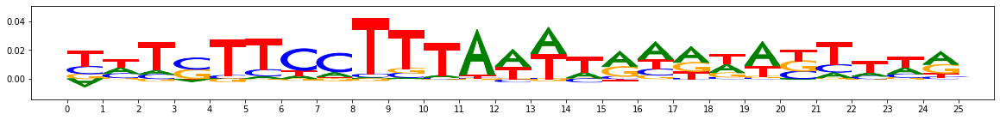

metacluster_1 pattern_4
total seqlets: 26
Task 0 hypothetical scores:


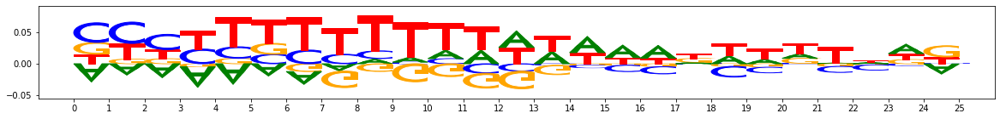

Task 0 actual importance scores:


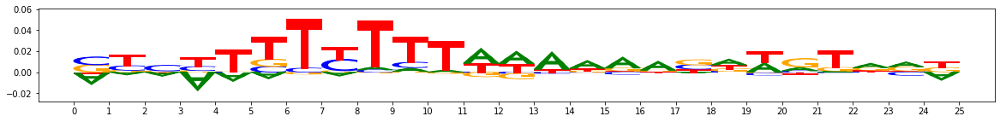

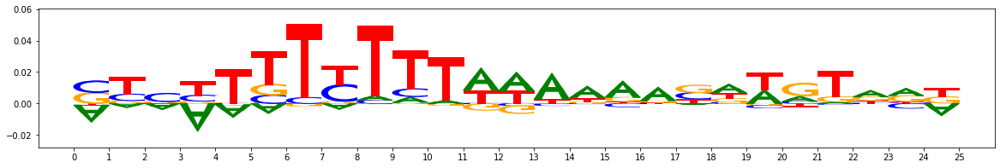

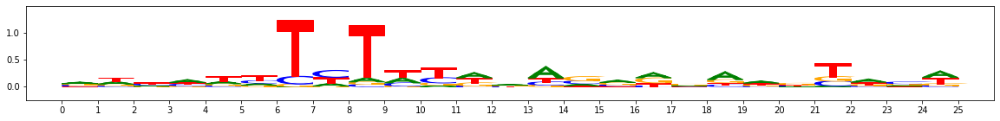

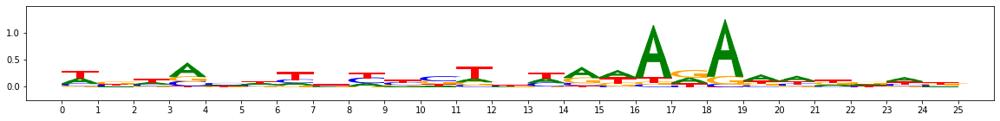

PLOTTING SUBCLUSTERS


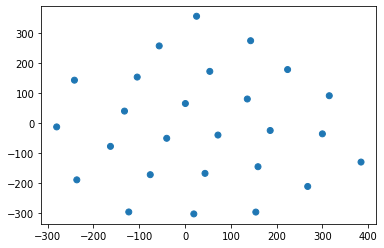

subcluster_0 size 26


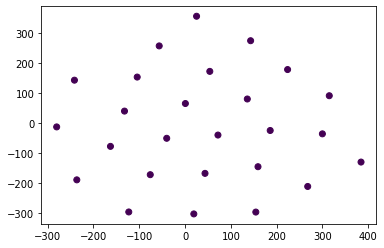

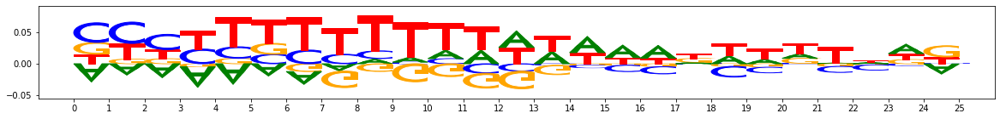

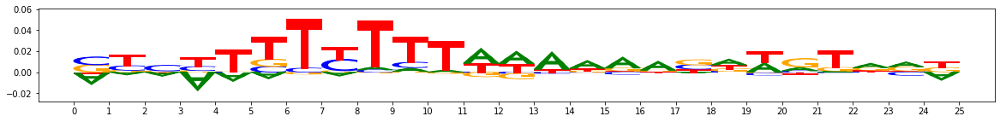

metacluster_1 pattern_5
total seqlets: 23
Task 0 hypothetical scores:


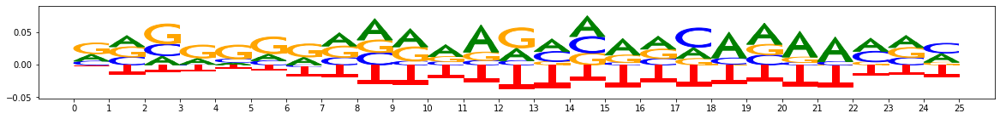

Task 0 actual importance scores:


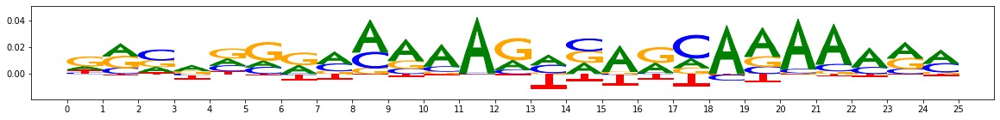

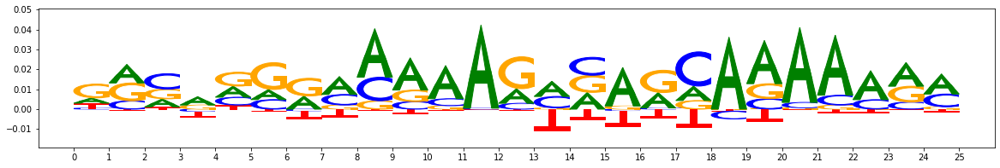

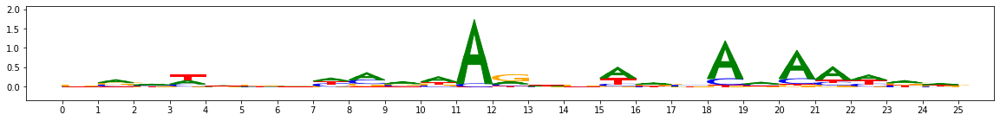

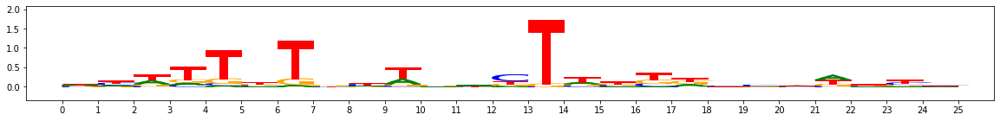

PLOTTING SUBCLUSTERS


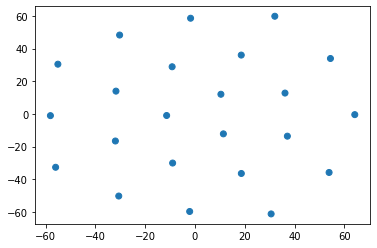

subcluster_0 size 23


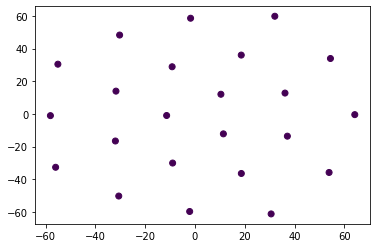

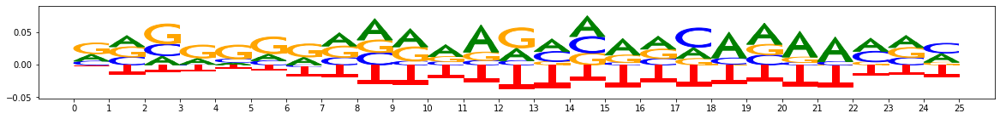

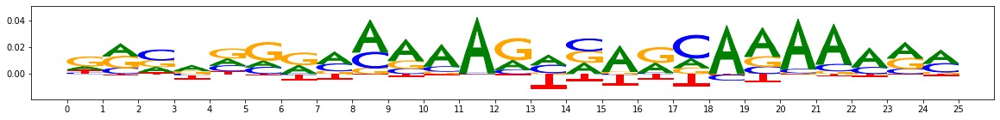

metacluster_1 pattern_6
total seqlets: 20
Task 0 hypothetical scores:


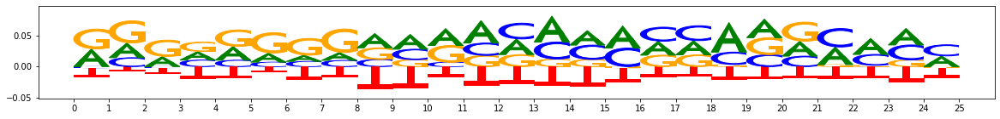

Task 0 actual importance scores:


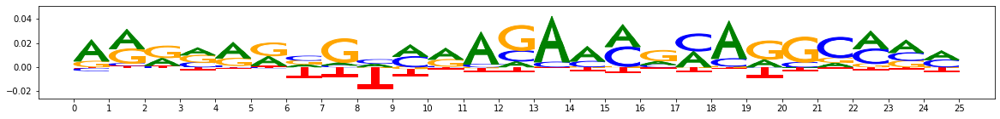

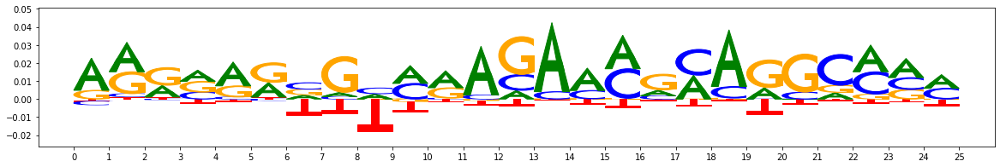

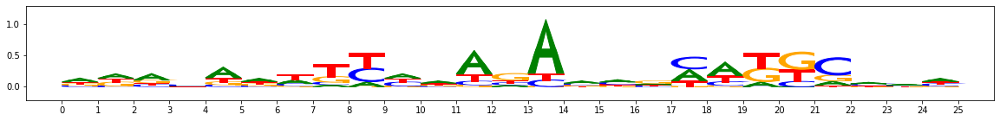

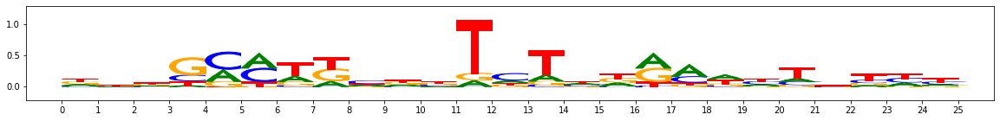

PLOTTING SUBCLUSTERS


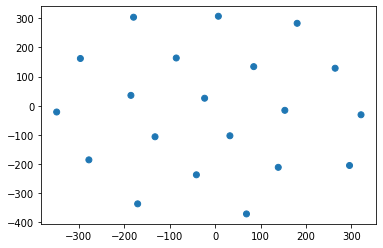

subcluster_0 size 20


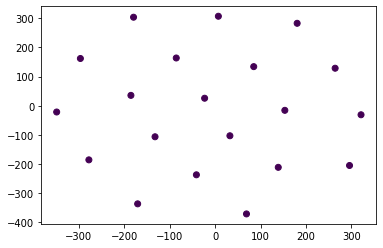

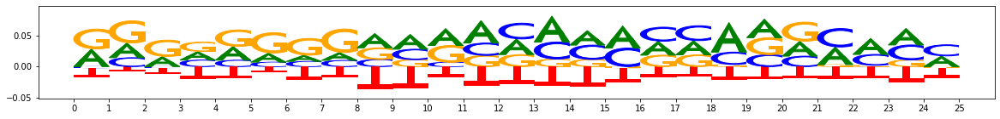

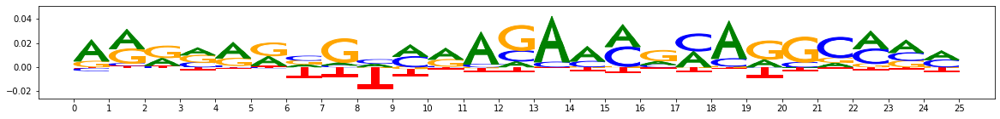

In [32]:
from collections import Counter
import numpy as np

from modisco.visualization import viz_sequence
reload(viz_sequence)
from matplotlib import pyplot as plt

import modisco.affinitymat.core
reload(modisco.affinitymat.core)
import modisco.cluster.phenograph.core
reload(modisco.cluster.phenograph.core)
import modisco.cluster.phenograph.cluster
reload(modisco.cluster.phenograph.cluster)
import modisco.cluster.core
reload(modisco.cluster.core)
import modisco.aggregator
reload(modisco.aggregator)

hdf5_results = h5py.File("tf_modisco/tRNet_modisco_results_housekeeping.hdf5","r")

print("Metaclusters heatmap")
import seaborn as sns
activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                    np.array(
        [x[0] for x in sorted(
                enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
               key=lambda x: x[1])])]
sns.heatmap(activity_patterns, center=0)
plt.show()

metacluster_names = [
    x.decode("utf-8") for x in 
    list(hdf5_results["metaclustering_results"]
         ["all_metacluster_names"][:])]

all_patterns = []
background = np.array([0.27, 0.23, 0.23, 0.27])

for metacluster_name in metacluster_names:
    print(metacluster_name)
    metacluster_grp = (hdf5_results["metacluster_idx_to_submetacluster_results"]
                                   [metacluster_name])
    print("activity pattern:",metacluster_grp["activity_pattern"][:])
    all_pattern_names = [x.decode("utf-8") for x in 
                         list(metacluster_grp["seqlets_to_patterns_result"]
                                             ["patterns"]["all_pattern_names"][:])]
    if (len(all_pattern_names)==0):
        print("No motifs found for this activity pattern")
    for pattern_name in all_pattern_names:
        print(metacluster_name, pattern_name)
        all_patterns.append((metacluster_name, pattern_name))
        pattern = metacluster_grp["seqlets_to_patterns_result"]["patterns"][pattern_name]
        print("total seqlets:",len(pattern["seqlets_and_alnmts"]["seqlets"]))
        print("Task 0 hypothetical scores:")
        viz_sequence.plot_weights(pattern["task0_hypothetical_contribs"]["fwd"])
        print("Task 0 actual importance scores:")
        viz_sequence.plot_weights(pattern["task0_contrib_scores"]["fwd"])
        #For plotting figures to a png, this code can be used...
        fig = plt.figure(figsize=(20,3))                                           
        ax = fig.add_subplot(111)
        viz_sequence.plot_weights_given_ax(ax, pattern["task0_contrib_scores"]["fwd"])
        plt.savefig("tf_modisco/" + "housekeeping_" + metacluster_name + "_activity" + str(metacluster_grp["activity_pattern"][0]) + "_" + pattern_name + "_contrib_scores.pdf")
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["fwd"]),
                                                        background=background)) 
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["rev"]),
                                                        background=background)) 
        #Plot the subclustering too, if available
        if ("subclusters" in pattern):
            print("PLOTTING SUBCLUSTERS")
            subclusters = np.array(pattern["subclusters"])
            twod_embedding = np.array(pattern["twod_embedding"])
            plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=subclusters, cmap="tab20")
            plt.show()
            for subcluster_name in list(pattern["subcluster_to_subpattern"]["subcluster_names"]):
                subpattern = pattern["subcluster_to_subpattern"][subcluster_name]
                print(subcluster_name.decode("utf-8"), "size", len(subpattern["seqlets_and_alnmts"]["seqlets"]))
                subcluster = int(subcluster_name.decode("utf-8").split("_")[1])
                plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=(subclusters==subcluster))
                viz_sequence.plot_weights(subpattern["task0_hypothetical_contribs"]["fwd"])
                viz_sequence.plot_weights(subpattern["task0_contrib_scores"]["fwd"])
        
hdf5_results.close()

### Task 1 - restricted

MEMORY 1.740034048
On task task1
Computing windowed sums on original
Generating null dist
peak(mu)= 0.00422936928607233
Computing threshold
For increasing = True , the minimum IR precision was 0.2248247613003721 occurring at 2.2427411749612047e-07 implying a frac_neg of 0.2900308860194247
To be conservative, adjusted frac neg is 0.95
For increasing = False , the minimum IR precision was 0.0 occurring at -6.38093235124336e-07 implying a frac_neg of 1.00000010000001e-07
To be conservative, adjusted frac neg is 0.95
Thresholds from null dist were -0.2023666862398386  and  0.21043757647275924 with frac passing 6.400409626216078e-05
Passing windows frac was 6.400409626216078e-05 , which is below  0.03 ; adjusting
Final raw thresholds are -0.08702604423766022  and  0.08702604423766022
Final transformed thresholds are -0.9699912222953697  and  0.9699912222953697


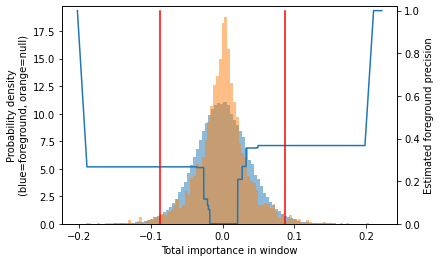

Got 1170 coords
After resolving overlaps, got 1170 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9698912222953697
MEMORY 1.740034048
1170 identified in total
2 activity patterns with support >= 100 out of 2 possible patterns
Metacluster sizes:  [587, 583]
Idx to activities:  {0: '-1', 1: '1'}
MEMORY 1.740034048
On metacluster 1
Metacluster size 583
Relevant tasks:  ('task1',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 583
(Round 1) Computing coarse affmat
MEMORY 1.740034048
Beginning embedding computation
MEMORY 1.740034048


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 121 tasks      | elapsed:    3.3s
[Parallel(n_jobs=40)]: Done 371 tasks      | elapsed:    5.0s
[Parallel(n_jobs=40)]: Done 583 out of 583 | elapsed:    6.5s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.4s
[Parallel(n_jobs=40)]: Done 504 out of 583 | elapsed:    3.9s remaining:    0.6s
[Parallel(n_jobs=40)]: Done 583 out of 583 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 583 out of 583 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.12151908874511719 s


[Parallel(n_jobs=1)]: Done 583 out of 583 | elapsed:    1.3s finished


Constructing csr matrix...
csr matrix made in 0.11755728721618652 s
Finished embedding computation in 14.19 s
MEMORY 1.7662976
Starting affinity matrix computations
MEMORY 1.7662976
Batching in slices of size 583


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

Finished affinity matrix computations in 1.26 s
MEMORY 1.7662976
(Round 1) Computed coarse affmat
MEMORY 1.764462592
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 1.764462592
Launching nearest neighbors affmat calculation job
MEMORY 1.764462592


Parallel runs completed
MEMORY 1.788493824
Job completed in: 8.09 s
MEMORY 1.788493824
Launching nearest neighbors affmat calculation job
MEMORY 1.788493824
Parallel runs completed
MEMORY 1.789759488
Job completed in: 7.28 s
MEMORY 1.789759488
(Round 1) Computed affinity matrix on nearest neighbors in 15.59 s
MEMORY 1.723314176
Filtered down to 529 of 583
(Round 1) Retained 529 rows out of 583 after filtering
MEMORY 1.723314176
(Round 1) Computing density adapted affmat
MEMORY 1.723314176
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 1.775337472
Beginning preprocessing + Leiden
Affmat shape: 529


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    1.7s remaining:    2.2s


Quality: 0.023764408432451048
Quality: 0.023772802168592837
Quality: 0.023844966222819924
Got 4 clusters after round 1
Counts:
{0: 226, 2: 82, 1: 202, 3: 19}
MEMORY 1.775337472
(Round 1) Aggregating seqlets in each cluster
MEMORY 1.775337472
Aggregating for cluster 0 with 226 seqlets
MEMORY 1.775337472
Skipped 2 seqlets that went over the sequence edge during flank expansion


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    2.7s finished


Skipped 8 seqlets that went over sequence edge during flank expansion
Skipped 3 due to duplicates
Trimming eliminated 0 seqlets out of 213
Skipped 3 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 202 seqlets
MEMORY 1.775337472
Skipped 2 seqlets that went over the sequence edge during flank expansion
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 54 seqlets that went over sequence edge during flank expansion
Skipped 2 due to duplicates
Trimming eliminated 0 seqlets out of 143
Skipped 17 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 82 seqlets
MEMORY 1.775337472
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 8 seqlets that went over sequence edge during flank expansion
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 72
Skipped 1 seqlets that went over the sequence edge during flank expansion
Aggregating for

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.4s
[Parallel(n_jobs=40)]: Done 345 out of 424 | elapsed:    2.6s remaining:    0.6s
[Parallel(n_jobs=40)]: Done 424 out of 424 | elapsed:    3.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 345 out of 424 | elapsed:    2.6s remaining:    0.6s
[Parallel(n_jobs=40)]: Done 424 out of 424 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 424 out of 424 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.0809028148651123 s


[Parallel(n_jobs=1)]: Done 424 out of 424 | elapsed:    1.0s finished


Constructing csr matrix...
csr matrix made in 0.0817863941192627 s
Finished embedding computation in 8.41 s
MEMORY 1.780412416
Starting affinity matrix computations
MEMORY 1.780412416
Batching in slices of size 424


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

Finished affinity matrix computations in 1.21 s
MEMORY 1.780412416
(Round 2) Computed coarse affmat
MEMORY 1.77944576
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 1.77944576
Launching nearest neighbors affmat calculation job
MEMORY 1.77944576


Parallel runs completed
MEMORY 1.781530624
Job completed in: 5.27 s
MEMORY 1.781530624
Launching nearest neighbors affmat calculation job
MEMORY 1.781530624
Parallel runs completed
MEMORY 1.84539136
Job completed in: 5.42 s
MEMORY 1.84539136
(Round 2) Computed affinity matrix on nearest neighbors in 10.97 s
MEMORY 1.84539136
Not applying filtering for rounds above first round
MEMORY 1.84539136
(Round 2) Computing density adapted affmat
MEMORY 1.84539136
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 1.843884032
Beginning preprocessing + Leiden
Affmat shape: 424


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    1.2s remaining:    1.6s


Quality: 0.019421726853197104
Quality: 0.019456841742757084
Quality: 0.019530062152061503
Quality: 0.01953332892655035
Quality: 0.019544645307734004
Got 6 clusters after round 2
Counts:
{4: 6, 0: 158, 3: 24, 2: 100, 1: 135, 5: 1}
MEMORY 1.843884032
(Round 2) Aggregating seqlets in each cluster
MEMORY 1.843884032
Aggregating for cluster 0 with 158 seqlets
MEMORY 1.843884032


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.8s finished


Skipped 7 due to duplicates
Trimming eliminated 0 seqlets out of 151
Aggregating for cluster 1 with 135 seqlets
MEMORY 1.843884032
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 1 seqlets that went over sequence edge during flank expansion
Skipped 3 due to duplicates
Trimming eliminated 0 seqlets out of 129
Skipped 8 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 100 seqlets
MEMORY 1.843884032
Skipped 3 seqlets that went over the sequence edge during flank expansion
Skipped 1 seqlets that went over sequence edge during flank expansion
Skipped 3 due to duplicates
Trimming eliminated 0 seqlets out of 93
Skipped 2 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 24 seqlets
MEMORY 1.843884032
Trimming eliminated 0 seqlets out of 24
Aggregating for cluster 4 with 6 seqlets
MEMORY 1.843884032

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.


[t-SNE] Computed conditional probabilities for sample 151 / 151
[t-SNE] Mean sigma: 0.477420
Beginning preprocessing + Leiden


[Parallel(n_jobs=40)]: Done 151 out of 151 | elapsed:    0.2s finished


Affmat shape: 151


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.2126672942224892
Quality: 0.2129719519557547
Quality: 0.2141720919323159
Got subclusters: Counter({0: 36, 1: 33, 2: 30, 3: 23, 4: 13, 5: 12, 6: 4})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


Numbers for each pattern pre-subsample: [36, 33, 30, 23, 13, 12, 4]
Numbers after subsampling: [36, 33, 30, 23, 13, 12, 4]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.640662431716919 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.606407880783081 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.5755581855773926 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.47585630416870117 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.33762192726135254 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.3099813461303711 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.17583847045898438 s
Cluster sizes
[36 33 30 23 13 12  4]
Cross-contamination matrix:
[[1.   0.58 0.77 0.67 0.54 0.6  0.83]
 [0.66 1.   0.72 0.71 0.7  0.62 0.54]
 [0.71 0.59 1.   0.64 0.69 0.65 0.47]
 [0.74 0.7  0.77 1.   0.52 0.64 0.7 ]
 [0.46 0.55 0.65 0.42 1.   0.41 0.46]
 [0.49 0.46 0.54 0.49 0.37 1.   0.54]
 [0.07 0.01 0.07

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 121 out of 121 | elapsed:    0.2s finished


[t-SNE] Computed conditional probabilities for sample 121 / 121
[t-SNE] Mean sigma: 0.709473
Beginning preprocessing + Leiden
Affmat shape: 121


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.1722388301576276
Quality: 0.17415638994648025
Got subclusters: Counter({0: 32, 1: 32, 2: 25, 3: 18, 4: 14})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


Numbers for each pattern pre-subsample: [32, 32, 25, 18, 14]
Numbers after subsampling: [32, 32, 25, 18, 14]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.37993931770324707 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.409290075302124 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.30928754806518555 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.2527782917022705 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.18971586227416992 s
Cluster sizes
[32 32 25 18 14]
Cross-contamination matrix:
[[1.   0.44 0.54 0.48 0.55]
 [0.55 1.   0.63 0.68 0.6 ]
 [0.72 0.68 1.   0.56 0.61]
 [0.63 0.7  0.57 1.   0.67]
 [0.37 0.44 0.47 0.54 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.29 0.38 0.2  0.26]
 [0.29 1.   0.3  0.33 0.28]
 [0.38 0.3  1.   0.21 0.27]
 [0.2  0.33 0.21 1.   0.35]
 [0.26 0.28 0.27 0.35 1.  ]]
Inspecting pattern 2 for spurious merging
[t-SNE] Computed conditional probabilities for sample 91 / 91
[t-SNE] 

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  91 out of  91 | elapsed:    0.1s finished


Affmat shape: 91


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 0.1509700099537698
Quality: 0.15171313610136458
Quality: 0.15302636289130406
Got subclusters: Counter({0: 26, 1: 25, 2: 21, 3: 19})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


Numbers for each pattern pre-subsample: [26, 25, 21, 19]
Numbers after subsampling: [26, 25, 21, 19]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.206817626953125 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.20940685272216797 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.1580502986907959 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.17358040809631348 s
Cluster sizes
[26 25 21 19]
Cross-contamination matrix:
[[1.   0.65 0.71 0.72]
 [0.47 1.   0.65 0.47]
 [0.44 0.63 1.   0.6 ]
 [0.56 0.6  0.7  1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.52 0.39 0.44]
 [0.52 1.   0.53 0.44]
 [0.39 0.53 1.   0.43]
 [0.44 0.44 0.43 1.  ]]
Inspecting pattern 3 for spurious merging
Inspecting pattern 4 for spurious merging
Inspecting pattern 5 for spurious merging
Merging on 19 clusters
MEMORY 1.843888128
On merging iteration 1
Numbers for each pattern pre-subsample: [36, 33, 30, 23, 13, 12, 4, 32, 32, 25, 18, 14, 26, 25, 21, 19, 24, 5,

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  31 out of  36 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  36 out of  36 | elapsed:    0.0s finished
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/neighbors/_base.py:176: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Iteration 300: error = 0.6283594, gradient norm = 0.0009790 (50 iterations in 0.016s)
[t-SNE] Iteration 350: error = 0.5552555, gradient norm = 0.0002434 (50 iterations in 0.013s)
[t-SNE] Iteration 400: error = 0.5494674, gradient norm = 0.0001003 (50 iterations in 0.013s)
[t-SNE] Iteration 450: error = 0.5440707, gradient norm = 0.0001044 (50 iterations in 0.013s)
[t-SNE] Iteration 500: error = 0.5421765, gradient norm = 0.0000419 (50 iterations in 0.013s)
[t-SNE] Iteration 550: error = 0.5416034, gradient norm = 0.0000406 (50 iterations in 0.013s)
[t-SNE] Iteration 600: error = 0.5414145, gradient norm = 0.0000183 (50 iterations in 0.013s)
[t-SNE] Iteration 650: error = 0.5412565, gradient norm = 0.0000195 (50 iterations in 0.013s)
[t-SNE] Iteration 700: error = 0.5412174, gradient norm = 0.0000142 (50 iterations in 0.013s)
[t-SNE] Iteration 750: error = 0.5412329, gradient norm = 0.0000140 (50 iterations in 0.013s)
[t-SNE] Iteration 800: error = 0.5412085, gradient norm = 0.

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 2.2204460492503205e-16


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  33 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  33 out of  33 | elapsed:    0.0s finished


Got subclusters: Counter({0: 36})
On pattern 1
[t-SNE] Computing 32 nearest neighbors...
[t-SNE] Indexed 33 samples in 0.001s...
[t-SNE] Computed neighbors for 33 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 33 / 33
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.007s
[t-SNE] Iteration 50: error = 48.5405884, gradient norm = 0.4377354 (50 iterations in 0.068s)
[t-SNE] Iteration 100: error = 45.3991013, gradient norm = 0.5557608 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 44.4410133, gradient norm = 0.3995883 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 44.2869720, gradient norm = 0.5348366 (50 iterations in 0.013s)
[t-SNE] Iteration 250: error = 44.4692688, gradient norm = 0.5517282 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 44.469269
[t-SNE] Iteration 300: error = 0.6880248, gradient norm = 0.0010766 (50 iterations in 0.013s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: -7.105427357600852e-15


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  19 out of  32 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  32 out of  32 | elapsed:    0.0s finished


Got subclusters: Counter({0: 33})
On pattern 2
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.001s...
[t-SNE] Computed neighbors for 32 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 45.0391579, gradient norm = 0.5915984 (50 iterations in 0.019s)
[t-SNE] Iteration 100: error = 41.5301628, gradient norm = 0.6421952 (50 iterations in 0.014s)
[t-SNE] Iteration 150: error = 41.7794228, gradient norm = 0.5639641 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 42.5937614, gradient norm = 0.5189880 (50 iterations in 0.013s)
[t-SNE] Iteration 250: error = 48.9627724, gradient norm = 0.4000197 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.962772
[t-SNE] Iteration 300: error = 0.5347084, gradient norm = 0.0006481 (50 iterations in 0.013s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 2.0650148258028073e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  19 out of  32 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  32 out of  32 | elapsed:    0.0s finished


Got subclusters: Counter({0: 32})
On pattern 3
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.001s...
[t-SNE] Computed neighbors for 32 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.008s
[t-SNE] Iteration 50: error = 45.0391617, gradient norm = 0.5915984 (50 iterations in 0.081s)
[t-SNE] Iteration 100: error = 41.5301628, gradient norm = 0.6421952 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 41.7794266, gradient norm = 0.5639641 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 42.5937614, gradient norm = 0.5189880 (50 iterations in 0.013s)
[t-SNE] Iteration 250: error = 48.9627724, gradient norm = 0.4000197 (50 iterations in 0.016s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.962772
[t-SNE] Iteration 300: error = 0.5347084, gradient norm = 0.0006481 (50 iterations in 0.013s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 2.042810365310304e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  13 out of  30 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  30 out of  30 | elapsed:    0.0s finished


Got subclusters: Counter({0: 32})
On pattern 4
[t-SNE] Computing 29 nearest neighbors...
[t-SNE] Indexed 30 samples in 0.002s...
[t-SNE] Computed neighbors for 30 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 30 / 30
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 43.2136459, gradient norm = 0.3478597 (50 iterations in 0.044s)
[t-SNE] Iteration 100: error = 44.5518456, gradient norm = 0.6739807 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 43.4177361, gradient norm = 0.7131931 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 41.6086464, gradient norm = 0.7720285 (50 iterations in 0.013s)
[t-SNE] Iteration 250: error = 44.0026741, gradient norm = 0.6494718 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 44.002674
[t-SNE] Iteration 300: error = 0.5412545, gradient norm = 0.0008786 (50 iterations in 0.013s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 1.9095836023552904e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  26 out of  26 | elapsed:    0.0s finished


Got subclusters: Counter({0: 30})
On pattern 5
[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 26 samples in 0.001s...
[t-SNE] Computed neighbors for 26 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 26 / 26
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 45.2910004, gradient norm = 0.6804135 (50 iterations in 0.034s)
[t-SNE] Iteration 100: error = 47.0380325, gradient norm = 0.4849893 (50 iterations in 0.034s)
[t-SNE] Iteration 150: error = 45.5909691, gradient norm = 0.6228424 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 45.9993744, gradient norm = 0.5189822 (50 iterations in 0.013s)
[t-SNE] Iteration 250: error = 43.9974518, gradient norm = 0.6744986 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.997452
[t-SNE] Iteration 300: error = 0.5115682, gradient norm = 0.0007732 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 1.7763568394002767e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  25 out of  25 | elapsed:    0.0s finished


Got subclusters: Counter({0: 26})
On pattern 6
[t-SNE] Computing 24 nearest neighbors...
[t-SNE] Indexed 25 samples in 0.002s...
[t-SNE] Computed neighbors for 25 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 25 / 25
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 48.3642387, gradient norm = 0.4966776 (50 iterations in 0.018s)
[t-SNE] Iteration 100: error = 51.4994125, gradient norm = 0.5245329 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 41.6517677, gradient norm = 0.7918428 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 47.2219276, gradient norm = 0.3785344 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 41.7042122, gradient norm = 0.6758102 (50 iterations in 0.015s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 41.704212
[t-SNE] Iteration 300: error = 0.7896507, gradient norm = 0.0010434 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: -1.332267629550175e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  25 out of  25 | elapsed:    0.0s finished


Got subclusters: Counter({0: 25})
On pattern 7
[t-SNE] Computing 24 nearest neighbors...
[t-SNE] Indexed 25 samples in 0.002s...
[t-SNE] Computed neighbors for 25 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 25 / 25
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 48.3642426, gradient norm = 0.4966776 (50 iterations in 0.061s)
[t-SNE] Iteration 100: error = 51.4994164, gradient norm = 0.5245329 (50 iterations in 0.012s)
[t-SNE] Iteration 150: error = 41.6517601, gradient norm = 0.7918428 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 47.2219276, gradient norm = 0.3785344 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 41.7042046, gradient norm = 0.6758102 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 41.704205
[t-SNE] Iteration 300: error = 0.7896508, gradient norm = 0.0010434 (50 iterations in 0.013s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: -1.332267629550175e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  20 out of  24 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  24 out of  24 | elapsed:    0.0s finished


Got subclusters: Counter({0: 25})
On pattern 8
[t-SNE] Computing 23 nearest neighbors...
[t-SNE] Indexed 24 samples in 0.001s...
[t-SNE] Computed neighbors for 24 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 24 / 24
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 49.2344131, gradient norm = 0.5288350 (50 iterations in 0.017s)
[t-SNE] Iteration 100: error = 50.6861191, gradient norm = 0.5744531 (50 iterations in 0.012s)
[t-SNE] Iteration 150: error = 45.8535461, gradient norm = 0.6550605 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 44.3336449, gradient norm = 0.3698129 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 48.0599899, gradient norm = 0.5015129 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.059990
[t-SNE] Iteration 300: error = 0.4756823, gradient norm = 0.0007955 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 6.061817714453333e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  16 out of  23 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  23 out of  23 | elapsed:    0.0s finished


Got subclusters: Counter({0: 24})
On pattern 9
[t-SNE] Computing 22 nearest neighbors...
[t-SNE] Indexed 23 samples in 0.001s...
[t-SNE] Computed neighbors for 23 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 23 / 23
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 46.0002785, gradient norm = 0.4982804 (50 iterations in 0.019s)
[t-SNE] Iteration 100: error = 44.1054688, gradient norm = 0.5513866 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 48.6218987, gradient norm = 0.4345824 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 44.8836594, gradient norm = 0.4291351 (50 iterations in 0.013s)
[t-SNE] Iteration 250: error = 48.0164375, gradient norm = 0.5554816 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.016438
[t-SNE] Iteration 300: error = 0.4577458, gradient norm = 0.0007066 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 8.881784197001296e-16


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done   8 out of  21 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  21 out of  21 | elapsed:    0.0s finished


Got subclusters: Counter({0: 23})
On pattern 10
[t-SNE] Computing 20 nearest neighbors...
[t-SNE] Indexed 21 samples in 0.001s...
[t-SNE] Computed neighbors for 21 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 21 / 21
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 48.0560799, gradient norm = 0.3865097 (50 iterations in 0.056s)
[t-SNE] Iteration 100: error = 47.6853333, gradient norm = 0.4990253 (50 iterations in 0.012s)
[t-SNE] Iteration 150: error = 44.5329247, gradient norm = 0.6750193 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 44.3952293, gradient norm = 0.6440527 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 42.6491470, gradient norm = 0.4963783 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 42.649147
[t-SNE] Iteration 300: error = 0.4813174, gradient norm = 0.0009006 (50 iterations in 0.012s)
[t-SNE] It

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 4.44089209850064e-16
Got subclusters: Counter({0: 21})
On metacluster 0
Metacluster size 587
Relevant tasks:  ('task1',)
Relevant signs:  (-1,)


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished


TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 587
(Round 1) Computing coarse affmat
MEMORY 1.843625984
Beginning embedding computation
MEMORY 1.843625984


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 587 out of 587 | elapsed:    4.1s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 508 out of 587 | elapsed:    3.7s remaining:    0.6s
[Parallel(n_jobs=40)]: Done 587 out of 587 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 587 out of 587 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.11788082122802734 s


[Parallel(n_jobs=1)]: Done 587 out of 587 | elapsed:    1.3s finished


Constructing csr matrix...
csr matrix made in 0.11811470985412598 s
Finished embedding computation in 11.64 s
MEMORY 1.85307136
Starting affinity matrix computations
MEMORY 1.85307136
Batching in slices of size 587


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]

Finished affinity matrix computations in 1.24 s
MEMORY 1.85307136
(Round 1) Computed coarse affmat
MEMORY 1.851236352
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 1.851236352
Launching nearest neighbors affmat calculation job
MEMORY 1.851236352


Parallel runs completed
MEMORY 1.81133312
Job completed in: 7.59 s
MEMORY 1.81133312
Launching nearest neighbors affmat calculation job
MEMORY 1.81133312
Parallel runs completed
MEMORY 1.87547648
Job completed in: 7.64 s
MEMORY 1.8753536
(Round 1) Computed affinity matrix on nearest neighbors in 15.49 s
MEMORY 1.8753536
Filtered down to 547 of 587
(Round 1) Retained 547 rows out of 587 after filtering
MEMORY 1.8753536
(Round 1) Computing density adapted affmat
MEMORY 1.8753536
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 1.919909888
Beginning preprocessing + Leiden
Affmat shape: 547


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    1.8s remaining:    2.2s


Quality: 0.022367063817150652
Quality: 0.022415854017426587
Quality: 0.0224172587165729
Quality: 0.02241737652692437
Quality: 0.022422109850799832
Got 5 clusters after round 1
Counts:
{0: 246, 1: 208, 2: 78, 4: 2, 3: 13}
MEMORY 1.919909888
(Round 1) Aggregating seqlets in each cluster
MEMORY 1.919909888
Aggregating for cluster 0 with 246 seqlets
MEMORY 1.919909888
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 1 seqlets that went over the sequence edge during flank expansion


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    2.7s finished


Skipped 23 seqlets that went over sequence edge during flank expansion
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 220
Skipped 5 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 208 seqlets
MEMORY 1.919909888
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 2 seqlets that went over the sequence edge during flank expansion
Skipped 41 seqlets that went over sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 164
Skipped 18 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 78 seqlets
MEMORY 1.919909888
Skipped 5 seqlets that went over the sequence edge during flank expansion
Skipped 3 seqlets that went over sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 70
Skipped 1 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 13 seqlets
MEMORY 1.919909888
Skipped 1

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 359 out of 438 | elapsed:    2.6s remaining:    0.6s
[Parallel(n_jobs=40)]: Done 438 out of 438 | elapsed:    3.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 438 out of 438 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 438 out of 438 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.08376598358154297 s


[Parallel(n_jobs=1)]: Done 438 out of 438 | elapsed:    1.0s finished


Constructing csr matrix...
csr matrix made in 0.08525753021240234 s
Finished embedding computation in 8.61 s
MEMORY 1.925820416
Starting affinity matrix computations
MEMORY 1.925820416
Batching in slices of size 438


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

Finished affinity matrix computations in 1.21 s
MEMORY 1.925820416
(Round 2) Computed coarse affmat
MEMORY 1.92346112
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 1.92346112
Launching nearest neighbors affmat calculation job
MEMORY 1.92346112


Parallel runs completed
MEMORY 1.810571264
Job completed in: 5.7 s
MEMORY 1.810571264
Launching nearest neighbors affmat calculation job
MEMORY 1.810571264
Parallel runs completed
MEMORY 1.874579456
Job completed in: 5.43 s
MEMORY 1.874579456
(Round 2) Computed affinity matrix on nearest neighbors in 11.33 s
MEMORY 1.874579456
Not applying filtering for rounds above first round
MEMORY 1.874579456
(Round 2) Computing density adapted affmat
MEMORY 1.874579456
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 1.873412096
Beginning preprocessing + Leiden
Affmat shape: 438


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    1.2s remaining:    1.6s


Quality: 0.021860326502261402
Quality: 0.02186457844454318
Got 5 clusters after round 2
Counts:
{0: 190, 2: 91, 1: 141, 3: 10, 4: 6}
MEMORY 1.873412096
(Round 2) Aggregating seqlets in each cluster
MEMORY 1.873412096
Aggregating for cluster 0 with 190 seqlets
MEMORY 1.873412096
Skipped 1 seqlets that went over the sequence edge during flank expansion


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.9s finished


Skipped 7 due to duplicates
Trimming eliminated 0 seqlets out of 182
Skipped 1 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 141 seqlets
MEMORY 1.873412096
Trimming eliminated 0 seqlets out of 141
Aggregating for cluster 2 with 91 seqlets
MEMORY 1.873412096
Skipped 1 seqlets that went over sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 90
Skipped 2 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 10 seqlets
MEMORY 1.873412096
Trimming eliminated 0 seqlets out of 10
Aggregating for cluster 4 with 6 seqlets
MEMORY 1.873412096
Trimming eliminated 0 seqlets out of 6
Got 5 clusters
Splitting into subclusters...
MEMORY 1.873412096
Inspecting pattern 0 for spurious merging


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 102 out of 181 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=40)]: Done 181 out of 181 | elapsed:    0.2s finished


[t-SNE] Computed conditional probabilities for sample 181 / 181
[t-SNE] Mean sigma: 0.483834
Beginning preprocessing + Leiden
Affmat shape: 181


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.2130468190243482
Quality: 0.2149585574207648
Quality: 0.21521654359759812
Quality: 0.215240554414333
Quality: 0.21587550278863588
Quality: 0.21672994001433812
Got subclusters: Counter({0: 35, 1: 34, 2: 33, 3: 32, 4: 20, 5: 15, 6: 12})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.1s finished


Numbers for each pattern pre-subsample: [35, 34, 33, 32, 20, 15, 12]
Numbers after subsampling: [35, 34, 33, 32, 20, 15, 12]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.5514936447143555 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.48009705543518066 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.4498779773712158 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.4588010311126709 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.3404710292816162 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.2866525650024414 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.2618143558502197 s
Cluster sizes
[35 34 33 32 20 15 12]
Cross-contamination matrix:
[[1.   0.75 0.75 0.47 0.71 0.86 0.76]
 [0.59 1.   0.37 0.72 0.62 0.84 0.67]
 [0.69 0.71 1.   0.78 0.6  0.69 0.72]
 [0.37 0.69 0.65 1.   0.66 0.81 0.38]
 [0.6  0.66 0.54 0.73 1.   0.79 0.62]
 [0.37 0.49 0.31 0.48 0.41 1.   0.2 ]
 [0.56 0.6  0.

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 141 out of 141 | elapsed:    0.1s finished


Beginning preprocessing + Leiden
Affmat shape: 141


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.17907141314036307
Quality: 0.1812679484120183
Quality: 0.18211751367734552
Quality: 0.18237592048304788
Quality: 0.1824494714262811
Quality: 0.18404277138312908
Quality: 0.1849323971796459
Got subclusters: Counter({0: 29, 2: 26, 1: 26, 3: 24, 4: 19, 5: 17})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.1s finished


Numbers for each pattern pre-subsample: [29, 26, 26, 24, 19, 17]
Numbers after subsampling: [29, 26, 26, 24, 19, 17]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.41610002517700195 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.38675642013549805 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.4471735954284668 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.4132704734802246 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.3668501377105713 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.3047211170196533 s
Cluster sizes
[29 26 26 24 19 17]
Cross-contamination matrix:
[[1.   0.57 0.58 0.71 0.59 0.73]
 [0.7  1.   0.64 0.72 0.6  0.76]
 [0.66 0.65 1.   0.65 0.61 0.77]
 [0.68 0.6  0.53 1.   0.4  0.66]
 [0.77 0.76 0.71 0.68 1.   0.8 ]
 [0.56 0.53 0.52 0.56 0.45 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.61 0.4  0.72 0.42 0.43]
 [0.61 1.   0.42 0.6  0.43 0.47]
 [0.4  0.42 1.   0.4  0.39 0.53]
 [0.

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  88 out of  88 | elapsed:    0.1s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 0.1289240395363978
Quality: 0.1291731094743797
Quality: 0.12988952556399702
Got subclusters: Counter({0: 26, 1: 23, 2: 20, 3: 19})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


Numbers for each pattern pre-subsample: [26, 23, 20, 19]
Numbers after subsampling: [26, 23, 20, 19]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.22652769088745117 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.22259068489074707 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.1638495922088623 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.16127800941467285 s
Cluster sizes
[26 23 20 19]
Cross-contamination matrix:
[[1.   0.76 0.85 0.75]
 [0.48 1.   0.79 0.58]
 [0.37 0.57 1.   0.46]
 [0.52 0.64 0.73 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.25 0.32 0.28]
 [0.25 1.   0.42 0.26]
 [0.32 0.42 1.   0.32]
 [0.28 0.26 0.32 1.  ]]
Inspecting pattern 3 for spurious merging
Inspecting pattern 4 for spurious merging
Merging on 19 clusters
MEMORY 1.87355136
On merging iteration 1
Numbers for each pattern pre-subsample: [35, 34, 33, 32, 20, 15, 12, 29, 26, 26, 24, 19, 17, 26, 23, 20, 19, 10, 6]
Numbers after subsampling: [35, 34,

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  28 out of  35 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  35 out of  35 | elapsed:    0.0s finished
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/neighbors/_base.py:176: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Iteration 200: error = 42.0808449, gradient norm = 0.7061996 (50 iterations in 0.015s)
[t-SNE] Iteration 250: error = 43.0933151, gradient norm = 0.5469246 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.093315
[t-SNE] Iteration 300: error = 0.8960154, gradient norm = 0.0014843 (50 iterations in 0.013s)
[t-SNE] Iteration 350: error = 0.6350080, gradient norm = 0.0004360 (50 iterations in 0.013s)
[t-SNE] Iteration 400: error = 0.5547982, gradient norm = 0.0002006 (50 iterations in 0.013s)
[t-SNE] Iteration 450: error = 0.5406755, gradient norm = 0.0000631 (50 iterations in 0.013s)
[t-SNE] Iteration 500: error = 0.5386295, gradient norm = 0.0000295 (50 iterations in 0.012s)
[t-SNE] Iteration 550: error = 0.5375835, gradient norm = 0.0000303 (50 iterations in 0.013s)
[t-SNE] Iteration 600: error = 0.5362595, gradient norm = 0.0000257 (50 iterations in 0.012s)
[t-SNE] Iteration 650: error = 0.5351365, gradient norm = 0.0000252 (50 it

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 2.2204460492503205e-16


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  25 out of  34 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  34 out of  34 | elapsed:    0.0s finished


Got subclusters: Counter({0: 35})
On pattern 1
[t-SNE] Computing 33 nearest neighbors...
[t-SNE] Indexed 34 samples in 0.001s...
[t-SNE] Computed neighbors for 34 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 34 / 34
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 45.4729347, gradient norm = 0.3850566 (50 iterations in 0.018s)
[t-SNE] Iteration 100: error = 41.4449692, gradient norm = 0.6544425 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 50.2451286, gradient norm = 0.5466656 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 48.2897377, gradient norm = 0.4883336 (50 iterations in 0.013s)
[t-SNE] Iteration 250: error = 43.7722855, gradient norm = 0.5463325 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.772285
[t-SNE] Iteration 300: error = 0.5802801, gradient norm = 0.0008364 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: -1.0069722833350307e-13


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  33 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  33 out of  33 | elapsed:    0.0s finished


Got subclusters: Counter({0: 34})
On pattern 2
[t-SNE] Computing 32 nearest neighbors...
[t-SNE] Indexed 33 samples in 0.001s...
[t-SNE] Computed neighbors for 33 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 33 / 33
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.008s
[t-SNE] Iteration 50: error = 48.5405807, gradient norm = 0.4377354 (50 iterations in 0.017s)
[t-SNE] Iteration 100: error = 45.3991089, gradient norm = 0.5557608 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 44.4410210, gradient norm = 0.3995883 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 44.2869644, gradient norm = 0.5348366 (50 iterations in 0.013s)
[t-SNE] Iteration 250: error = 44.4692650, gradient norm = 0.5517282 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 44.469265
[t-SNE] Iteration 300: error = 0.6880249, gradient norm = 0.0010766 (50 iterations in 0.013s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: -7.105427357600852e-15


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  19 out of  32 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  32 out of  32 | elapsed:    0.0s finished


Got subclusters: Counter({0: 33})
On pattern 3
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.001s...
[t-SNE] Computed neighbors for 32 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 45.0391617, gradient norm = 0.5915984 (50 iterations in 0.017s)
[t-SNE] Iteration 100: error = 41.5301704, gradient norm = 0.6421952 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 41.7794266, gradient norm = 0.5639641 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 42.5937614, gradient norm = 0.5189880 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 48.9627762, gradient norm = 0.4000197 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.962776
[t-SNE] Iteration 300: error = 0.5347083, gradient norm = 0.0006481 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 2.0650148258028073e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  10 out of  29 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=40)]: Done  29 out of  29 | elapsed:    0.0s finished


Got subclusters: Counter({0: 32})
On pattern 4
[t-SNE] Computing 28 nearest neighbors...
[t-SNE] Indexed 29 samples in 0.001s...
[t-SNE] Computed neighbors for 29 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 29 / 29
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.007s
[t-SNE] Iteration 50: error = 48.4794693, gradient norm = 0.4074141 (50 iterations in 0.017s)
[t-SNE] Iteration 100: error = 46.8057938, gradient norm = 0.5988194 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 46.7883759, gradient norm = 0.4790182 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 43.6341400, gradient norm = 0.5630386 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 43.6633339, gradient norm = 0.3892723 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.663334
[t-SNE] Iteration 300: error = 0.5556838, gradient norm = 0.0008496 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: -5.329070518200668e-15


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  26 out of  26 | elapsed:    0.0s finished


Got subclusters: Counter({0: 29})
On pattern 5
[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 26 samples in 0.001s...
[t-SNE] Computed neighbors for 26 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 26 / 26
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 45.2910042, gradient norm = 0.6804135 (50 iterations in 0.054s)
[t-SNE] Iteration 100: error = 47.0380363, gradient norm = 0.4849893 (50 iterations in 0.012s)
[t-SNE] Iteration 150: error = 45.5909653, gradient norm = 0.6228424 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 45.9993782, gradient norm = 0.5189822 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 43.9974480, gradient norm = 0.6744986 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.997448
[t-SNE] Iteration 300: error = 0.5115682, gradient norm = 0.0007732 (50 iterations in 0.012s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 1.7763568394002767e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  26 out of  26 | elapsed:    0.0s finished


Got subclusters: Counter({0: 26})
On pattern 6
[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 26 samples in 0.001s...
[t-SNE] Computed neighbors for 26 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 26 / 26
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 45.2910004, gradient norm = 0.6804135 (50 iterations in 0.028s)
[t-SNE] Iteration 100: error = 47.0380402, gradient norm = 0.4849893 (50 iterations in 0.012s)
[t-SNE] Iteration 150: error = 45.5909615, gradient norm = 0.6228424 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 45.9993820, gradient norm = 0.5189822 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 43.9974480, gradient norm = 0.6744986 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.997448
[t-SNE] Iteration 300: error = 0.5115681, gradient norm = 0.0007732 (50 iterations in 0.013s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 1.7763568394002767e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  26 out of  26 | elapsed:    0.0s finished


Got subclusters: Counter({0: 26})
On pattern 7
[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 26 samples in 0.001s...
[t-SNE] Computed neighbors for 26 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 26 / 26
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 45.2909966, gradient norm = 0.6804135 (50 iterations in 0.024s)
[t-SNE] Iteration 100: error = 47.0380363, gradient norm = 0.4849893 (50 iterations in 0.012s)
[t-SNE] Iteration 150: error = 45.5909653, gradient norm = 0.6228424 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 45.9993858, gradient norm = 0.5189822 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 43.9974518, gradient norm = 0.6744986 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.997452
[t-SNE] Iteration 300: error = 0.5115682, gradient norm = 0.0007732 (50 iterations in 0.013s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 1.7763568394002767e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  20 out of  24 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  24 out of  24 | elapsed:    0.0s finished


Got subclusters: Counter({0: 26})
On pattern 8
[t-SNE] Computing 23 nearest neighbors...
[t-SNE] Indexed 24 samples in 0.001s...
[t-SNE] Computed neighbors for 24 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 24 / 24
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 49.2344093, gradient norm = 0.5288350 (50 iterations in 0.063s)
[t-SNE] Iteration 100: error = 50.6861191, gradient norm = 0.5744531 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 45.8535500, gradient norm = 0.6550605 (50 iterations in 0.014s)
[t-SNE] Iteration 200: error = 44.3336411, gradient norm = 0.3698129 (50 iterations in 0.015s)
[t-SNE] Iteration 250: error = 48.0599861, gradient norm = 0.5015129 (50 iterations in 0.014s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.059986
[t-SNE] Iteration 300: error = 0.4756823, gradient norm = 0.0007955 (50 iterations in 0.015s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 6.03961325396083e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  16 out of  23 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  23 out of  23 | elapsed:    0.0s finished


Got subclusters: Counter({0: 24})
On pattern 9
[t-SNE] Computing 22 nearest neighbors...
[t-SNE] Indexed 23 samples in 0.001s...
[t-SNE] Computed neighbors for 23 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 23 / 23
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 46.0002785, gradient norm = 0.4982804 (50 iterations in 0.019s)
[t-SNE] Iteration 100: error = 44.1054726, gradient norm = 0.5513866 (50 iterations in 0.017s)
[t-SNE] Iteration 150: error = 48.6218987, gradient norm = 0.4345824 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 44.8836632, gradient norm = 0.4291351 (50 iterations in 0.013s)
[t-SNE] Iteration 250: error = 48.0164413, gradient norm = 0.5554816 (50 iterations in 0.013s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.016441
[t-SNE] Iteration 300: error = 0.4577458, gradient norm = 0.0007066 (50 iterations in 0.013s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 8.881784197001296e-16


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done   4 out of  20 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=40)]: Done  20 out of  20 | elapsed:    0.0s finished


Got subclusters: Counter({0: 23})
On pattern 10
[t-SNE] Computing 19 nearest neighbors...
[t-SNE] Indexed 20 samples in 0.001s...
[t-SNE] Computed neighbors for 20 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 20 / 20
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 49.2328720, gradient norm = 0.5608081 (50 iterations in 0.018s)
[t-SNE] Iteration 100: error = 46.4881516, gradient norm = 0.4801966 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 43.9348679, gradient norm = 0.5333685 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 46.6967964, gradient norm = 0.3998051 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 49.8732796, gradient norm = 0.7177394 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.873280
[t-SNE] Iteration 300: error = 0.7730783, gradient norm = 0.0013238 (50 iterations in 0.012s)
[t-SNE] It

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 4.1522341120980754e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done   4 out of  20 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  20 out of  20 | elapsed:    0.0s finished


Got subclusters: Counter({0: 20})
On pattern 11
[t-SNE] Computing 19 nearest neighbors...
[t-SNE] Indexed 20 samples in 0.001s...
[t-SNE] Computed neighbors for 20 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 20 / 20
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 49.2328758, gradient norm = 0.5608081 (50 iterations in 0.021s)
[t-SNE] Iteration 100: error = 46.4881516, gradient norm = 0.4801966 (50 iterations in 0.012s)
[t-SNE] Iteration 150: error = 43.9348755, gradient norm = 0.5333685 (50 iterations in 0.012s)
[t-SNE] Iteration 200: error = 46.6968040, gradient norm = 0.3998051 (50 iterations in 0.012s)
[t-SNE] Iteration 250: error = 49.8732758, gradient norm = 0.7177394 (50 iterations in 0.012s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.873276
[t-SNE] Iteration 300: error = 0.7730784, gradient norm = 0.0013238 (50 iterations in 0.012s)
[t-SNE] It

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 4.1522341120980754e-14
Got subclusters: Counter({0: 20})


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


In [31]:
null_per_pos_scores = modisco.coordproducers.LaplaceNullDist(num_to_samp=5000)
tfmodisco_results = modisco.tfmodisco_workflow.workflow.TfModiscoWorkflow(
                    #Slight modifications from the default settings
                    sliding_window_size=5,
                    flank_size=10,
                    target_seqlet_fdr=0.01,
                    seqlets_to_patterns_factory=
                     modisco.tfmodisco_workflow.seqlets_to_patterns.TfModiscoSeqletsToPatternsFactory(
                        trim_to_window_size=15,
                        initial_flank_to_add=5,
                        final_min_cluster_size=20,
                         n_cores=40)
                )(
                 task_names=["task1"], #"task1", "task2"],
                 contrib_scores=task_to_scores,
                 hypothetical_contribs=task_to_hyp_scores,
                 one_hot=onehot_sequences,
                 null_per_pos_scores = null_per_pos_scores)

In [34]:
import h5py
from importlib import reload
import modisco.util
reload(modisco.util)
![[ -e tRNABodyTest_results.hdf5 ]] && rm tRNABodyTest_results.hdf5
grp = h5py.File("tf_modisco/tRNet_modisco_results_repressed.hdf5", "w")
tfmodisco_results.save_hdf5(grp)
grp.close()

Metaclusters heatmap


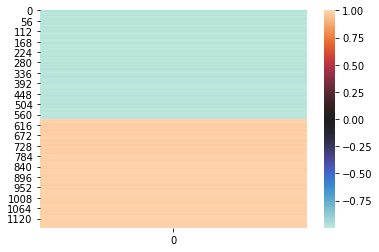

metacluster_0
activity pattern: [-1]
metacluster_0 pattern_0
total seqlets: 35
Task 1 hypothetical scores:


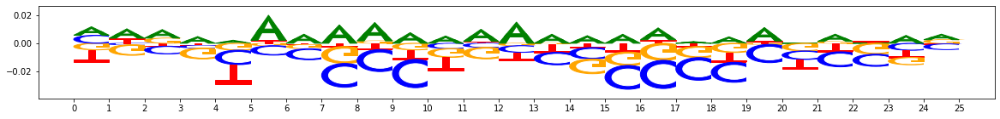

Task 1 actual importance scores:


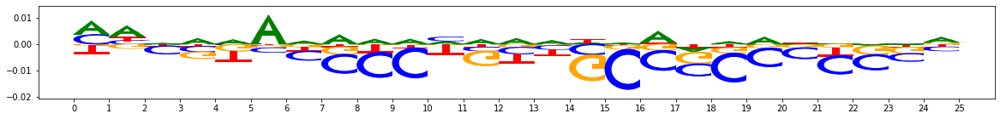

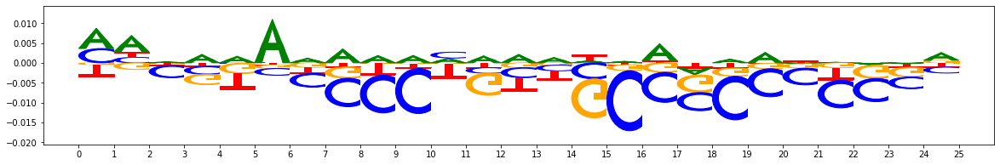

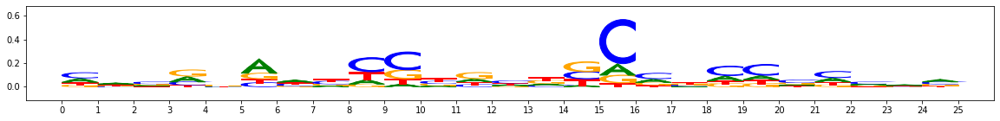

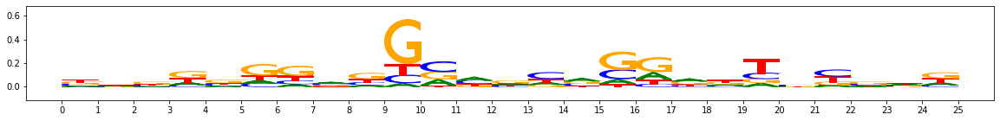

PLOTTING SUBCLUSTERS


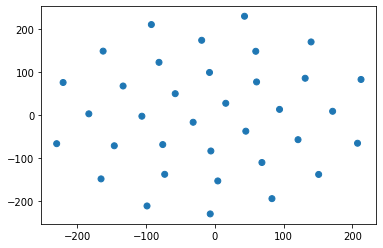

subcluster_0 size 35


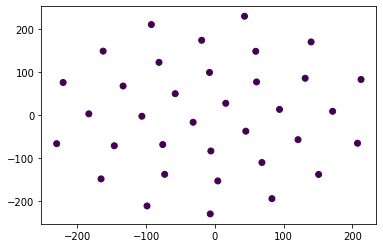

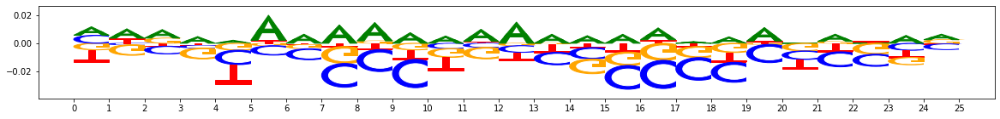

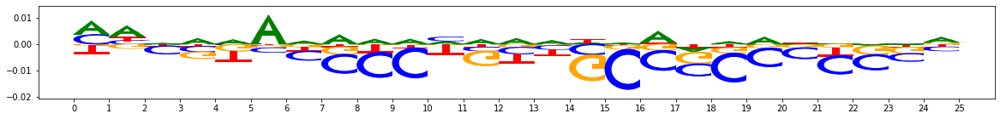

metacluster_0 pattern_1
total seqlets: 34
Task 1 hypothetical scores:


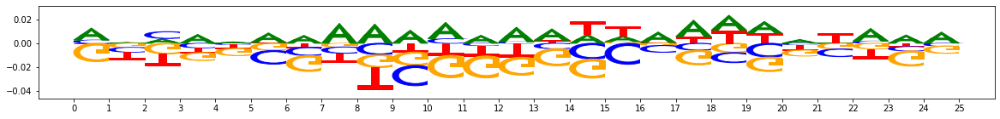

Task 1 actual importance scores:


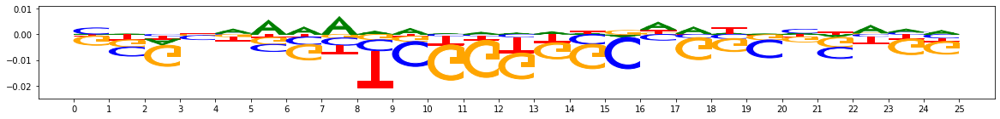

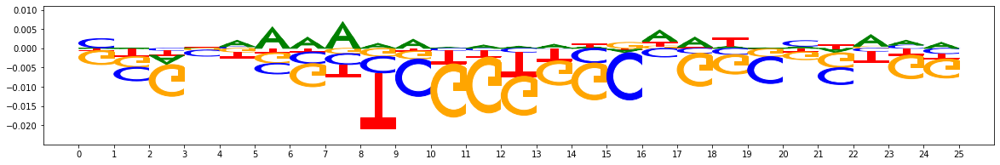

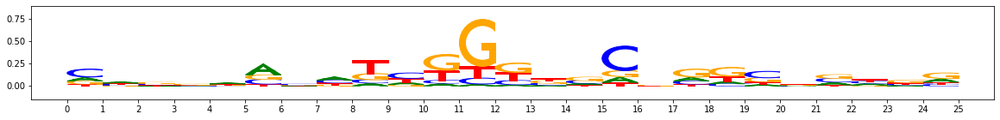

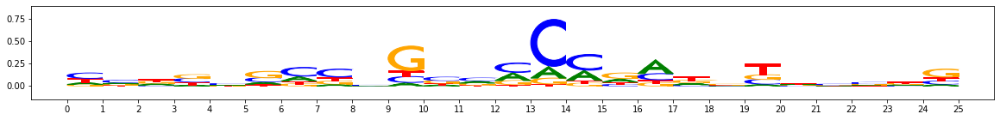

PLOTTING SUBCLUSTERS


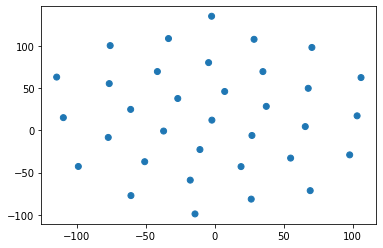

subcluster_0 size 34


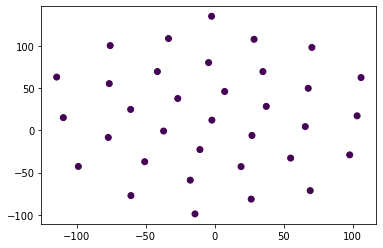

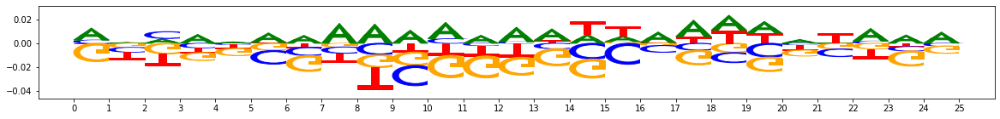

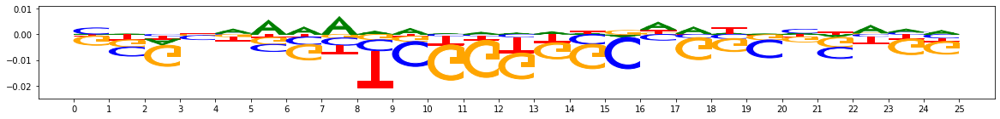

metacluster_0 pattern_2
total seqlets: 33
Task 1 hypothetical scores:


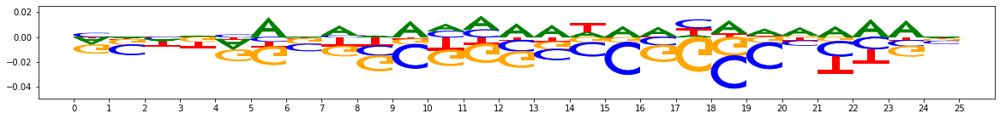

Task 1 actual importance scores:


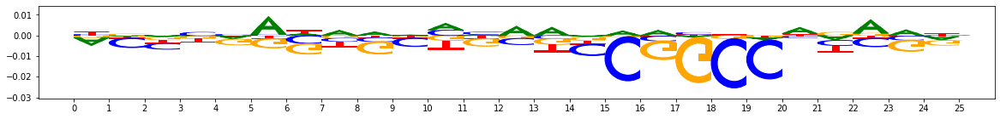

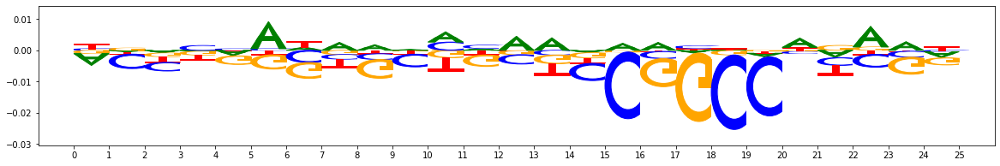

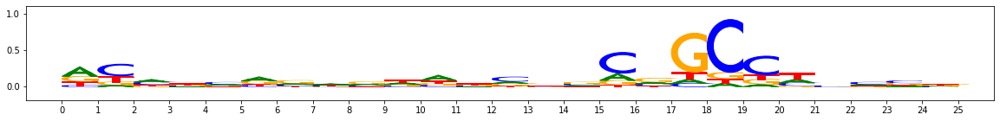

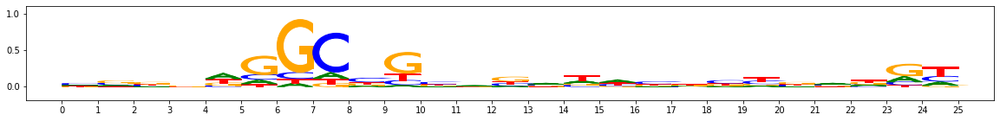

PLOTTING SUBCLUSTERS


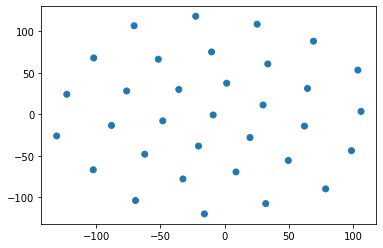

subcluster_0 size 33


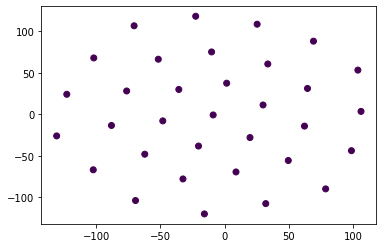

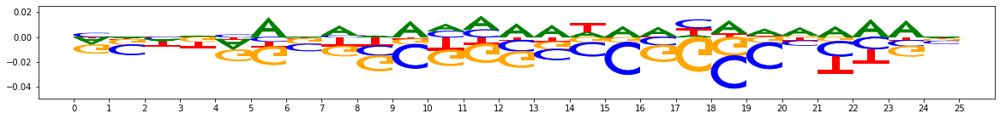

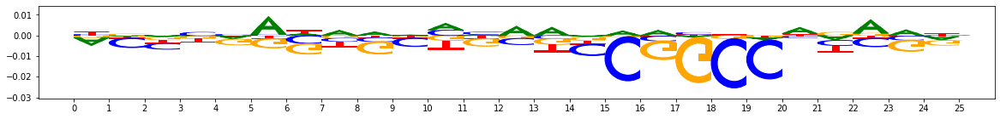

metacluster_0 pattern_3
total seqlets: 32
Task 1 hypothetical scores:


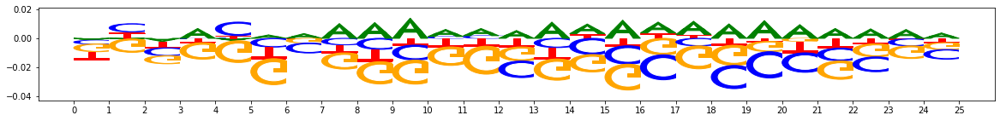

Task 1 actual importance scores:


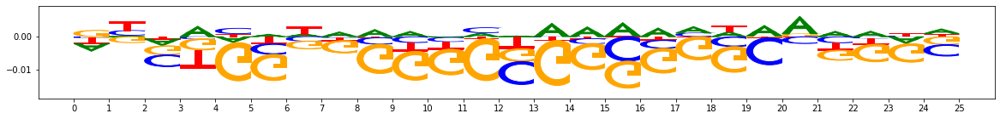

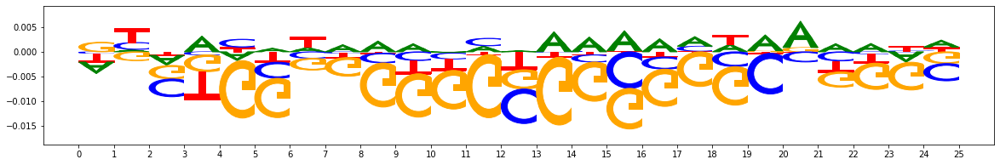

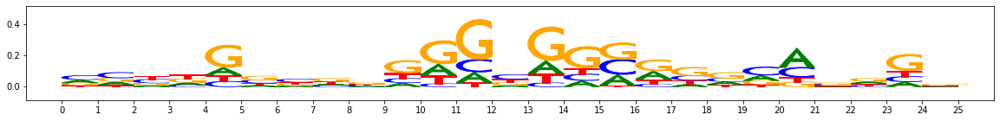

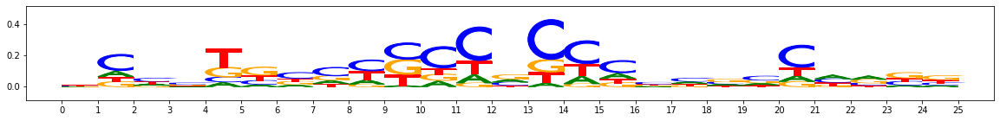

PLOTTING SUBCLUSTERS


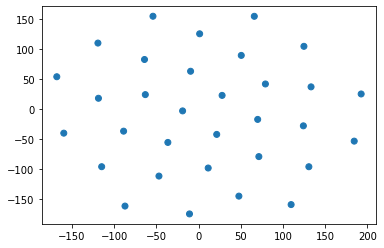

subcluster_0 size 32


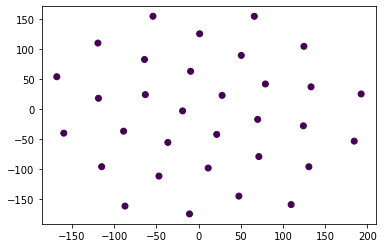

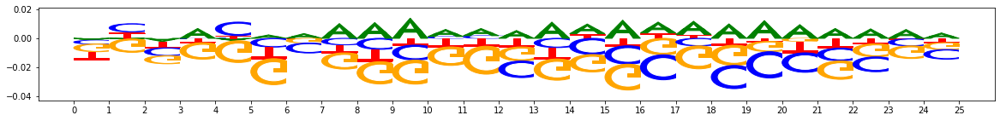

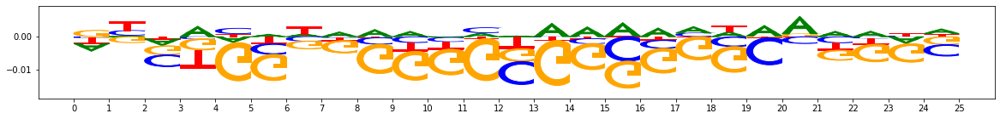

metacluster_0 pattern_4
total seqlets: 29
Task 1 hypothetical scores:


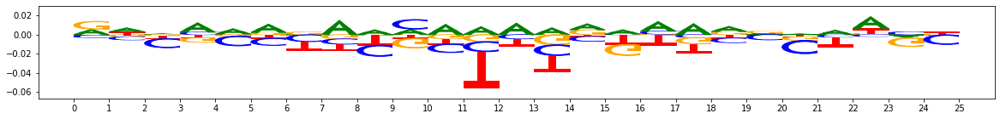

Task 1 actual importance scores:


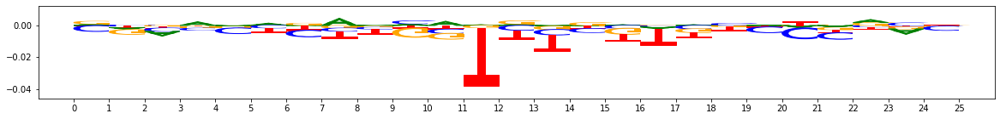

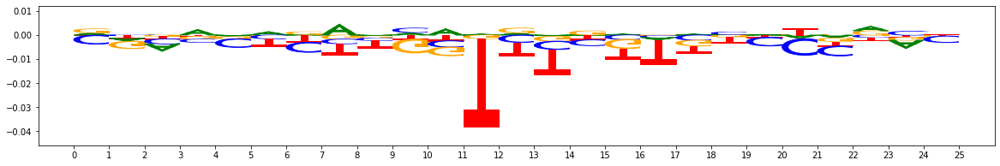

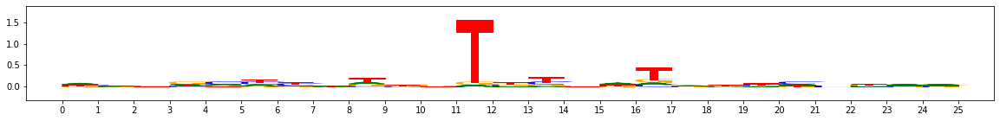

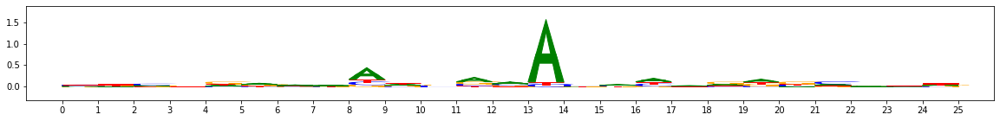

PLOTTING SUBCLUSTERS


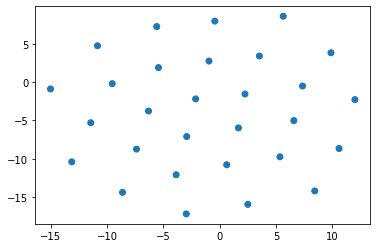

subcluster_0 size 29


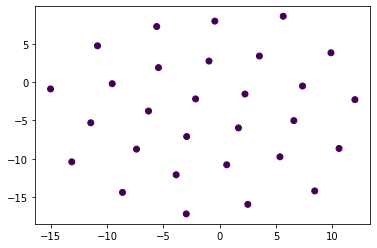

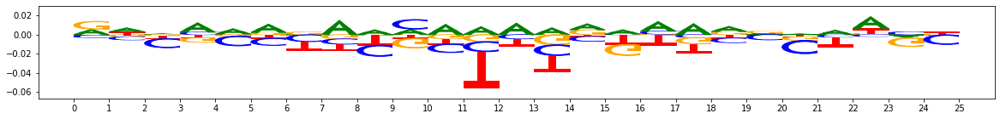

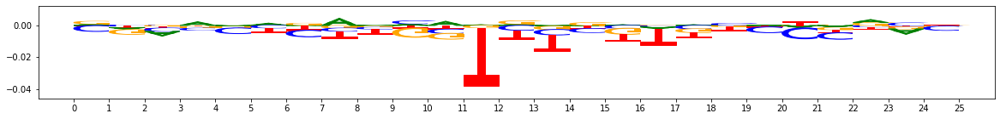

metacluster_0 pattern_5
total seqlets: 26
Task 1 hypothetical scores:


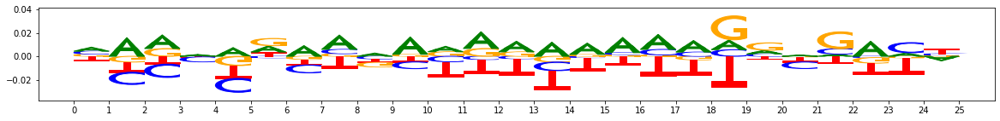

Task 1 actual importance scores:


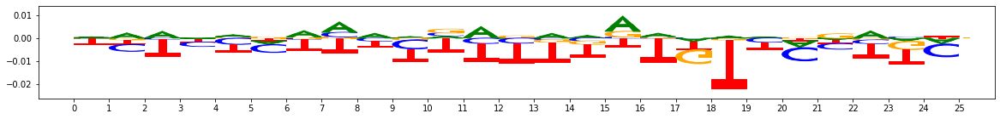

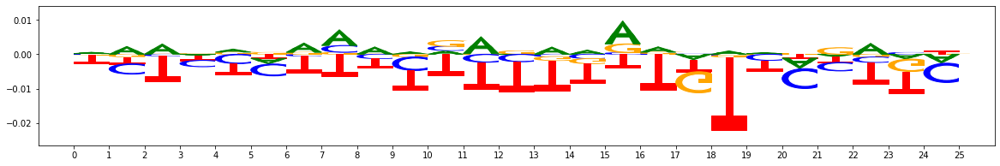

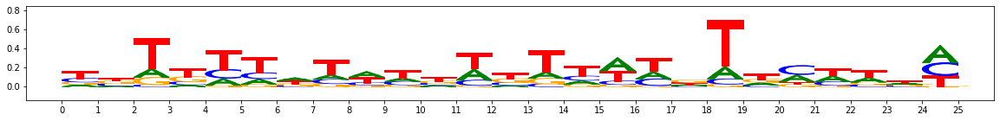

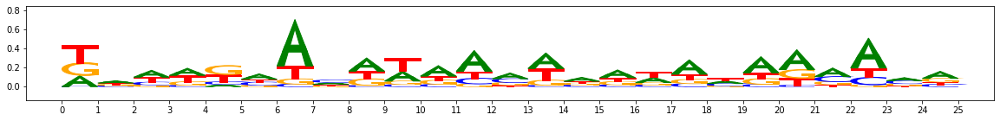

PLOTTING SUBCLUSTERS


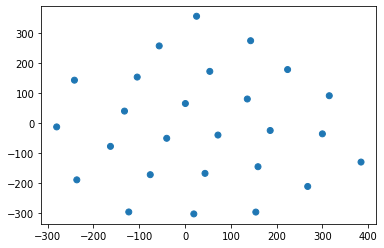

subcluster_0 size 26


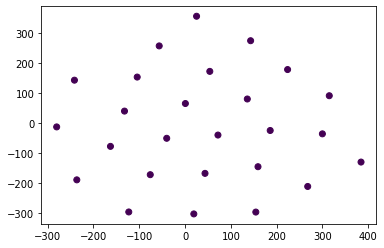

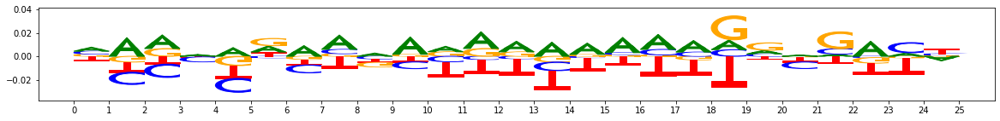

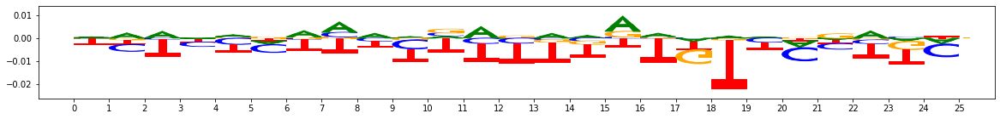

metacluster_0 pattern_6
total seqlets: 26
Task 1 hypothetical scores:


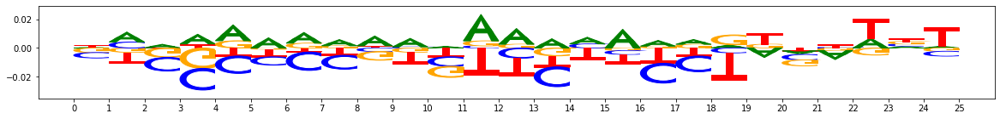

Task 1 actual importance scores:


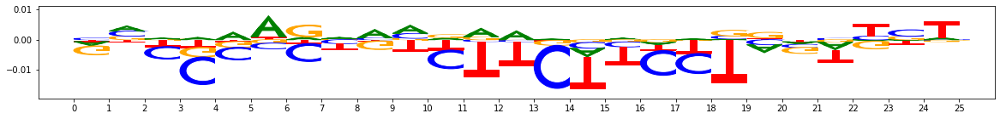

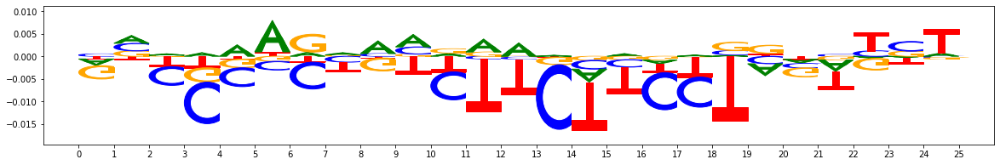

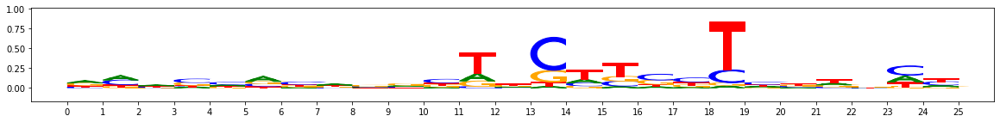

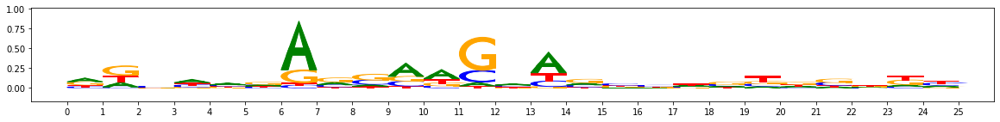

PLOTTING SUBCLUSTERS


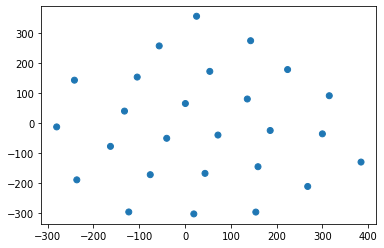

subcluster_0 size 26


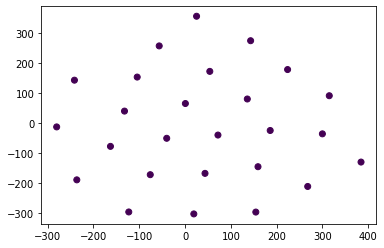

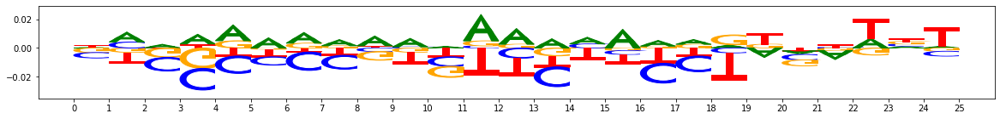

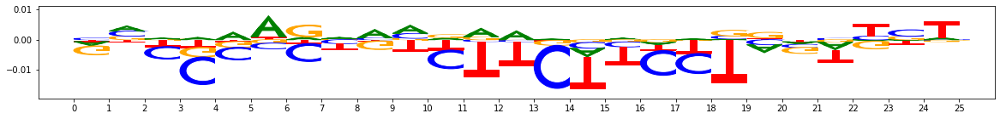

metacluster_0 pattern_7
total seqlets: 26
Task 1 hypothetical scores:


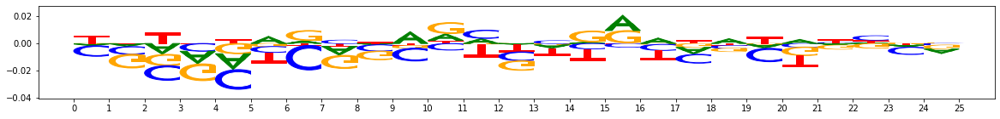

Task 1 actual importance scores:


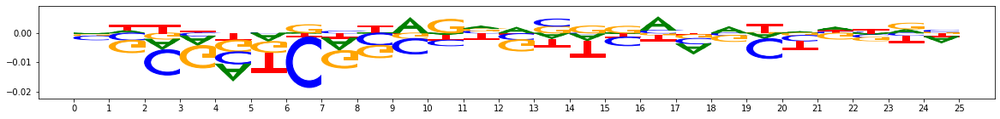

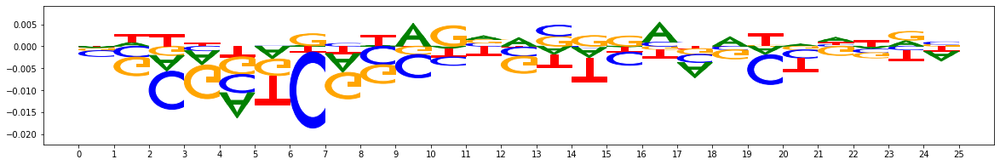

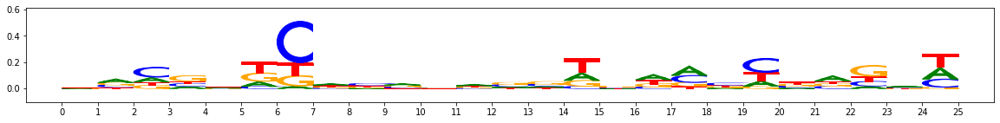

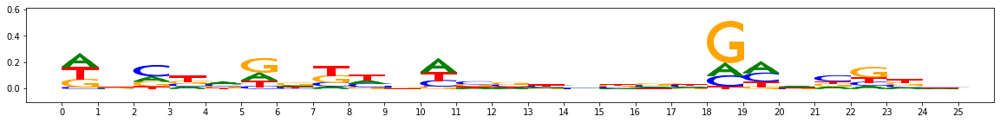

PLOTTING SUBCLUSTERS


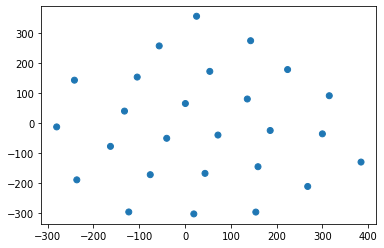

subcluster_0 size 26


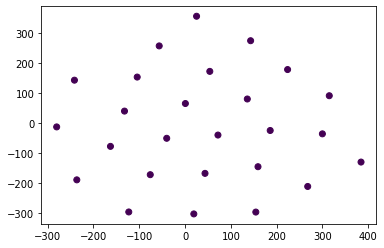

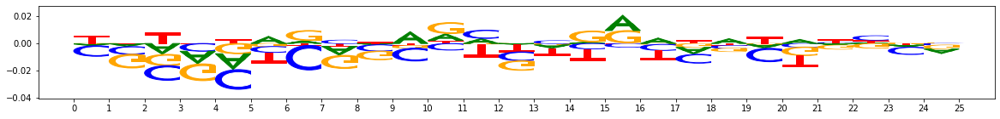

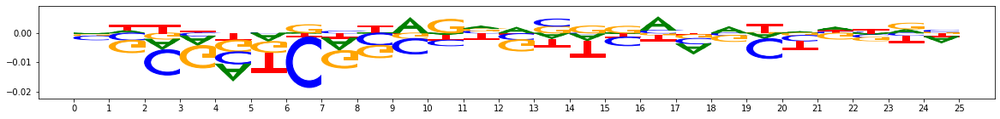

metacluster_0 pattern_8
total seqlets: 24
Task 1 hypothetical scores:


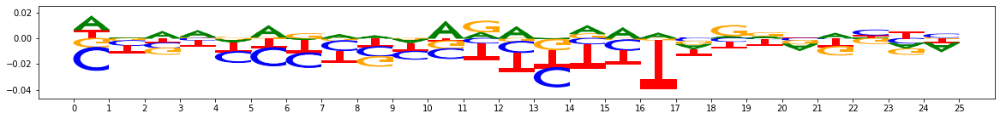

Task 1 actual importance scores:


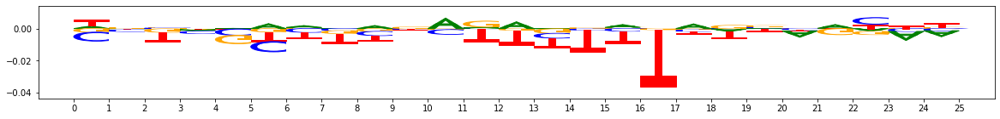

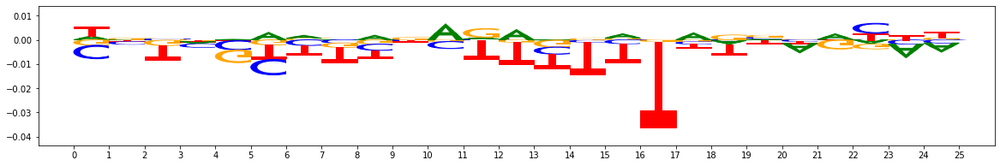

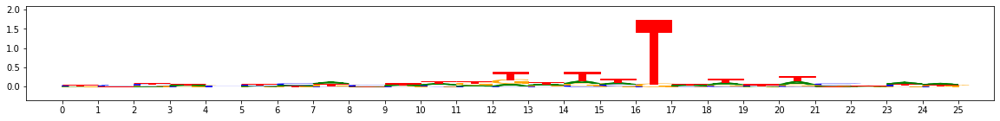

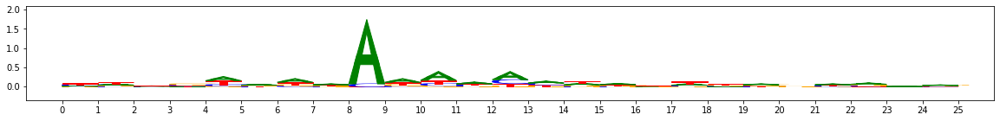

PLOTTING SUBCLUSTERS


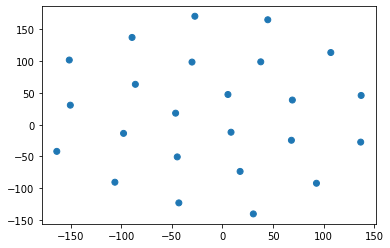

subcluster_0 size 24


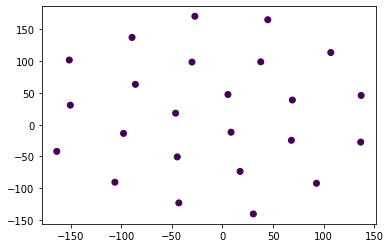

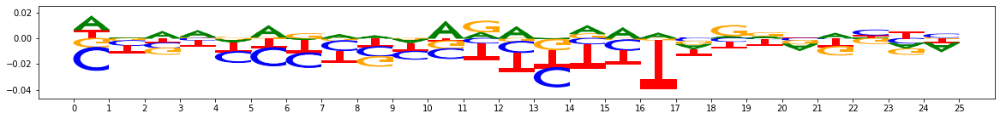

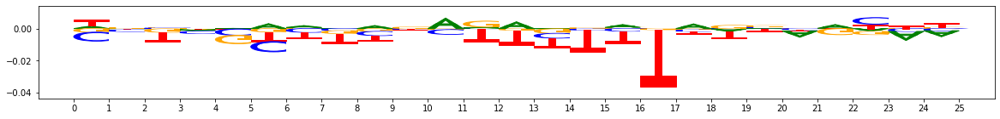

metacluster_0 pattern_9
total seqlets: 23
Task 1 hypothetical scores:


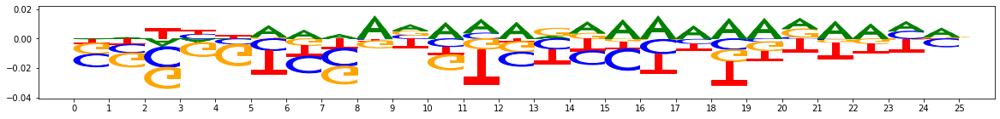

Task 1 actual importance scores:


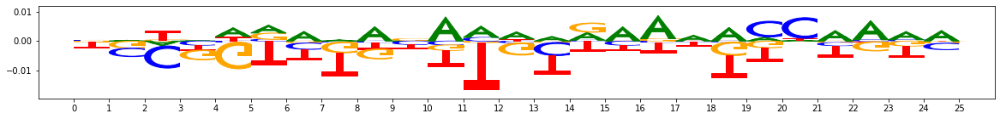

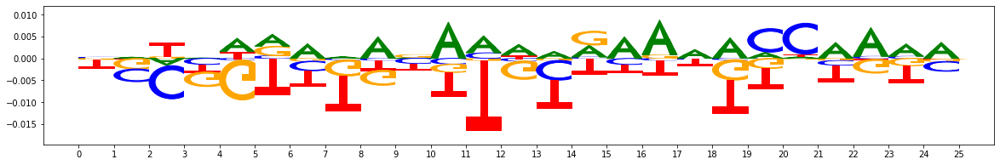

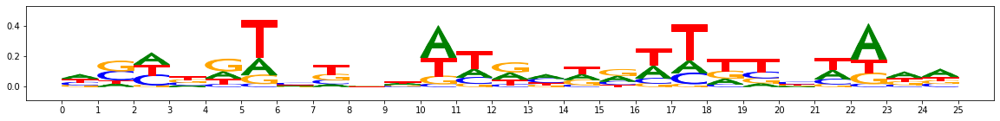

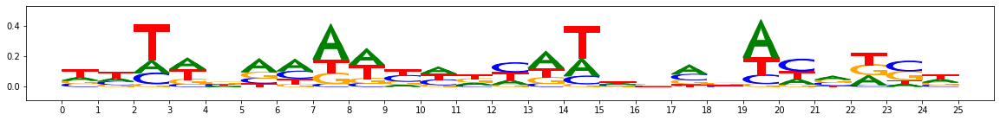

PLOTTING SUBCLUSTERS


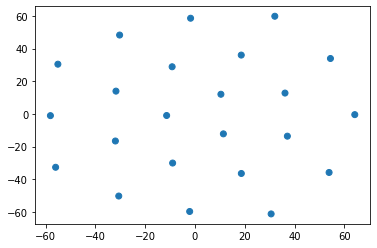

subcluster_0 size 23


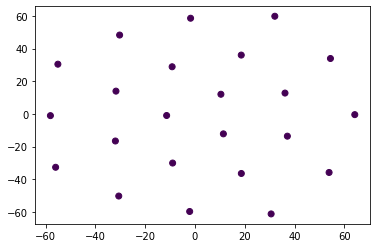

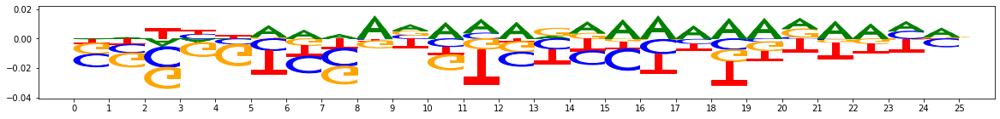

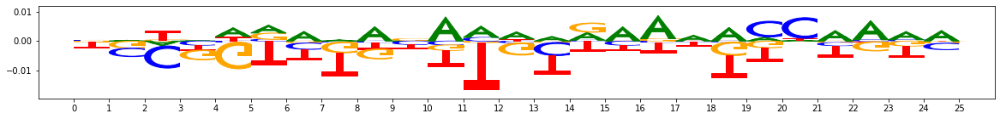

metacluster_0 pattern_10
total seqlets: 20
Task 1 hypothetical scores:


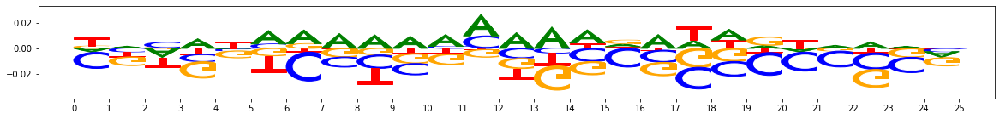

Task 1 actual importance scores:


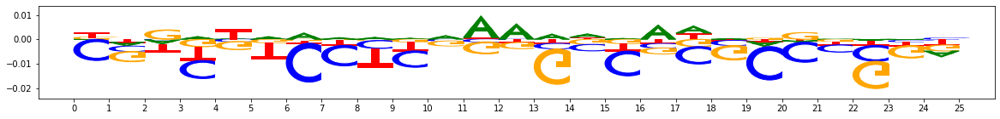

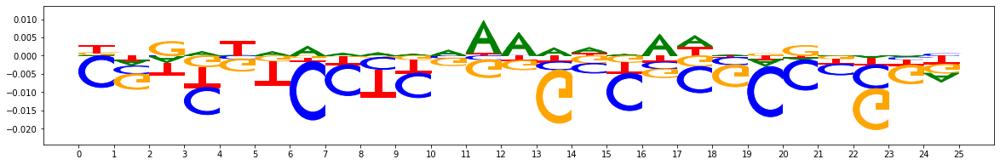

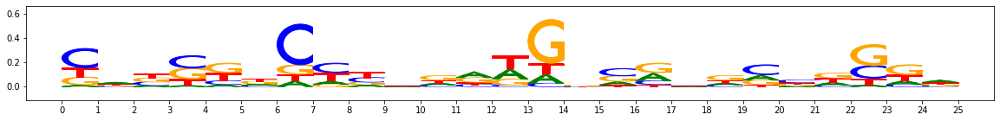

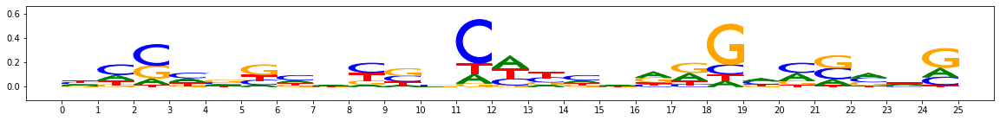

PLOTTING SUBCLUSTERS


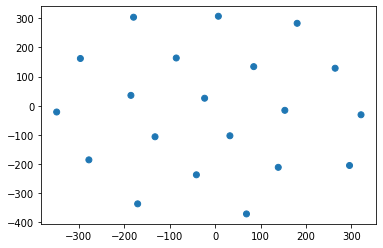

subcluster_0 size 20


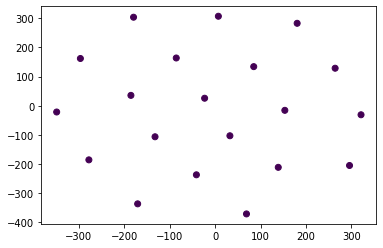

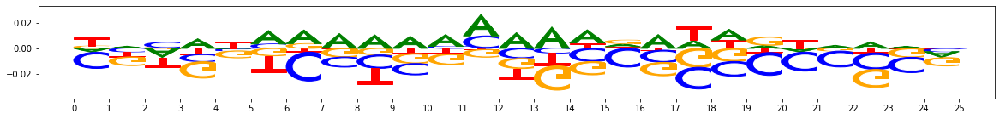

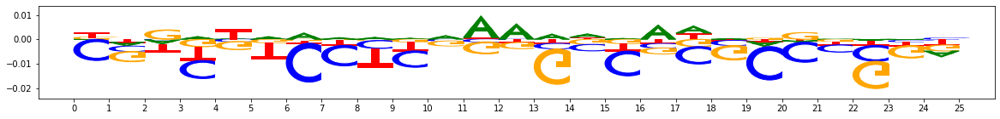

metacluster_0 pattern_11
total seqlets: 20
Task 1 hypothetical scores:


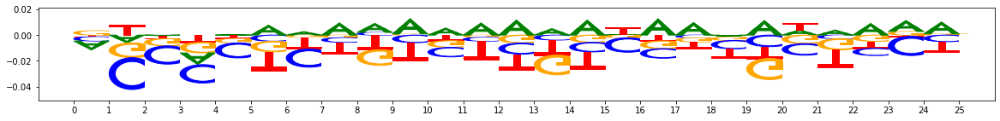

Task 1 actual importance scores:


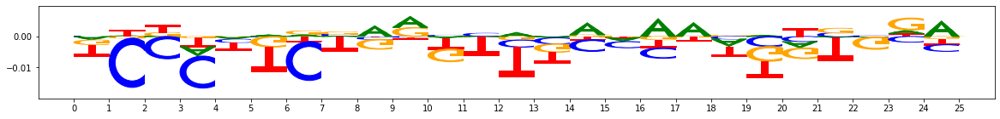

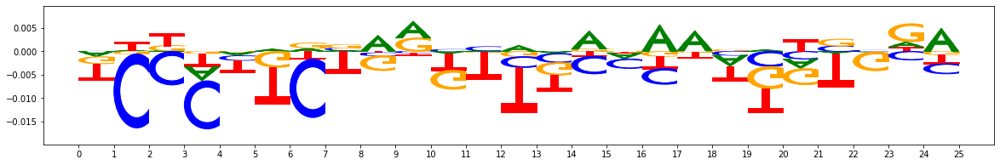

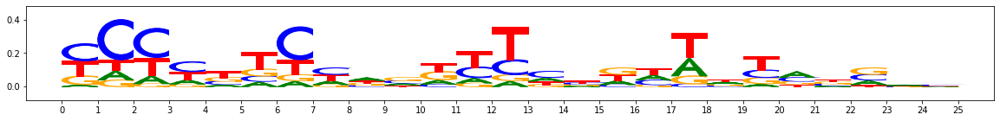

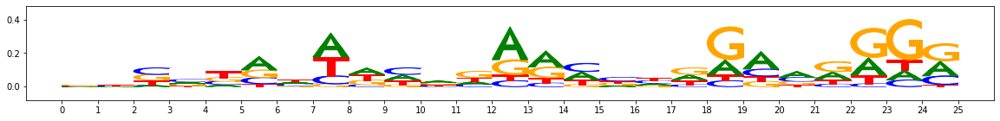

PLOTTING SUBCLUSTERS


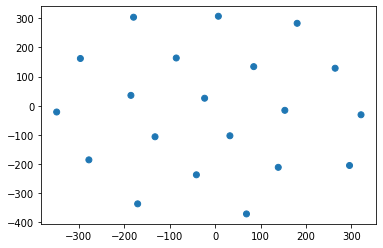

subcluster_0 size 20


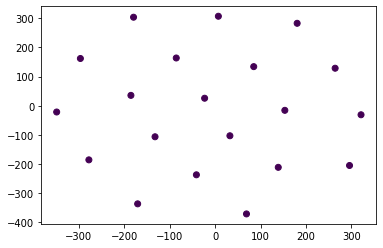

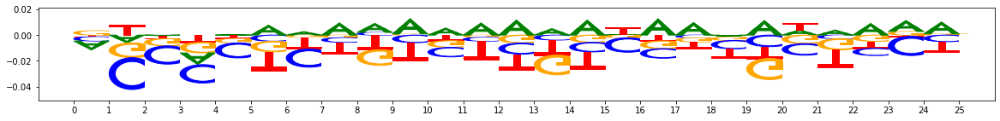

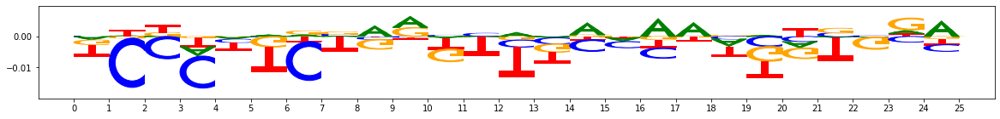

metacluster_1
activity pattern: [1]
metacluster_1 pattern_0
total seqlets: 36
Task 1 hypothetical scores:


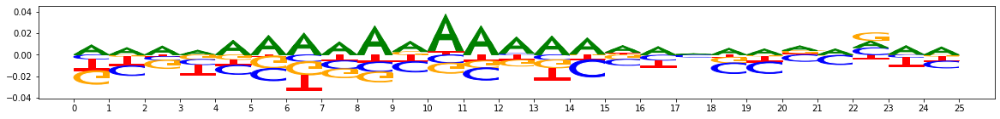

Task 1 actual importance scores:


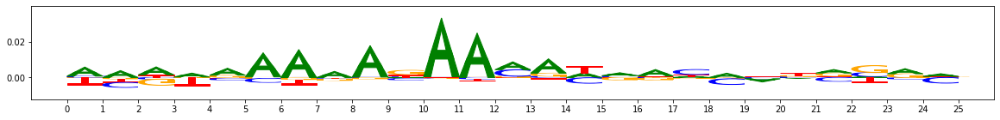

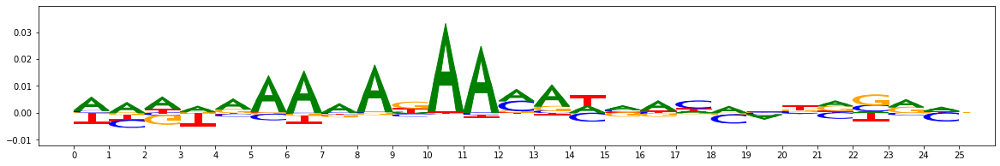

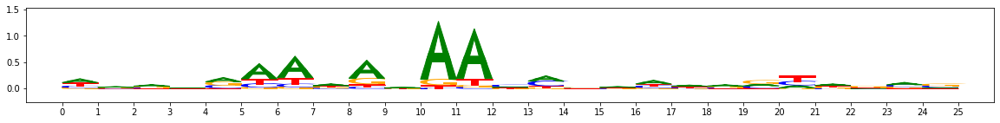

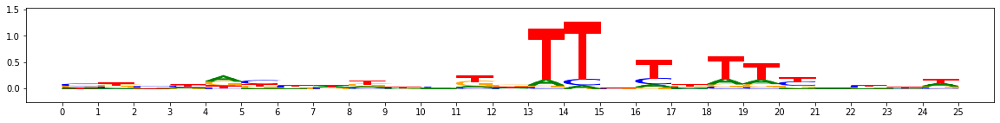

PLOTTING SUBCLUSTERS


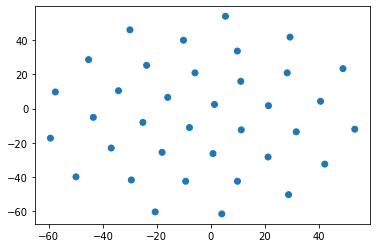

subcluster_0 size 36


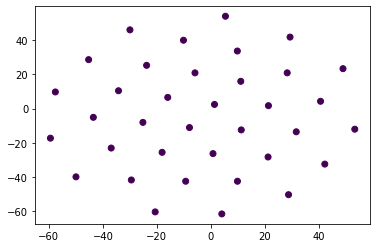

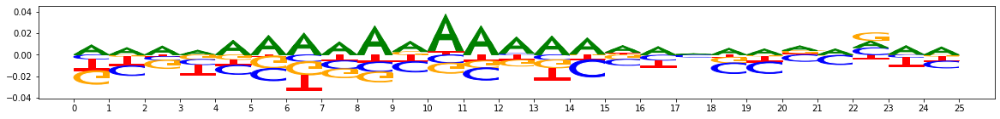

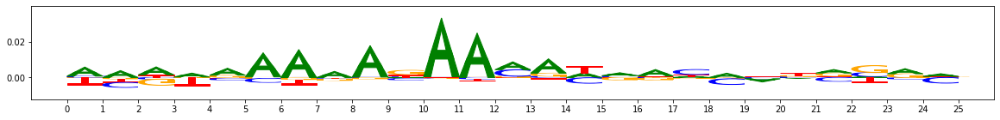

metacluster_1 pattern_1
total seqlets: 33
Task 1 hypothetical scores:


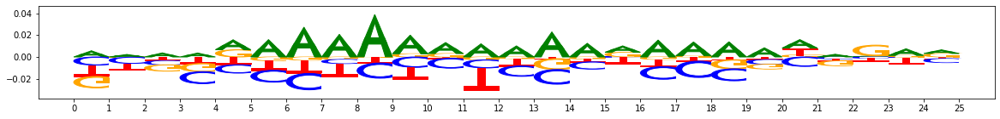

Task 1 actual importance scores:


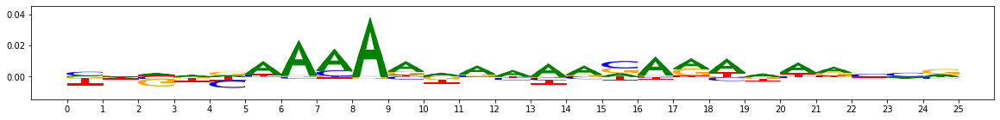

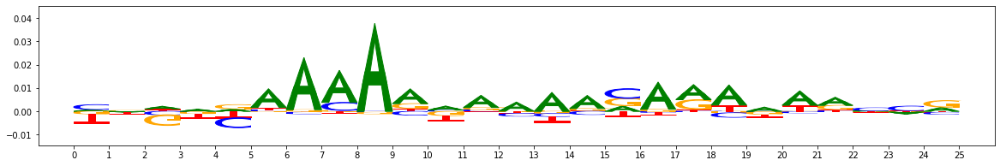

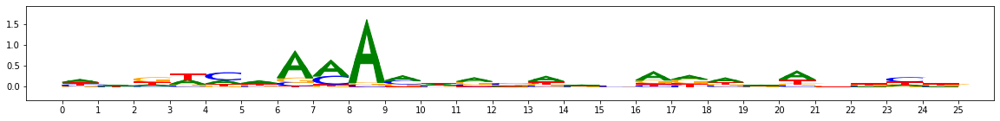

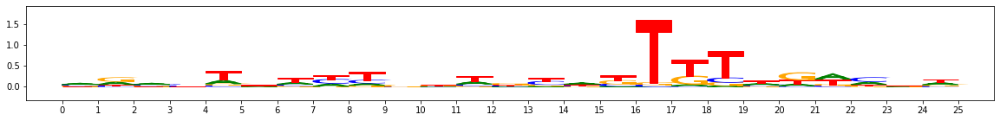

PLOTTING SUBCLUSTERS


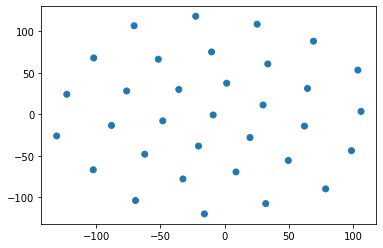

subcluster_0 size 33


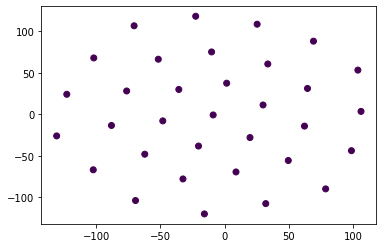

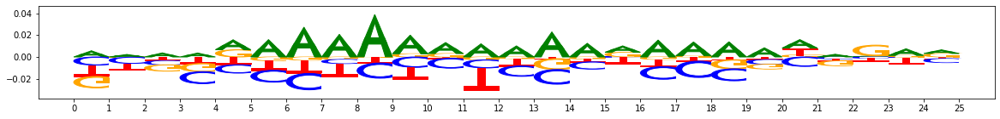

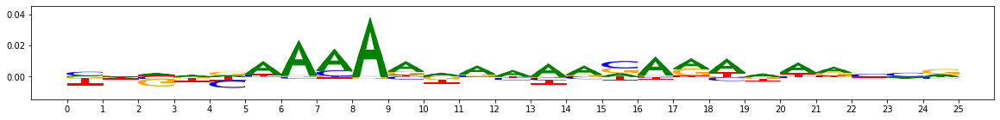

metacluster_1 pattern_2
total seqlets: 32
Task 1 hypothetical scores:


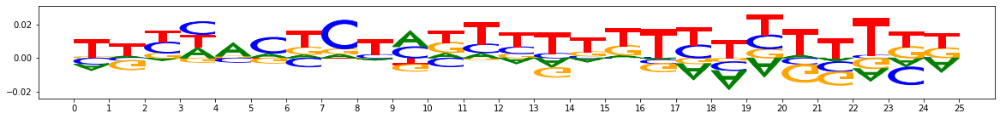

Task 1 actual importance scores:


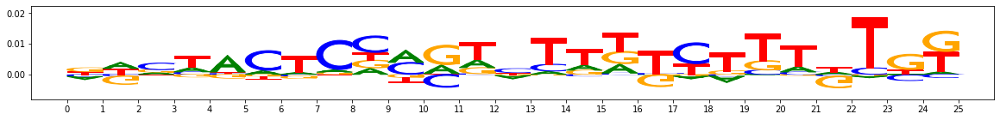

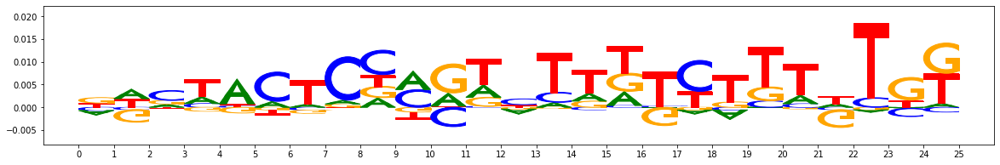

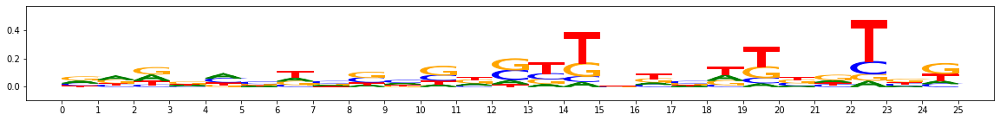

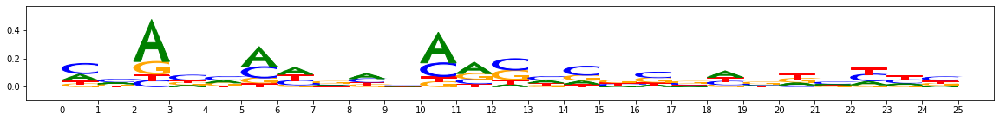

PLOTTING SUBCLUSTERS


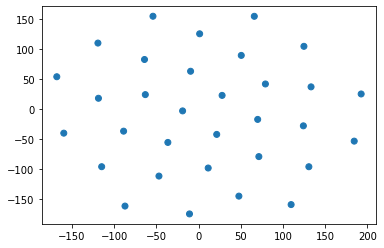

subcluster_0 size 32


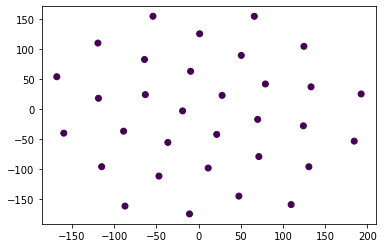

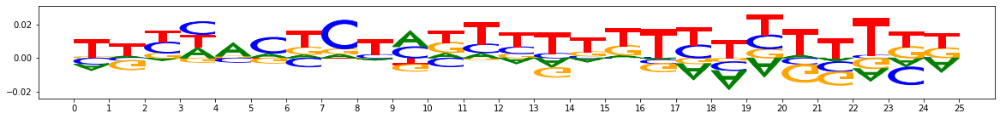

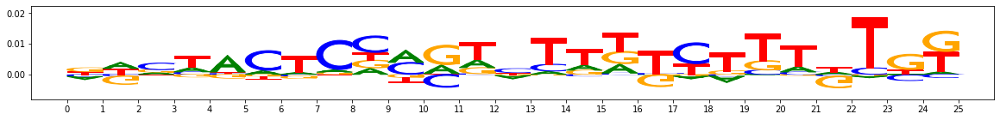

metacluster_1 pattern_3
total seqlets: 32
Task 1 hypothetical scores:


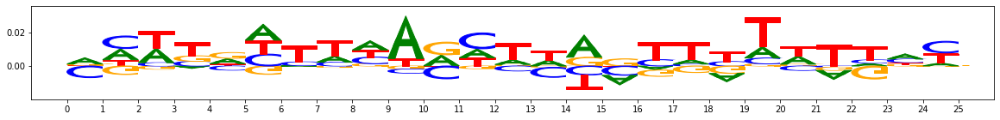

Task 1 actual importance scores:


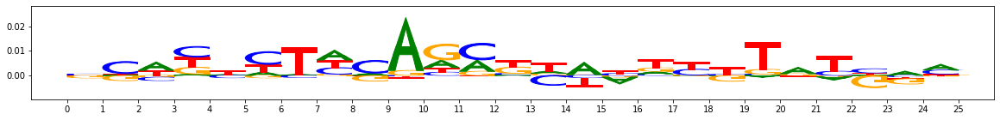

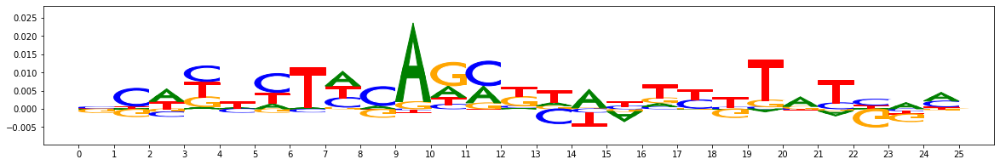

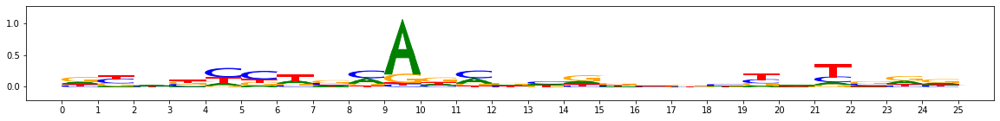

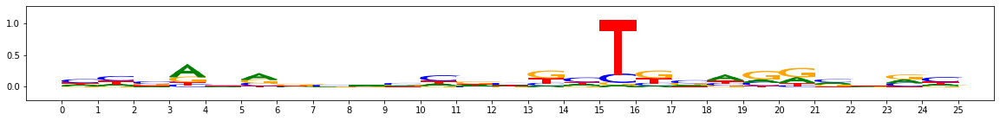

PLOTTING SUBCLUSTERS


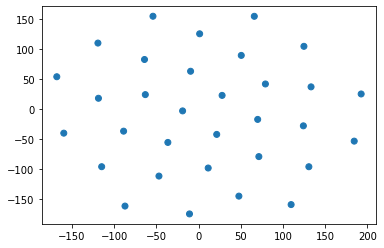

subcluster_0 size 32


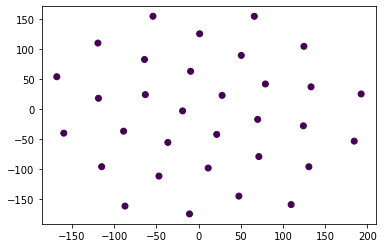

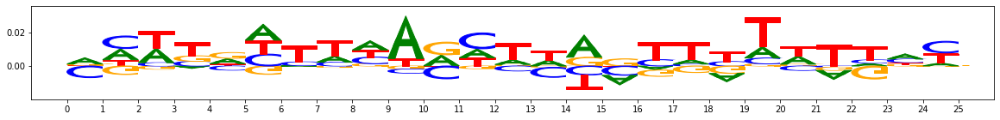

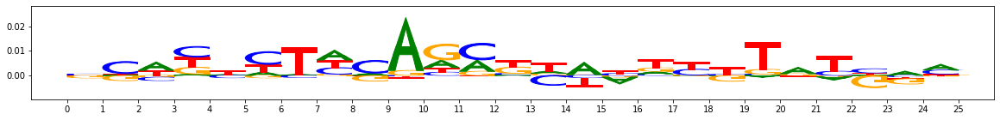

metacluster_1 pattern_4
total seqlets: 30
Task 1 hypothetical scores:


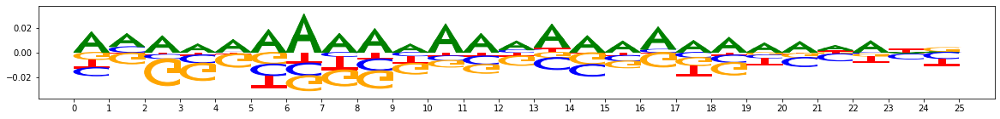

Task 1 actual importance scores:


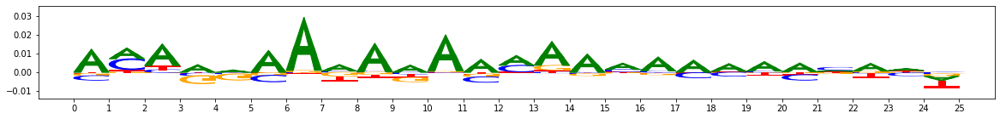

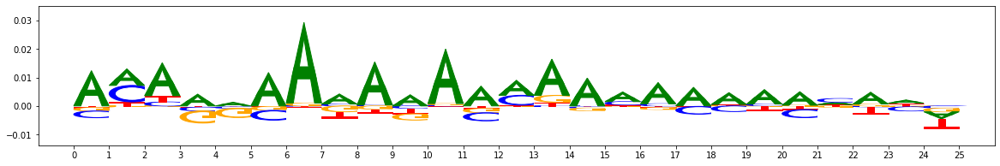

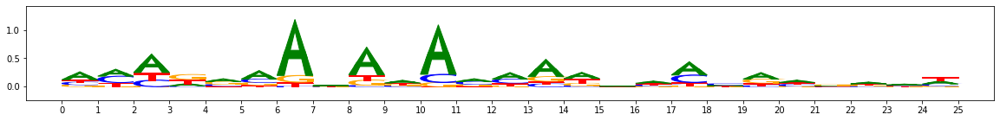

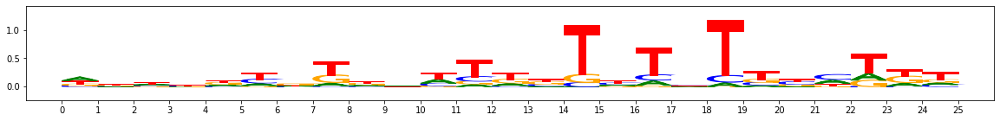

PLOTTING SUBCLUSTERS


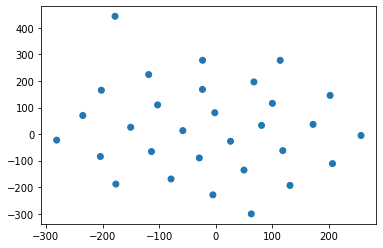

subcluster_0 size 30


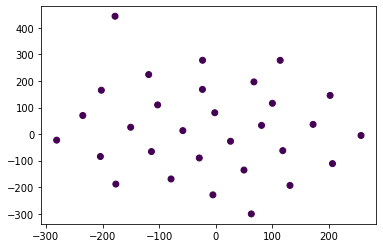

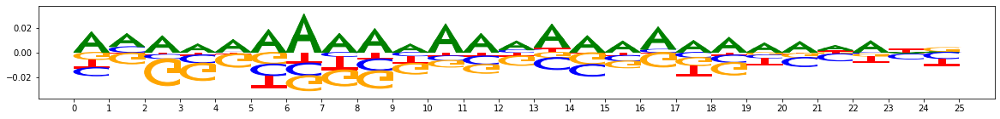

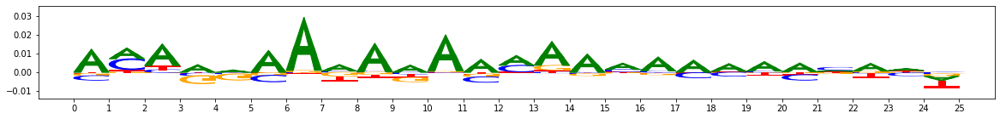

metacluster_1 pattern_5
total seqlets: 26
Task 1 hypothetical scores:


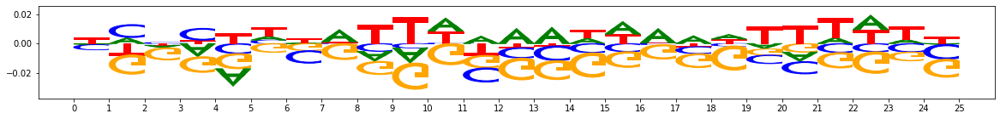

Task 1 actual importance scores:


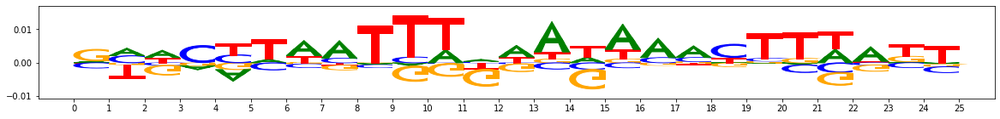

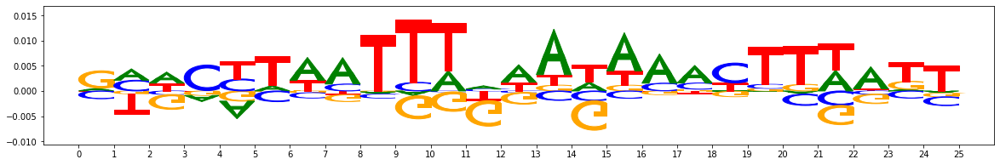

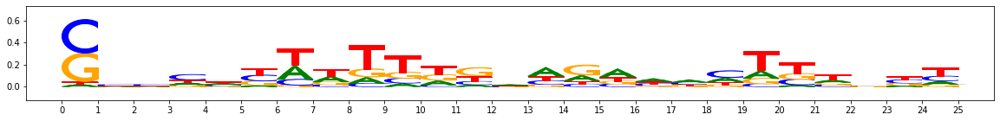

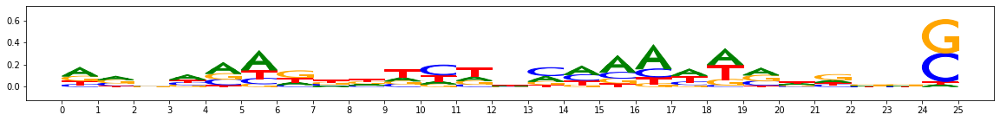

PLOTTING SUBCLUSTERS


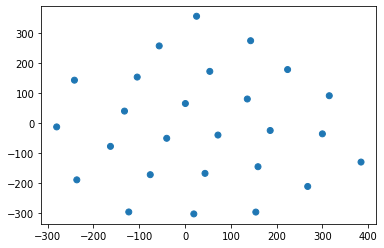

subcluster_0 size 26


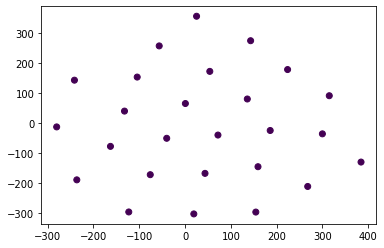

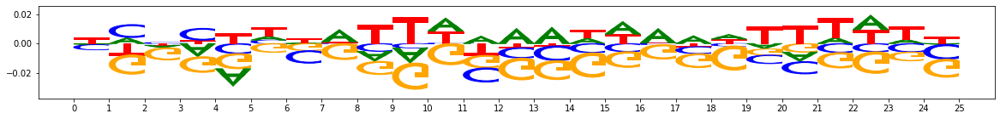

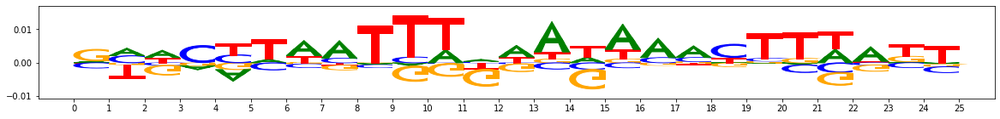

metacluster_1 pattern_6
total seqlets: 25
Task 1 hypothetical scores:


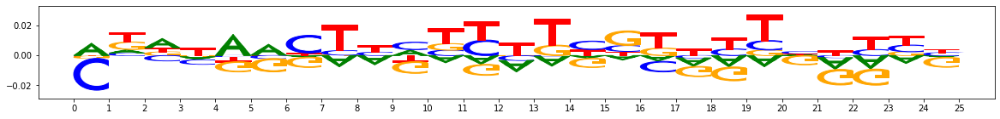

Task 1 actual importance scores:


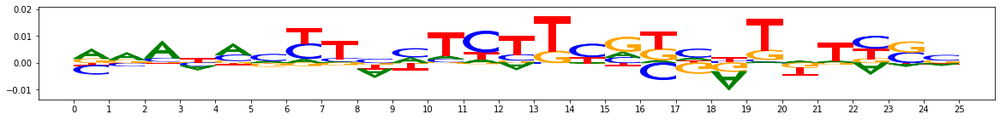

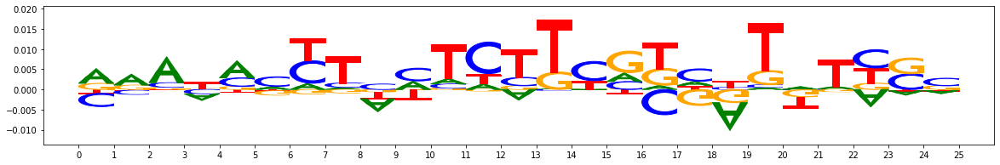

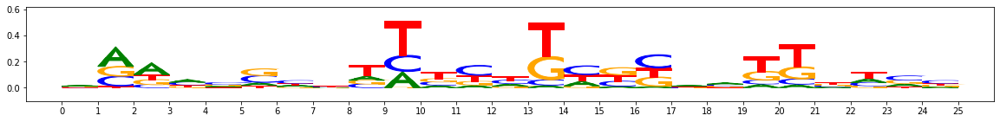

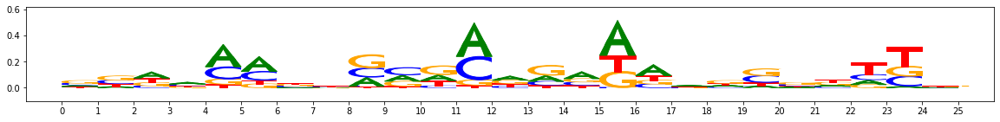

PLOTTING SUBCLUSTERS


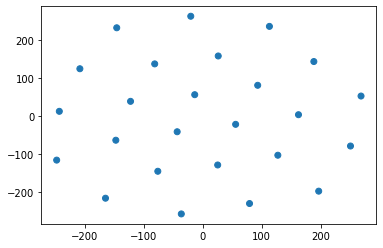

subcluster_0 size 25


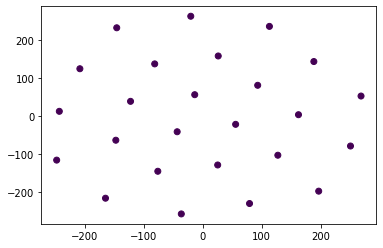

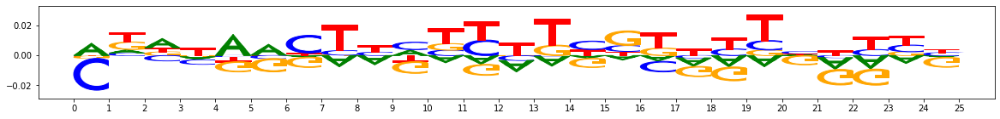

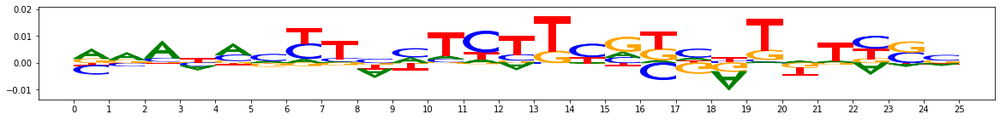

metacluster_1 pattern_7
total seqlets: 25
Task 1 hypothetical scores:


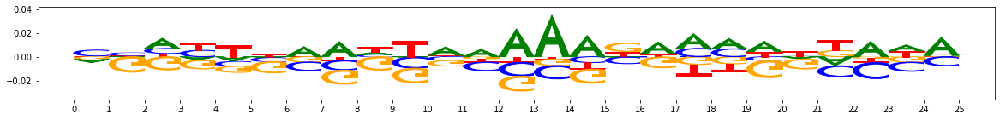

Task 1 actual importance scores:


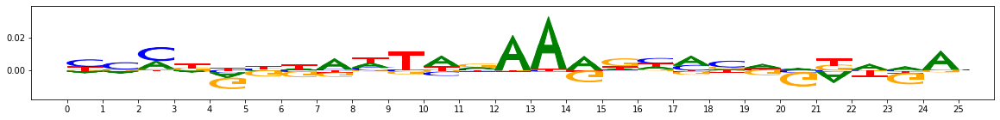

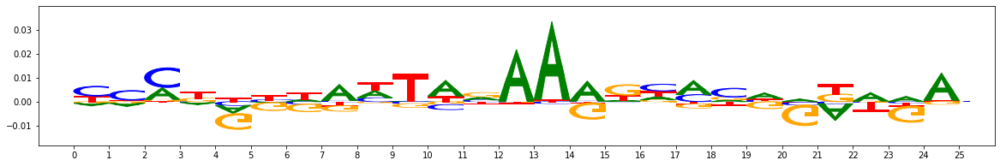

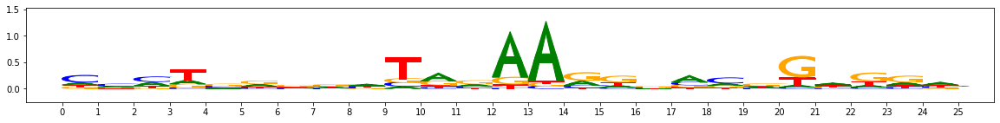

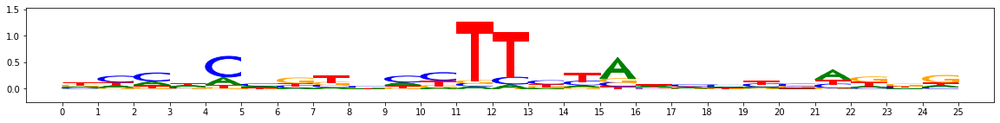

PLOTTING SUBCLUSTERS


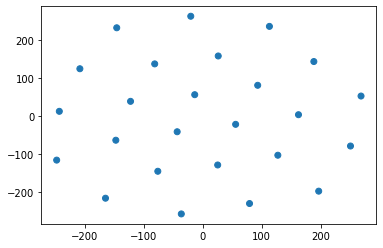

subcluster_0 size 25


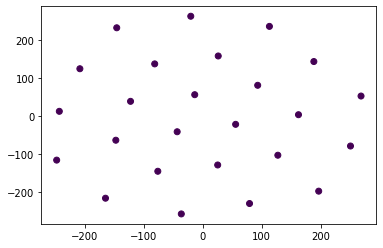

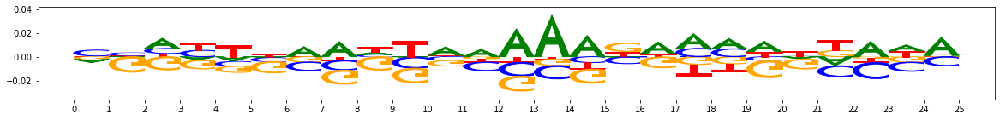

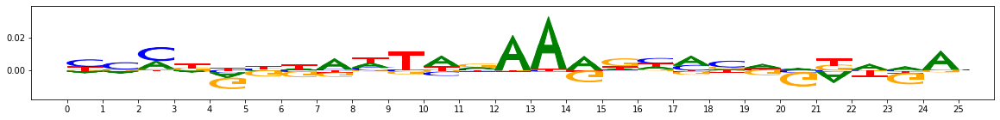

metacluster_1 pattern_8
total seqlets: 24
Task 1 hypothetical scores:


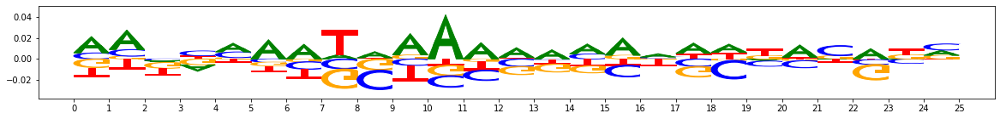

Task 1 actual importance scores:


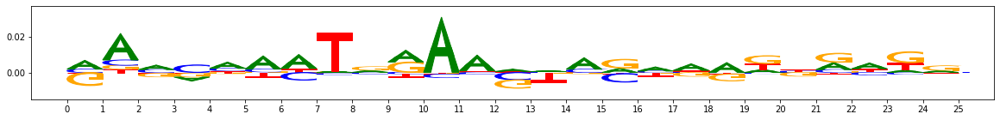

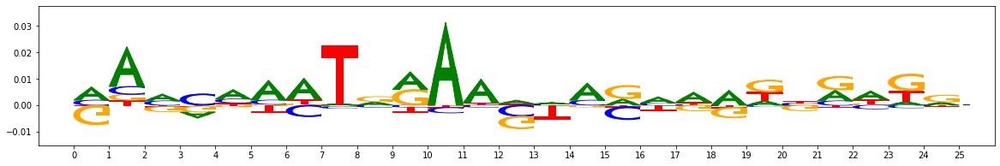

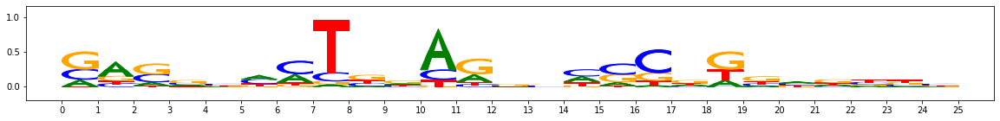

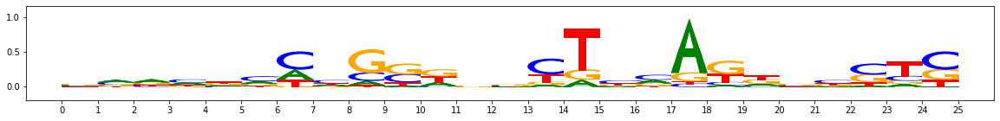

PLOTTING SUBCLUSTERS


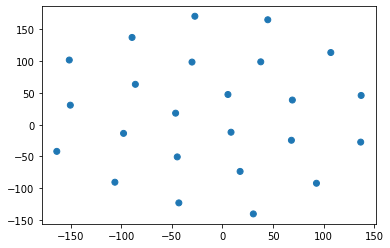

subcluster_0 size 24


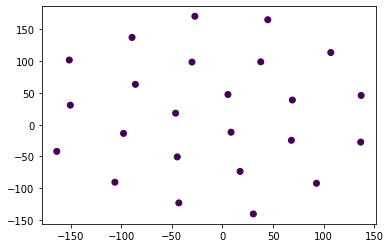

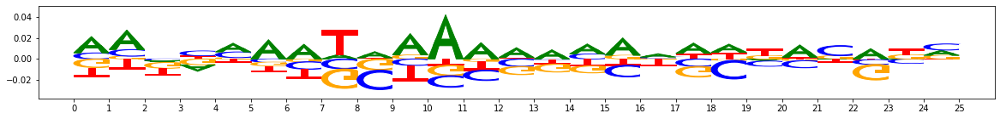

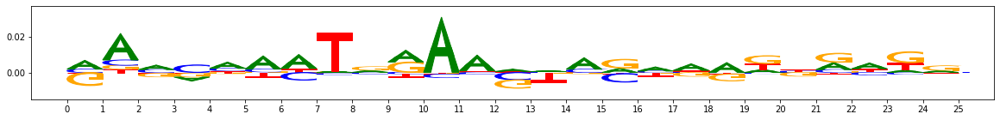

metacluster_1 pattern_9
total seqlets: 23
Task 1 hypothetical scores:


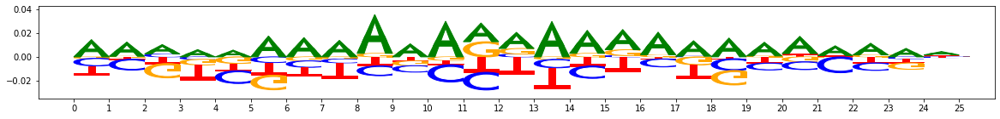

Task 1 actual importance scores:


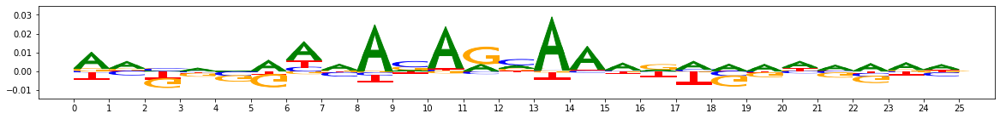

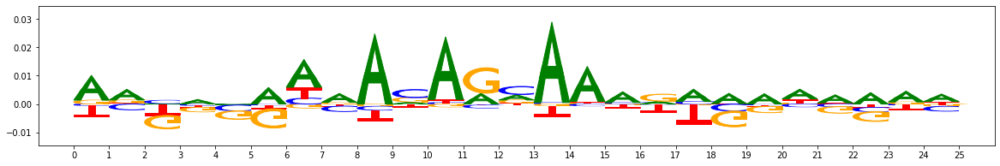

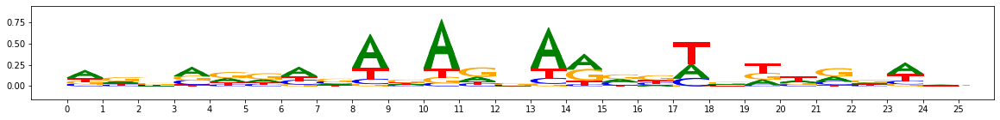

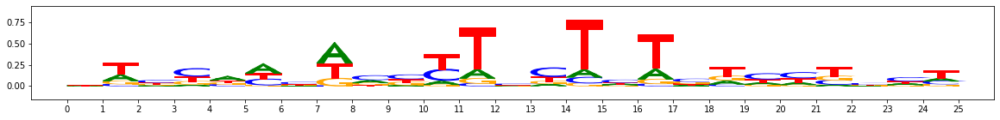

PLOTTING SUBCLUSTERS


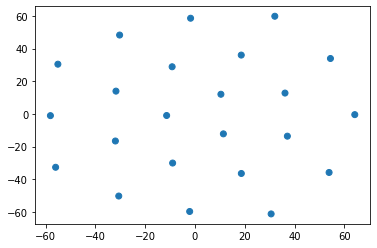

subcluster_0 size 23


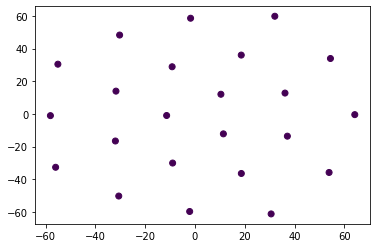

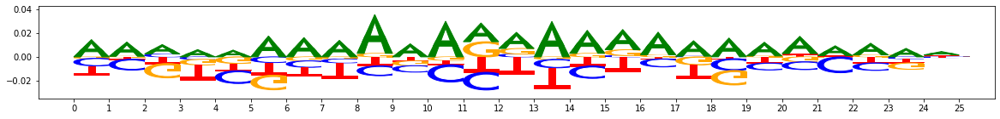

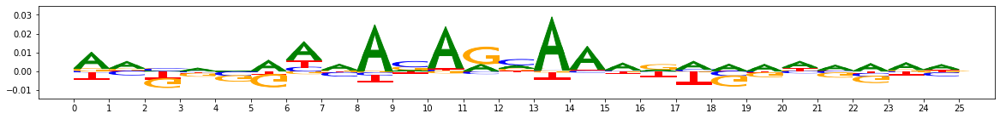

metacluster_1 pattern_10
total seqlets: 21
Task 1 hypothetical scores:


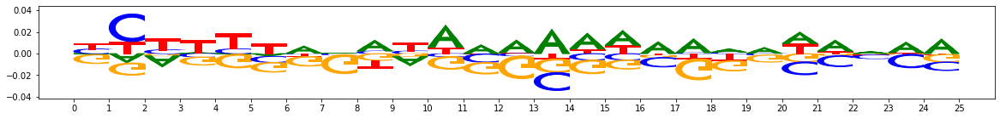

Task 1 actual importance scores:


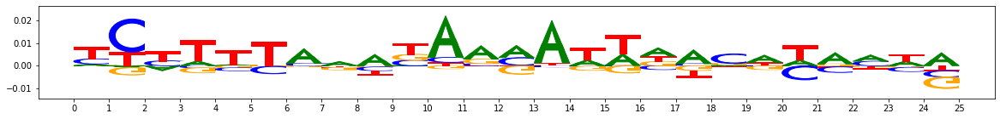

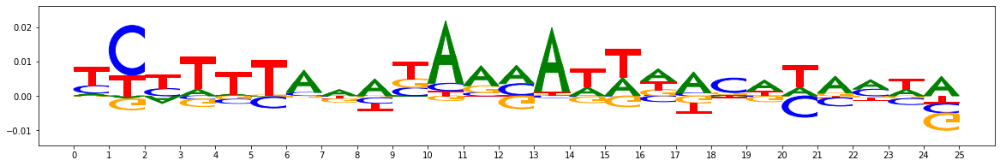

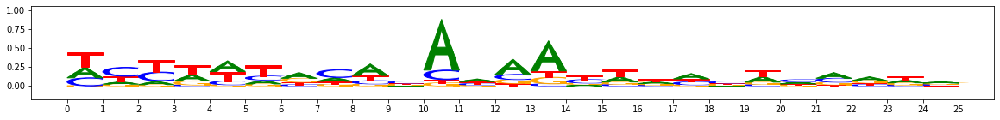

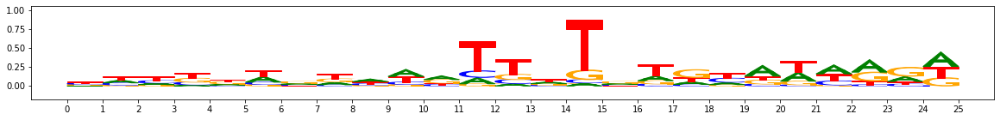

PLOTTING SUBCLUSTERS


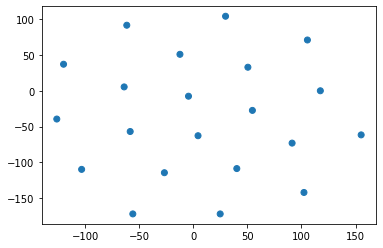

subcluster_0 size 21


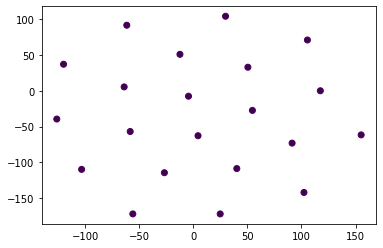

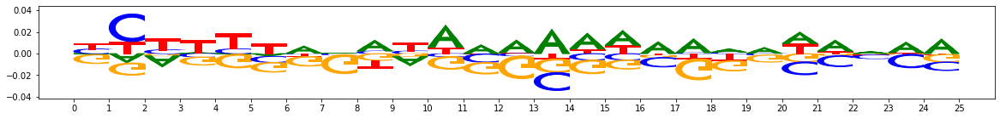

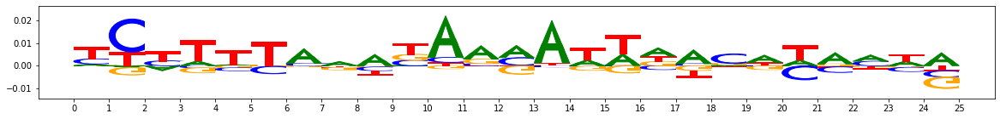

In [35]:
from collections import Counter
import numpy as np

from modisco.visualization import viz_sequence
reload(viz_sequence)
from matplotlib import pyplot as plt

import modisco.affinitymat.core
reload(modisco.affinitymat.core)
import modisco.cluster.phenograph.core
reload(modisco.cluster.phenograph.core)
import modisco.cluster.phenograph.cluster
reload(modisco.cluster.phenograph.cluster)
import modisco.cluster.core
reload(modisco.cluster.core)
import modisco.aggregator
reload(modisco.aggregator)

hdf5_results = h5py.File("tf_modisco/tRNet_modisco_results_repressed.hdf5","r")

print("Metaclusters heatmap")
import seaborn as sns
activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                    np.array(
        [x[0] for x in sorted(
                enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
               key=lambda x: x[1])])]
sns.heatmap(activity_patterns, center=0)
plt.show()

metacluster_names = [
    x.decode("utf-8") for x in 
    list(hdf5_results["metaclustering_results"]
         ["all_metacluster_names"][:])]

all_patterns = []
background = np.array([0.27, 0.23, 0.23, 0.27])

for metacluster_name in metacluster_names:
    print(metacluster_name)
    metacluster_grp = (hdf5_results["metacluster_idx_to_submetacluster_results"]
                                   [metacluster_name])
    print("activity pattern:",metacluster_grp["activity_pattern"][:])
    all_pattern_names = [x.decode("utf-8") for x in 
                         list(metacluster_grp["seqlets_to_patterns_result"]
                                             ["patterns"]["all_pattern_names"][:])]
    if (len(all_pattern_names)==0):
        print("No motifs found for this activity pattern")
    for pattern_name in all_pattern_names:
        print(metacluster_name, pattern_name)
        all_patterns.append((metacluster_name, pattern_name))
        pattern = metacluster_grp["seqlets_to_patterns_result"]["patterns"][pattern_name]
        print("total seqlets:",len(pattern["seqlets_and_alnmts"]["seqlets"]))
        print("Task 1 hypothetical scores:")
        viz_sequence.plot_weights(pattern["task1_hypothetical_contribs"]["fwd"])
        print("Task 1 actual importance scores:")
        viz_sequence.plot_weights(pattern["task1_contrib_scores"]["fwd"])
        #For plotting figures to a png, this code can be used...
        fig = plt.figure(figsize=(20,3))                                           
        ax = fig.add_subplot(111)
        viz_sequence.plot_weights_given_ax(ax, pattern["task1_contrib_scores"]["fwd"])
        plt.savefig("tf_modisco/" + "repressed_" + metacluster_name + "_activity" + str(metacluster_grp["activity_pattern"][0]) + "_" + pattern_name + "_contrib_scores.pdf")
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["fwd"]),
                                                        background=background)) 
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["rev"]),
                                                        background=background)) 
        #Plot the subclustering too, if available
        if ("subclusters" in pattern):
            print("PLOTTING SUBCLUSTERS")
            subclusters = np.array(pattern["subclusters"])
            twod_embedding = np.array(pattern["twod_embedding"])
            plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=subclusters, cmap="tab20")
            plt.show()
            for subcluster_name in list(pattern["subcluster_to_subpattern"]["subcluster_names"]):
                subpattern = pattern["subcluster_to_subpattern"][subcluster_name]
                print(subcluster_name.decode("utf-8"), "size", len(subpattern["seqlets_and_alnmts"]["seqlets"]))
                subcluster = int(subcluster_name.decode("utf-8").split("_")[1])
                plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=(subclusters==subcluster))
                viz_sequence.plot_weights(subpattern["task1_hypothetical_contribs"]["fwd"])
                viz_sequence.plot_weights(subpattern["task1_contrib_scores"]["fwd"])
        
hdf5_results.close()

### Task 2 - persistently off

MEMORY 1.819230208
On task task2
Computing windowed sums on original
Generating null dist
peak(mu)= -0.011598629199113662
Computing threshold
For increasing = True , the minimum IR precision was 0.04028073882610418 occurring at 7.168506277466236e-07 implying a frac_neg of 0.04197137689706692
To be conservative, adjusted frac neg is 0.95
For increasing = False , the minimum IR precision was 0.12810194500335345 occurring at -2.263521309942007e-06 implying a frac_neg of 0.14692307692307693
To be conservative, adjusted frac neg is 0.95
Thresholds from null dist were -0.360637699556537  and  0.43745242198929235 with frac passing 5.4860653938994955e-05
Passing windows frac was 5.4860653938994955e-05 , which is below  0.03 ; adjusting
Final raw thresholds are -0.18710995516501105  and  0.18710995516501105
Final transformed thresholds are -0.9699912222953697  and  0.9699912222953697


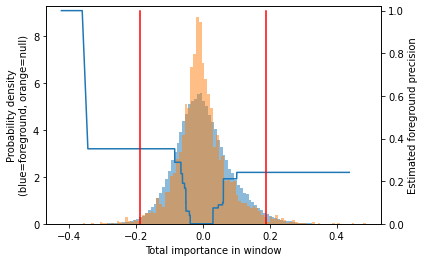

Got 889 coords
After resolving overlaps, got 889 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9698912222953697
MEMORY 1.819230208
889 identified in total
2 activity patterns with support >= 100 out of 2 possible patterns
Metacluster sizes:  [553, 336]
Idx to activities:  {0: '1', 1: '-1'}
MEMORY 1.819230208
On metacluster 1
Metacluster size 336
Relevant tasks:  ('task2',)
Relevant signs:  (-1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 336
(Round 1) Computing coarse affmat
MEMORY 1.819230208
Beginning embedding computation
MEMORY 1.819230208


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 336 out of 336 | elapsed:    2.5s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.4s
[Parallel(n_jobs=40)]: Done 336 out of 336 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 336 out of 336 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.06680655479431152 s


[Parallel(n_jobs=1)]: Done 336 out of 336 | elapsed:    0.8s finished


Constructing csr matrix...
csr matrix made in 0.06622672080993652 s
Finished embedding computation in 7.2 s
MEMORY 1.822261248
Starting affinity matrix computations
MEMORY 1.822261248
Batching in slices of size 336


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

Finished affinity matrix computations in 1.2 s
MEMORY 1.822261248
(Round 1) Computed coarse affmat
MEMORY 1.821515776
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 1.821515776
Launching nearest neighbors affmat calculation job
MEMORY 1.821515776


Parallel runs completed
MEMORY 1.835696128
Job completed in: 3.36 s
MEMORY 1.835696128
Launching nearest neighbors affmat calculation job
MEMORY 1.835696128
Parallel runs completed
MEMORY 1.768235008
Job completed in: 2.4 s
MEMORY 1.768235008
(Round 1) Computed affinity matrix on nearest neighbors in 5.94 s
MEMORY 1.768235008
Filtered down to 331 of 336
(Round 1) Retained 331 rows out of 336 after filtering
MEMORY 1.768235008
(Round 1) Computing density adapted affmat
MEMORY 1.768235008
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 1.768046592
Beginning preprocessing + Leiden
Affmat shape: 331


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    1.0s remaining:    1.2s


Quality: 0.022212436887207157
Quality: 0.023553276090482047
Got 4 clusters after round 1
Counts:
{1: 96, 0: 142, 2: 90, 3: 3}
MEMORY 1.768046592
(Round 1) Aggregating seqlets in each cluster
MEMORY 1.768046592
Aggregating for cluster 0 with 142 seqlets
MEMORY 1.768046592
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 3 seqlets that went over the sequence edge during flank expansion
Skipped 2 seqlets that went over the sequence edge during flank expansion


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.5s finished


Skipped 16 seqlets that went over the sequence edge during flank expansion
Skipped 33 seqlets that went over sequence edge during flank expansion
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 86
Skipped 11 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 96 seqlets
MEMORY 1.768046592
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 13 seqlets that went over sequence edge during flank expansion
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 81
Skipped 10 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 90 seqlets
MEMORY 1.768046592
Skipped 1 seqlets that went over the sequence edge during flank expansion
Trimming eliminated 0 seqlets out of 89
Skipped 16 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 3 seqlets
MEMORY 1.768046592
Trimming eliminated 0 seqlets out of 3
(Round 2) num

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 143 out of 222 | elapsed:    1.2s remaining:    0.7s
[Parallel(n_jobs=40)]: Done 222 out of 222 | elapsed:    1.6s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 143 out of 222 | elapsed:    1.2s remaining:    0.7s
[Parallel(n_jobs=40)]: Done 222 out of 222 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 222 out of 222 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.042273759841918945 s


[Parallel(n_jobs=1)]: Done 222 out of 222 | elapsed:    0.5s finished


Constructing csr matrix...
csr matrix made in 0.0426790714263916 s
Finished embedding computation in 4.66 s
MEMORY 1.769414656
Starting affinity matrix computations
MEMORY 1.769414656
Batching in slices of size 222


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]

Finished affinity matrix computations in 1.17 s
MEMORY 1.769414656
(Round 2) Computed coarse affmat
MEMORY 1.768890368
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 1.768890368
Launching nearest neighbors affmat calculation job
MEMORY 1.768890368


Parallel runs completed
MEMORY 1.807458304
Job completed in: 2.11 s
MEMORY 1.80719616
Launching nearest neighbors affmat calculation job
MEMORY 1.80719616
Parallel runs completed
MEMORY 1.844887552
Job completed in: 1.69 s
MEMORY 1.844887552
(Round 2) Computed affinity matrix on nearest neighbors in 3.99 s
MEMORY 1.844887552
Not applying filtering for rounds above first round
MEMORY 1.844887552
(Round 2) Computing density adapted affmat
MEMORY 1.844887552
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 1.84430592
Beginning preprocessing + Leiden
Affmat shape: 222


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.02876738207307869
Got 3 clusters after round 2
Counts:
{0: 78, 1: 77, 2: 67}
MEMORY 1.84430592
(Round 2) Aggregating seqlets in each cluster
MEMORY 1.84430592
Aggregating for cluster 0 with 78 seqlets
MEMORY 1.84430592
Skipped 2 due to duplicates
Trimming eliminated 0 seqlets out of 76
Aggregating for cluster 1 with 77 seqlets
MEMORY 1.84430592


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.1s finished


Skipped 2 seqlets that went over sequence edge during flank expansion
Skipped 1 due to duplicates
Trimming eliminated 0 seqlets out of 74
Skipped 1 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 67 seqlets
MEMORY 1.84430592
Trimming eliminated 0 seqlets out of 67
Skipped 1 seqlets that went over the sequence edge during flank expansion
Got 3 clusters
Splitting into subclusters...
MEMORY 1.84430592
Inspecting pattern 0 for spurious merging
[t-SNE] Computed conditional probabilities for sample 76 / 76
[t-SNE] Mean sigma: 0.685157
Beginning preprocessing + Leiden
Affmat shape: 76


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  74 out of  76 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  76 out of  76 | elapsed:    0.1s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.1264295195149424
Quality: 0.130981390484799
Got subclusters: Counter({0: 22, 1: 21, 2: 18, 3: 15})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


Numbers for each pattern pre-subsample: [22, 21, 18, 15]
Numbers after subsampling: [22, 21, 18, 15]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.19646310806274414 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.21117472648620605 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.16981267929077148 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.15588045120239258 s
Cluster sizes
[22 21 18 15]
Cross-contamination matrix:
[[1.   0.52 0.62 0.68]
 [0.73 1.   0.66 0.67]
 [0.73 0.53 1.   0.73]
 [0.49 0.38 0.52 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.38 0.44 0.4 ]
 [0.38 1.   0.37 0.36]
 [0.44 0.37 1.   0.47]
 [0.4  0.36 0.47 1.  ]]
Inspecting pattern 1 for spurious merging
[t-SNE] Computed conditional probabilities for sample 73 / 73
[t-SNE] Mean sigma: 0.534456
Beginning preprocessing + Leiden
Affmat shape: 73


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  68 out of  73 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  73 out of  73 | elapsed:    0.1s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.11188515119553612
Quality: 0.11202111405478062
Quality: 0.11280655802395863
Got subclusters: Counter({0: 17, 1: 16, 2: 15, 3: 13, 4: 12})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


Numbers for each pattern pre-subsample: [17, 16, 15, 13, 12]
Numbers after subsampling: [17, 16, 15, 13, 12]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.2510225772857666 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.22027277946472168 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.21751689910888672 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.18952393531799316 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.1805591583251953 s
Cluster sizes
[17 16 15 13 12]
Cross-contamination matrix:
[[1.   0.5  0.45 0.59 0.51]
 [0.7  1.   0.54 0.73 0.47]
 [0.68 0.63 1.   0.78 0.65]
 [0.62 0.51 0.53 1.   0.52]
 [0.73 0.52 0.62 0.67 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.55 0.44 0.52 0.61]
 [0.55 1.   0.44 0.49 0.45]
 [0.44 0.44 1.   0.54 0.48]
 [0.52 0.49 0.54 1.   0.48]
 [0.61 0.45 0.48 0.48 1.  ]]
Inspecting pattern 2 for spurious merging
[t-SNE] Computed conditional probabilities for sample 66 / 66
[t-SNE]

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  54 out of  66 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  66 out of  66 | elapsed:    0.1s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.


Affmat shape: 66


[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 0.08373750869004068
Quality: 0.08544046114246752
Quality: 0.08585307457055265
Got subclusters: Counter({0: 26, 1: 22, 2: 18})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


Numbers for each pattern pre-subsample: [26, 22, 18]
Numbers after subsampling: [26, 22, 18]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.13675713539123535 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.12661218643188477 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.09542393684387207 s
Cluster sizes
[26 22 18]
Cross-contamination matrix:
[[1.   0.74 0.41]
 [0.62 1.   0.31]
 [0.79 0.75 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.58 0.39]
 [0.58 1.   0.42]
 [0.39 0.42 1.  ]]
Merging on 12 clusters
MEMORY 1.84430592
On merging iteration 1
Numbers for each pattern pre-subsample: [22, 21, 18, 15, 17, 16, 15, 13, 12, 26, 22, 18]
Numbers after subsampling: [22, 21, 18, 15, 17, 16, 15, 13, 12, 26, 22, 18]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.425579309463501 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.40129613876342773 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.38424563407897

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  26 out of  26 | elapsed:    0.0s finished
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/neighbors/_base.py:176: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Iteration 50: error = 45.2910042, gradient norm = 0.6804135 (50 iterations in 7.446s)
[t-SNE] Iteration 100: error = 47.0380363, gradient norm = 0.4849893 (50 iterations in 7.456s)
[t-SNE] Iteration 150: error = 45.5909653, gradient norm = 0.6228424 (50 iterations in 7.462s)
[t-SNE] Iteration 200: error = 45.9993782, gradient norm = 0.5189822 (50 iterations in 7.450s)
[t-SNE] Iteration 250: error = 43.9974518, gradient norm = 0.6744986 (50 iterations in 7.443s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.997452
[t-SNE] Iteration 300: error = 0.5115682, gradient norm = 0.0007732 (50 iterations in 7.454s)
[t-SNE] Iteration 350: error = 0.4699631, gradient norm = 0.0000910 (50 iterations in 7.455s)
[t-SNE] Iteration 400: error = 0.4671836, gradient norm = 0.0000752 (50 iterations in 7.442s)
[t-SNE] Iteration 450: error = 0.4646883, gradient norm = 0.0000533 (50 iterations in 7.458s)
[t-SNE] Iteration 500: error = 0.4626261, gradient norm = 0.0000489 (50 

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.6s remaining:    0.8s


Quality: 1.7763568394002767e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  12 out of  22 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  22 out of  22 | elapsed:    0.0s finished


Got subclusters: Counter({0: 26})
On pattern 1
[t-SNE] Computing 21 nearest neighbors...
[t-SNE] Indexed 22 samples in 0.002s...
[t-SNE] Computed neighbors for 22 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 22 / 22
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 44.3793297, gradient norm = 0.3461688 (50 iterations in 7.443s)
[t-SNE] Iteration 100: error = 43.8049088, gradient norm = 0.5759797 (50 iterations in 7.443s)
[t-SNE] Iteration 150: error = 46.6108513, gradient norm = 0.4330510 (50 iterations in 7.459s)
[t-SNE] Iteration 200: error = 48.2097588, gradient norm = 0.7426546 (50 iterations in 7.449s)
[t-SNE] Iteration 250: error = 43.1336288, gradient norm = 0.6100508 (50 iterations in 7.455s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.133629
[t-SNE] Iteration 300: error = 0.5392894, gradient norm = 0.0009812 (50 iterations in 7.457s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: -4.873879078104465e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  12 out of  22 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  22 out of  22 | elapsed:    0.0s finished


Got subclusters: Counter({0: 22})
On pattern 2
[t-SNE] Computing 21 nearest neighbors...
[t-SNE] Indexed 22 samples in 0.001s...
[t-SNE] Computed neighbors for 22 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 22 / 22
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.003s
[t-SNE] Iteration 50: error = 44.3793335, gradient norm = 0.3461688 (50 iterations in 7.408s)
[t-SNE] Iteration 100: error = 43.8049088, gradient norm = 0.5759797 (50 iterations in 7.421s)
[t-SNE] Iteration 150: error = 46.6108398, gradient norm = 0.4330510 (50 iterations in 7.446s)
[t-SNE] Iteration 200: error = 48.2097549, gradient norm = 0.7426546 (50 iterations in 7.425s)
[t-SNE] Iteration 250: error = 43.1336288, gradient norm = 0.6100508 (50 iterations in 7.437s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.133629
[t-SNE] Iteration 300: error = 0.5392894, gradient norm = 0.0009812 (50 iterations in 7.470s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: -4.873879078104465e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done   8 out of  21 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  21 out of  21 | elapsed:    0.0s finished


Got subclusters: Counter({0: 22})
On pattern 3
[t-SNE] Computing 20 nearest neighbors...
[t-SNE] Indexed 21 samples in 0.001s...
[t-SNE] Computed neighbors for 21 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 21 / 21
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 48.0560799, gradient norm = 0.3865097 (50 iterations in 7.448s)
[t-SNE] Iteration 100: error = 47.6853333, gradient norm = 0.4990253 (50 iterations in 7.463s)
[t-SNE] Iteration 150: error = 44.5329285, gradient norm = 0.6750193 (50 iterations in 7.463s)
[t-SNE] Iteration 200: error = 44.3952332, gradient norm = 0.6440527 (50 iterations in 7.467s)
[t-SNE] Iteration 250: error = 42.6491432, gradient norm = 0.4963783 (50 iterations in 7.459s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 42.649143
[t-SNE] Iteration 300: error = 0.4813174, gradient norm = 0.0009006 (50 iterations in 7.434s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 4.44089209850064e-16
Got subclusters: Counter({0: 21})
On metacluster 0
Metacluster size 553
Relevant tasks:  ('task2',)
Relevant signs:  (1,)


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 553
(Round 1) Computing coarse affmat
MEMORY 1.843781632
Beginning embedding computation
MEMORY 1.843781632


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.4s
[Parallel(n_jobs=40)]: Done 474 out of 553 | elapsed:    3.6s remaining:    0.6s
[Parallel(n_jobs=40)]: Done 553 out of 553 | elapsed:    4.1s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.4s
[Parallel(n_jobs=40)]: Done 553 out of 553 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 553 out of 553 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.1150200366973877 s


[Parallel(n_jobs=1)]: Done 553 out of 553 | elapsed:    1.3s finished


Constructing csr matrix...
csr matrix made in 0.11726522445678711 s
Finished embedding computation in 11.43 s
MEMORY 1.850548224
Starting affinity matrix computations
MEMORY 1.850548224
Batching in slices of size 553


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

Finished affinity matrix computations in 1.26 s
MEMORY 1.850548224
(Round 1) Computed coarse affmat
MEMORY 1.849237504
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 1.849237504
Launching nearest neighbors affmat calculation job
MEMORY 1.849237504


Parallel runs completed
MEMORY 1.873260544
Job completed in: 5.96 s
MEMORY 1.8729984
Launching nearest neighbors affmat calculation job
MEMORY 1.8729984
Parallel runs completed
MEMORY 1.937317888
Job completed in: 5.94 s
MEMORY 1.937055744
(Round 1) Computed affinity matrix on nearest neighbors in 12.12 s
MEMORY 1.937055744
Filtered down to 527 of 553
(Round 1) Retained 527 rows out of 553 after filtering
MEMORY 1.937055744
(Round 1) Computing density adapted affmat
MEMORY 1.9367936
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 1.976233984
Beginning preprocessing + Leiden
Affmat shape: 527


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    1.6s remaining:    2.1s


Quality: 0.02399319232980486
Quality: 0.02402330824559253
Quality: 0.024034488574856048
Quality: 0.024052273075338533
Quality: 0.024136522019856155
Got 3 clusters after round 1
Counts:
{1: 190, 2: 146, 0: 191}
MEMORY 1.976233984
(Round 1) Aggregating seqlets in each cluster
MEMORY 1.976233984
Aggregating for cluster 0 with 191 seqlets
MEMORY 1.976233984


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    2.4s finished


Skipped 2 seqlets that went over the sequence edge during flank expansion
Skipped 12 seqlets that went over sequence edge during flank expansion
Skipped 20 due to duplicates
Trimming eliminated 0 seqlets out of 157
Skipped 5 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 190 seqlets
MEMORY 1.976233984
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 9 seqlets that went over the sequence edge during flank expansion
Skipped 22 seqlets that went over the sequence edge during flank expansion
Skipped 11 seqlets that went over sequence edge during flank expansion
Skipped 8 due to duplicates
Trimming eliminated 0 seqlets out of 139
Skipped 15 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 146 seqlets
MEMORY 1.976233984
Skipped 6 seqlets that went over the sequence edge during flank expansion
Skipped 4 seqlets that went over the sequence edge during flank expansion
S

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 356 out of 356 | elapsed:    2.4s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=40)]: Done 356 out of 356 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 356 out of 356 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Constructing csr matrix...
csr matrix made in 0.06927251815795898 s


[Parallel(n_jobs=1)]: Done 356 out of 356 | elapsed:    0.8s finished


Constructing csr matrix...
csr matrix made in 0.06902837753295898 s
Finished embedding computation in 7.07 s
MEMORY 1.980555264
Starting affinity matrix computations
MEMORY 1.980555264
Batching in slices of size 356


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]

Finished affinity matrix computations in 1.2 s
MEMORY 1.980555264
(Round 2) Computed coarse affmat
MEMORY 1.9789824
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 1.9789824
Launching nearest neighbors affmat calculation job
MEMORY 1.9789824


Parallel runs completed
MEMORY 1.97586944
Job completed in: 3.14 s
MEMORY 1.97586944
Launching nearest neighbors affmat calculation job
MEMORY 1.97586944
Parallel runs completed
MEMORY 1.974996992
Job completed in: 3.49 s
MEMORY 1.974996992
(Round 2) Computed affinity matrix on nearest neighbors in 6.82 s
MEMORY 1.90871552
Not applying filtering for rounds above first round
MEMORY 1.90871552
(Round 2) Computing density adapted affmat
MEMORY 1.90871552
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 1.848082432
Beginning preprocessing + Leiden
Affmat shape: 356


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    1.0s remaining:    1.2s


Quality: 0.027073717440496334
Quality: 0.02707457597515732
Got 5 clusters after round 2
Counts:
{1: 119, 2: 91, 0: 137, 3: 6, 4: 3}
MEMORY 1.848082432
(Round 2) Aggregating seqlets in each cluster
MEMORY 1.848082432
Aggregating for cluster 0 with 137 seqlets
MEMORY 1.848082432
Skipped 12 due to duplicates
Trimming eliminated 0 seqlets out of 125
Skipped 1 seqlets that went over the sequence edge during flank expansion


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.5s finished


Aggregating for cluster 1 with 119 seqlets
MEMORY 1.848082432
Skipped 11 due to duplicates
Trimming eliminated 0 seqlets out of 108
Aggregating for cluster 2 with 91 seqlets
MEMORY 1.848082432
Skipped 5 due to duplicates
Trimming eliminated 0 seqlets out of 86
Aggregating for cluster 3 with 6 seqlets
MEMORY 1.848082432
Skipped 2 due to duplicates
Trimming eliminated 0 seqlets out of 4
Aggregating for cluster 4 with 3 seqlets
MEMORY 1.848082432
Trimming eliminated 0 seqlets out of 3
Got 5 clusters
Splitting into subclusters...
MEMORY 1.847820288
Inspecting pattern 0 for spurious merging
[t-SNE] Computed conditional probabilities for sample 124 / 124
[t-SNE] Mean sigma: 0.467015


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 124 out of 124 | elapsed:    0.2s finished


Beginning preprocessing + Leiden
Affmat shape: 124


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.22587053997793136
Quality: 0.22787335789280974
Quality: 0.22945035697129268
Got subclusters: Counter({0: 34, 1: 29, 2: 25, 3: 17, 4: 7, 5: 6, 7: 3, 6: 3})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.1s finished


Numbers for each pattern pre-subsample: [34, 29, 25, 17, 7, 6, 3, 3]
Numbers after subsampling: [34, 29, 25, 17, 7, 6, 3, 3]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.6021087169647217 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.5399272441864014 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.44718003273010254 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.346545934677124 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.19437909126281738 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.17999672889709473 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.12731504440307617 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.1281590461730957 s
Cluster sizes
[34 29 25 17  7  6  3  3]
Cross-contamination matrix:
[[1.   0.58 0.61 0.74 0.51 0.56 0.69 0.46]
 [0.75 1.   0.7  0.77 0.53 0.46 0.79 0.54]
 [0.7  0.64 1.   0.77 0.55 0.8  0.73 0.42]
 [0.52 0.42 0.48 1.   0.38 

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 108 out of 108 | elapsed:    0.1s finished


Beginning preprocessing + Leiden
Affmat shape: 108


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.23525977788898356
Quality: 0.236634638637234
Quality: 0.23685868047319342
Got subclusters: Counter({0: 44, 1: 22, 2: 16, 3: 15, 4: 11})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.1s finished


Numbers for each pattern pre-subsample: [44, 22, 16, 15, 11]
Numbers after subsampling: [44, 22, 16, 15, 11]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.4189639091491699 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.23340702056884766 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.1839454174041748 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.1925804615020752 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.16170001029968262 s
Cluster sizes
[44 22 16 15 11]
Cross-contamination matrix:
[[1.   0.29 0.4  0.59 0.56]
 [0.45 1.   0.44 0.68 0.51]
 [0.55 0.44 1.   0.49 0.55]
 [0.5  0.4  0.23 1.   0.42]
 [0.72 0.46 0.6  0.64 1.  ]]
Pattern-to-pattern sim matrix:
[[1.   0.33 0.26 0.28 0.29]
 [0.33 1.   0.28 0.38 0.31]
 [0.26 0.28 1.   0.29 0.26]
 [0.28 0.38 0.29 1.   0.32]
 [0.29 0.31 0.26 0.32 1.  ]]
Inspecting pattern 2 for spurious merging
[t-SNE] Computed conditional probabilities for sample 86 / 86
[t-SNE] 

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  86 out of  86 | elapsed:    0.1s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.


Affmat shape: 86


[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 0.1639245109046714
Quality: 0.16445983331907174
Quality: 0.1647897771060136
Quality: 0.16530413643813321
Quality: 0.1653445394182791
Quality: 0.16568313705531676
Got subclusters: Counter({0: 24, 1: 23, 2: 15, 3: 11, 4: 7, 5: 4, 6: 2})
On merging iteration 1


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


Numbers for each pattern pre-subsample: [24, 23, 15, 11, 7, 4, 2]
Numbers after subsampling: [24, 23, 15, 11, 7, 4, 2]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.3794283866882324 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.39074182510375977 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.2569420337677002 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.23557233810424805 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.19924712181091309 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.13754940032958984 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.09070038795471191 s
Cluster sizes
[24 23 15 11  7  4  2]
Cross-contamination matrix:
[[1.   0.46 0.65 0.59 0.27 0.34 0.17]
 [0.48 1.   0.69 0.65 0.89 0.32 0.32]
 [0.54 0.61 1.   0.59 0.68 0.29 0.06]
 [0.59 0.48 0.54 1.   0.62 0.24 0.09]
 [0.17 0.36 0.09 0.28 1.   0.13 0.03]
 [0.45 0.42 0.52 0.56 0.36 1.   0.19]
 [0.   0.   0.  

Performing filtering
MEMORY 1.847865344
Got 7 patterns after filtering
MEMORY 1.847865344
Total time taken is 79.49s
MEMORY 1.847865344
Applying subclustering to the final motifs
On pattern 0
[t-SNE] Computing 43 nearest neighbors...
[t-SNE] Indexed 44 samples in 0.002s...
[t-SNE] Computed neighbors for 44 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 44 / 44
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.007s


[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  10 out of  44 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=40)]: Done  44 out of  44 | elapsed:    0.1s finished
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning
/home/drew/anaconda3/envs/deeplift-modisco/lib/python3.7/site-packages/sklearn/neighbors/_base.py:176: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  EfficiencyWarning)


[t-SNE] Iteration 50: error = 40.5052109, gradient norm = 0.6768233 (50 iterations in 7.397s)
[t-SNE] Iteration 100: error = 45.2412567, gradient norm = 0.5331056 (50 iterations in 7.461s)
[t-SNE] Iteration 150: error = 43.0287819, gradient norm = 0.4019227 (50 iterations in 7.439s)
[t-SNE] Iteration 200: error = 45.6386299, gradient norm = 0.3219467 (50 iterations in 7.470s)
[t-SNE] Iteration 250: error = 46.4398651, gradient norm = 0.2746951 (50 iterations in 7.466s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.439865
[t-SNE] Iteration 300: error = 0.8071541, gradient norm = 0.0010557 (50 iterations in 7.465s)
[t-SNE] Iteration 350: error = 0.6543225, gradient norm = 0.0004931 (50 iterations in 7.454s)
[t-SNE] Iteration 400: error = 0.5906200, gradient norm = 0.0001334 (50 iterations in 7.443s)
[t-SNE] Iteration 450: error = 0.5879757, gradient norm = 0.0000501 (50 iterations in 7.457s)
[t-SNE] Iteration 500: error = 0.5875051, gradient norm = 0.0000369 (50 

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: -1.584288256140165e-13


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  25 out of  34 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  34 out of  34 | elapsed:    0.0s finished


Got subclusters: Counter({0: 44})
On pattern 1
[t-SNE] Computing 33 nearest neighbors...
[t-SNE] Indexed 34 samples in 0.002s...
[t-SNE] Computed neighbors for 34 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 34 / 34
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.007s
[t-SNE] Iteration 50: error = 45.4729271, gradient norm = 0.3850566 (50 iterations in 7.443s)
[t-SNE] Iteration 100: error = 41.4449615, gradient norm = 0.6544425 (50 iterations in 7.462s)
[t-SNE] Iteration 150: error = 50.2451210, gradient norm = 0.5466656 (50 iterations in 7.458s)
[t-SNE] Iteration 200: error = 48.2897339, gradient norm = 0.4883336 (50 iterations in 7.462s)
[t-SNE] Iteration 250: error = 43.7722893, gradient norm = 0.5463325 (50 iterations in 7.463s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.772289
[t-SNE] Iteration 300: error = 0.5802801, gradient norm = 0.0008364 (50 iterations in 7.467s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: -1.0069722833350307e-13


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  10 out of  29 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  29 out of  29 | elapsed:    0.0s finished


Got subclusters: Counter({0: 34})
On pattern 2
[t-SNE] Computing 28 nearest neighbors...
[t-SNE] Indexed 29 samples in 0.002s...
[t-SNE] Computed neighbors for 29 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 29 / 29
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 48.4794693, gradient norm = 0.4074141 (50 iterations in 7.413s)
[t-SNE] Iteration 100: error = 46.8057938, gradient norm = 0.5988194 (50 iterations in 7.428s)
[t-SNE] Iteration 150: error = 46.7883720, gradient norm = 0.4790182 (50 iterations in 7.468s)
[t-SNE] Iteration 200: error = 43.6341324, gradient norm = 0.5630386 (50 iterations in 7.458s)
[t-SNE] Iteration 250: error = 43.6633301, gradient norm = 0.3892723 (50 iterations in 7.443s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.663330
[t-SNE] Iteration 300: error = 0.5556838, gradient norm = 0.0008496 (50 iterations in 7.451s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: -5.329070518200668e-15


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  25 out of  25 | elapsed:    0.0s finished


Got subclusters: Counter({0: 29})
On pattern 3
[t-SNE] Computing 24 nearest neighbors...
[t-SNE] Indexed 25 samples in 0.001s...
[t-SNE] Computed neighbors for 25 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 25 / 25
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 48.3642426, gradient norm = 0.4966776 (50 iterations in 7.445s)
[t-SNE] Iteration 100: error = 51.4994125, gradient norm = 0.5245329 (50 iterations in 7.444s)
[t-SNE] Iteration 150: error = 41.6517677, gradient norm = 0.7918428 (50 iterations in 7.447s)
[t-SNE] Iteration 200: error = 47.2219238, gradient norm = 0.3785344 (50 iterations in 7.451s)
[t-SNE] Iteration 250: error = 41.7042084, gradient norm = 0.6758102 (50 iterations in 7.459s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 41.704208
[t-SNE] Iteration 300: error = 0.7896508, gradient norm = 0.0010434 (50 iterations in 7.460s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: -1.332267629550175e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  20 out of  24 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  24 out of  24 | elapsed:    0.0s finished


Got subclusters: Counter({0: 25})
On pattern 4
[t-SNE] Computing 23 nearest neighbors...
[t-SNE] Indexed 24 samples in 0.002s...
[t-SNE] Computed neighbors for 24 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 24 / 24
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.005s
[t-SNE] Iteration 50: error = 49.2344055, gradient norm = 0.5288350 (50 iterations in 7.443s)
[t-SNE] Iteration 100: error = 50.6861191, gradient norm = 0.5744531 (50 iterations in 7.459s)
[t-SNE] Iteration 150: error = 45.8535538, gradient norm = 0.6550605 (50 iterations in 7.464s)
[t-SNE] Iteration 200: error = 44.3336411, gradient norm = 0.3698129 (50 iterations in 7.465s)
[t-SNE] Iteration 250: error = 48.0599937, gradient norm = 0.5015129 (50 iterations in 7.461s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.059994
[t-SNE] Iteration 300: error = 0.4756823, gradient norm = 0.0007955 (50 iterations in 7.453s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.9s


Quality: 5.995204332975825e-14


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  16 out of  23 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  23 out of  23 | elapsed:    0.0s finished


Got subclusters: Counter({0: 24})
On pattern 5
[t-SNE] Computing 22 nearest neighbors...
[t-SNE] Indexed 23 samples in 0.001s...
[t-SNE] Computed neighbors for 23 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 23 / 23
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.003s
[t-SNE] Iteration 50: error = 46.0002785, gradient norm = 0.4982804 (50 iterations in 7.415s)
[t-SNE] Iteration 100: error = 44.1054649, gradient norm = 0.5513866 (50 iterations in 7.403s)
[t-SNE] Iteration 150: error = 48.6218987, gradient norm = 0.4345824 (50 iterations in 7.468s)
[t-SNE] Iteration 200: error = 44.8836594, gradient norm = 0.4291351 (50 iterations in 7.458s)
[t-SNE] Iteration 250: error = 48.0164413, gradient norm = 0.5554816 (50 iterations in 7.465s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.016441
[t-SNE] Iteration 300: error = 0.4577458, gradient norm = 0.0007066 (50 iterations in 7.474s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: 8.881784197001296e-16


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished
[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  12 out of  22 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=40)]: Done  22 out of  22 | elapsed:    0.0s finished


Got subclusters: Counter({0: 23})
On pattern 6
[t-SNE] Computing 21 nearest neighbors...
[t-SNE] Indexed 22 samples in 0.001s...
[t-SNE] Computed neighbors for 22 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 22 / 22
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.004s
[t-SNE] Iteration 50: error = 44.3793373, gradient norm = 0.3461688 (50 iterations in 7.432s)
[t-SNE] Iteration 100: error = 43.8049088, gradient norm = 0.5759797 (50 iterations in 7.453s)
[t-SNE] Iteration 150: error = 46.6108437, gradient norm = 0.4330510 (50 iterations in 7.444s)
[t-SNE] Iteration 200: error = 48.2097626, gradient norm = 0.7426546 (50 iterations in 7.427s)
[t-SNE] Iteration 250: error = 43.1336365, gradient norm = 0.6100508 (50 iterations in 7.456s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.133636
[t-SNE] Iteration 300: error = 0.5392894, gradient norm = 0.0009812 (50 iterations in 7.434s)
[t-SNE] Ite

[Parallel(n_jobs=40)]: Using backend LokyBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done  22 out of  50 | elapsed:    0.7s remaining:    0.8s


Quality: -4.8405723873657097e-14
Got subclusters: Counter({0: 22})


[Parallel(n_jobs=40)]: Done  50 out of  50 | elapsed:    1.0s finished


In [36]:
null_per_pos_scores = modisco.coordproducers.LaplaceNullDist(num_to_samp=5000)
tfmodisco_results = modisco.tfmodisco_workflow.workflow.TfModiscoWorkflow(
                    #Slight modifications from the default settings
                    sliding_window_size=5,
                    flank_size=10,
                    target_seqlet_fdr=0.01,
                    seqlets_to_patterns_factory=
                     modisco.tfmodisco_workflow.seqlets_to_patterns.TfModiscoSeqletsToPatternsFactory(
                        trim_to_window_size=15,
                        initial_flank_to_add=5,
                        final_min_cluster_size=20,
                         n_cores=40)
                )(
                 task_names=["task2"], #"task1", "task2"],
                 contrib_scores=task_to_scores,
                 hypothetical_contribs=task_to_hyp_scores,
                 one_hot=onehot_sequences,
                 null_per_pos_scores = null_per_pos_scores)

In [37]:
import h5py
from importlib import reload
import modisco.util
reload(modisco.util)
![[ -e tRNABodyTest_results.hdf5 ]] && rm tRNABodyTest_results.hdf5
grp = h5py.File("tf_modisco/tRNet_modisco_results_inactive.hdf5", "w")
tfmodisco_results.save_hdf5(grp)
grp.close()

Metaclusters heatmap


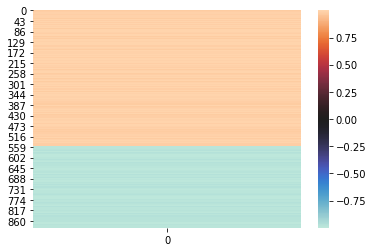

metacluster_0
activity pattern: [1]
metacluster_0 pattern_0
total seqlets: 44
Task 2 hypothetical scores:


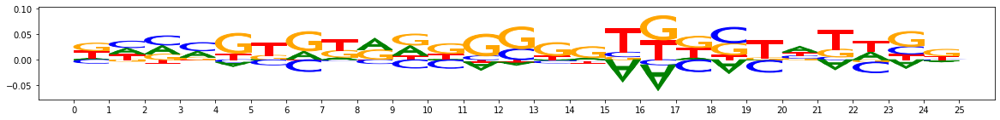

Task 2 actual importance scores:


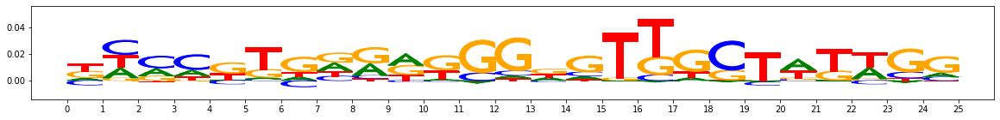

onehot, fwd and rev:


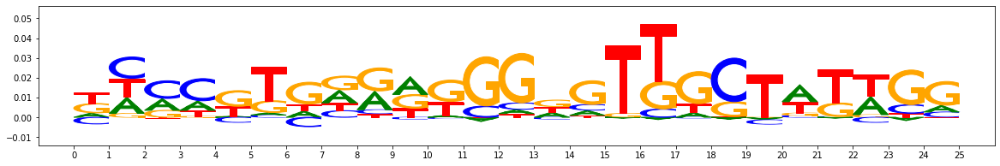

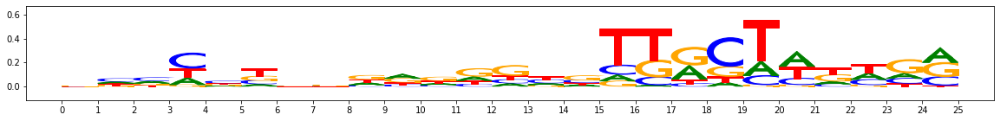

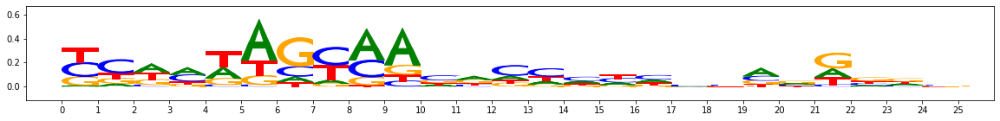

PLOTTING SUBCLUSTERS


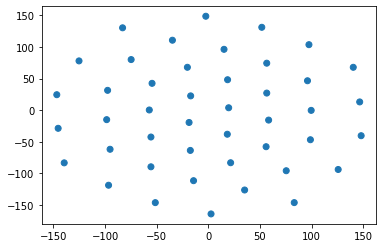

subcluster_0 size 44


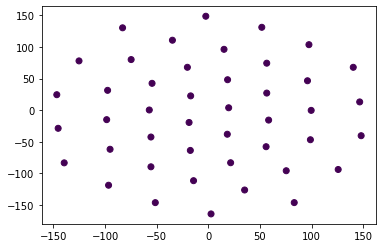

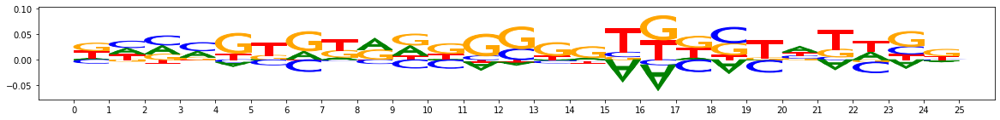

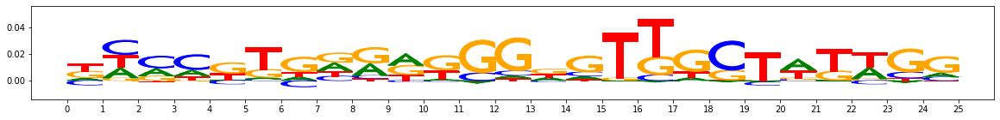

metacluster_0 pattern_1
total seqlets: 34
Task 2 hypothetical scores:


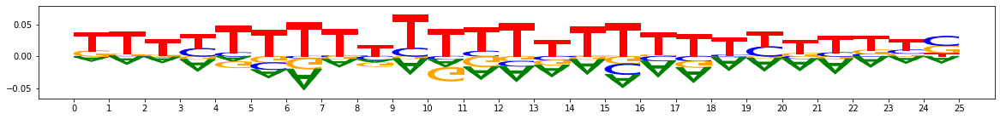

Task 2 actual importance scores:


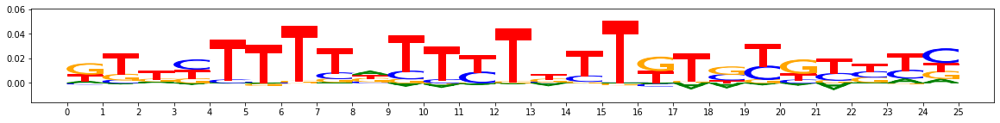

onehot, fwd and rev:


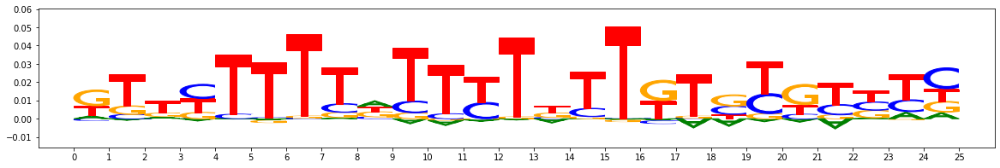

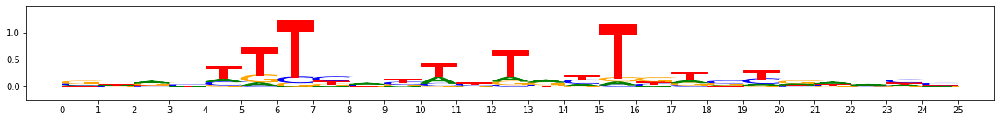

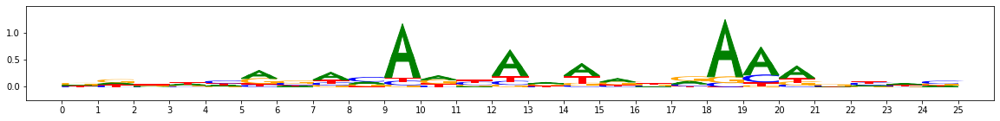

PLOTTING SUBCLUSTERS


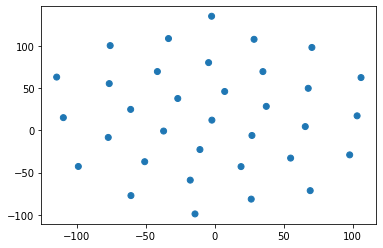

subcluster_0 size 34


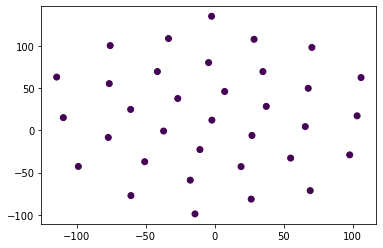

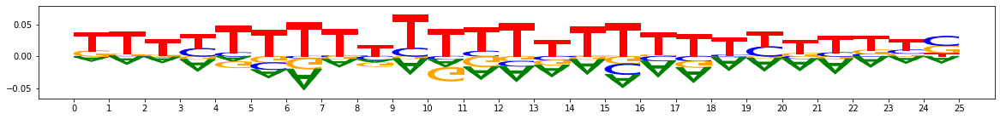

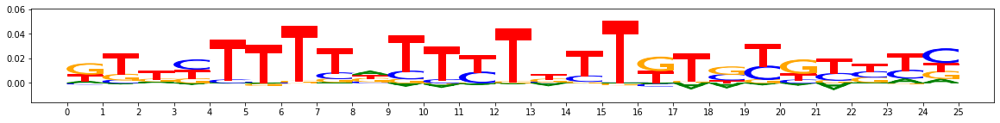

metacluster_0 pattern_2
total seqlets: 29
Task 2 hypothetical scores:


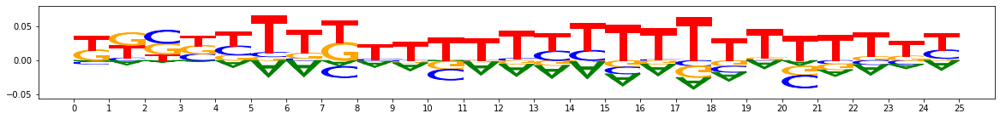

Task 2 actual importance scores:


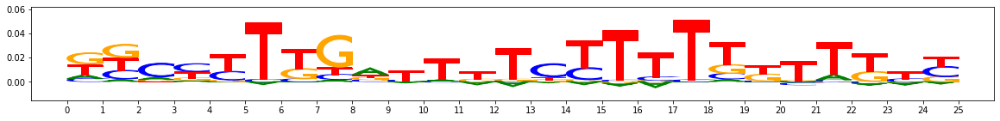

onehot, fwd and rev:


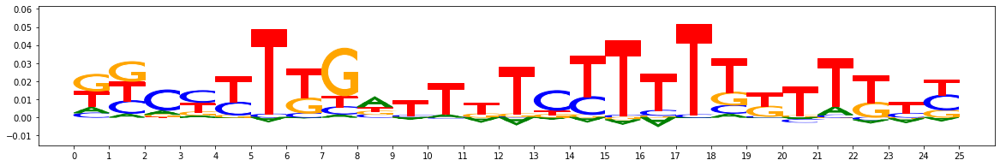

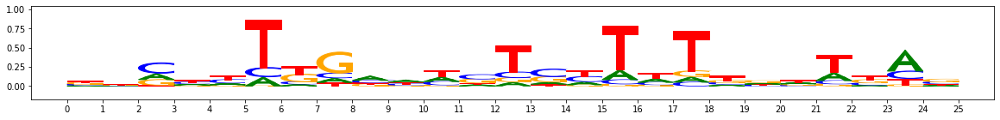

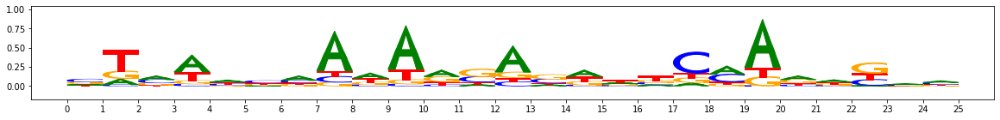

PLOTTING SUBCLUSTERS


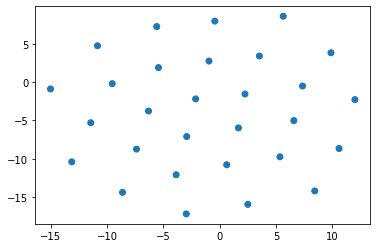

subcluster_0 size 29


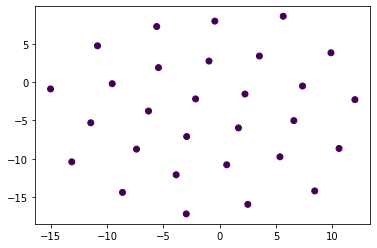

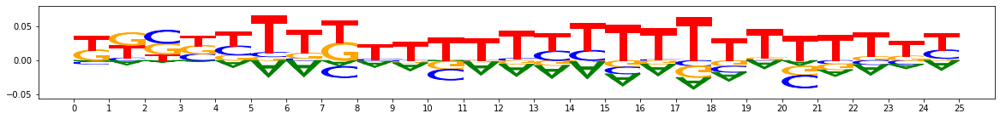

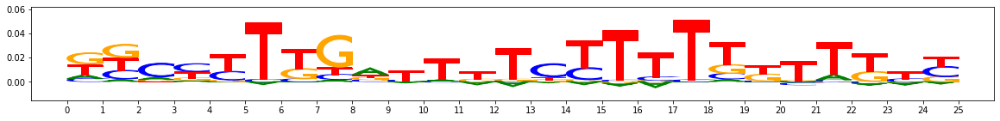

metacluster_0 pattern_3
total seqlets: 25
Task 2 hypothetical scores:


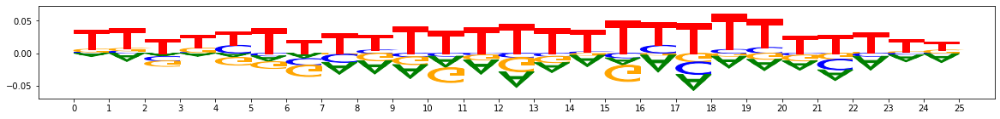

Task 2 actual importance scores:


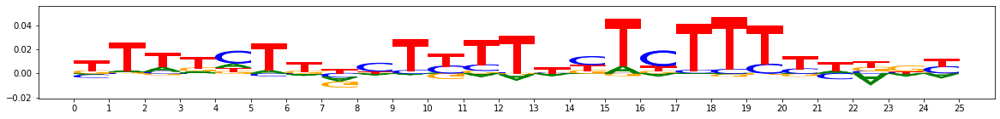

onehot, fwd and rev:


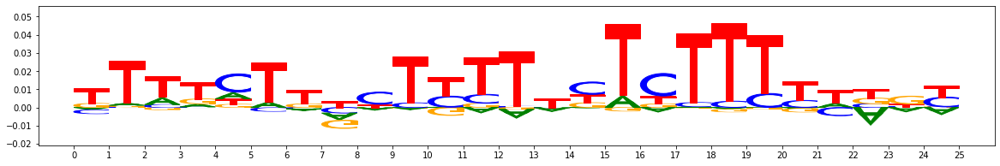

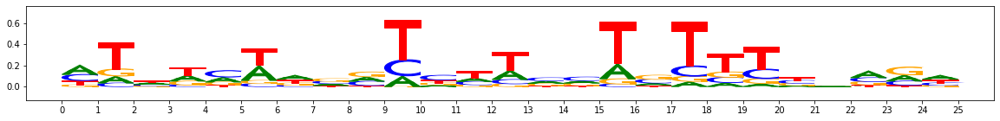

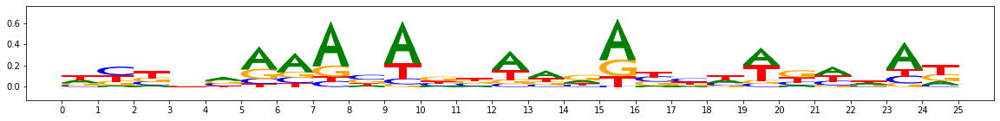

PLOTTING SUBCLUSTERS


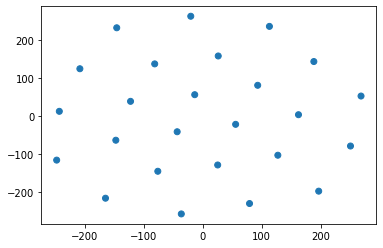

subcluster_0 size 25


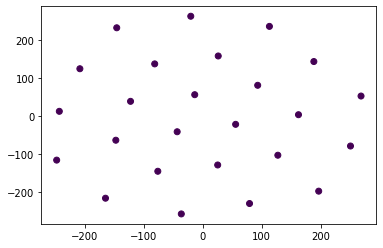

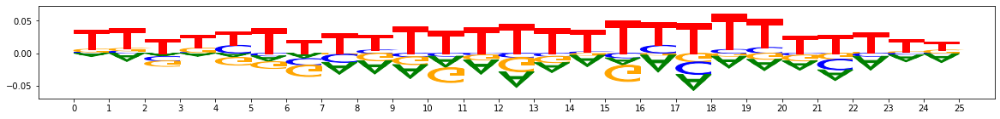

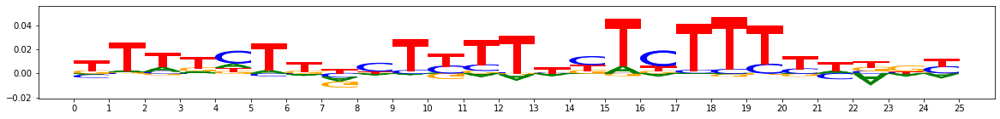

metacluster_0 pattern_4
total seqlets: 24
Task 2 hypothetical scores:


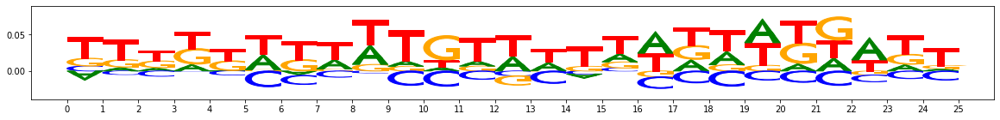

Task 2 actual importance scores:


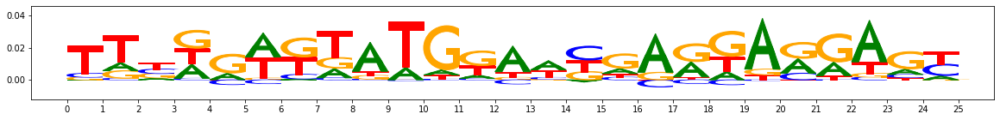

onehot, fwd and rev:


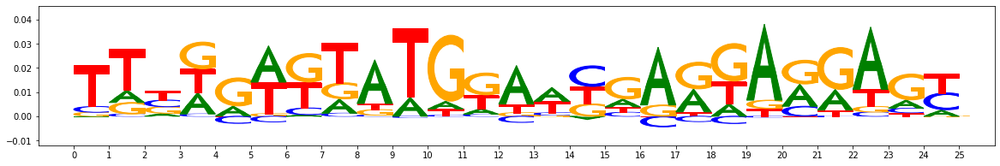

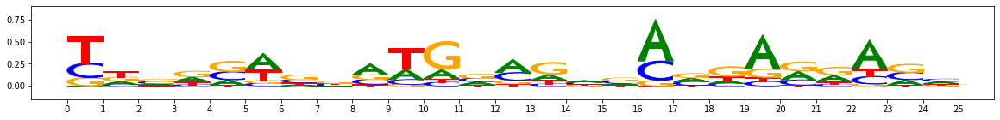

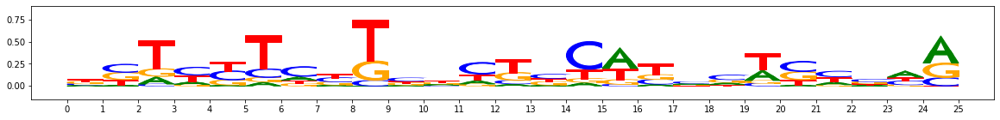

PLOTTING SUBCLUSTERS


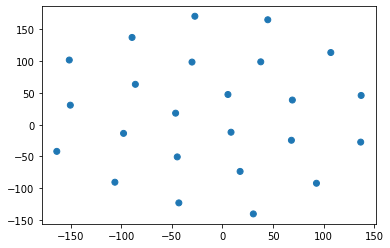

subcluster_0 size 24


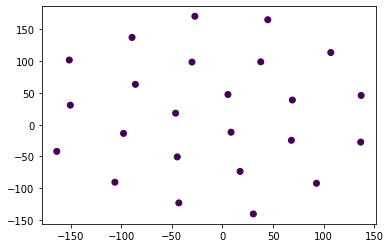

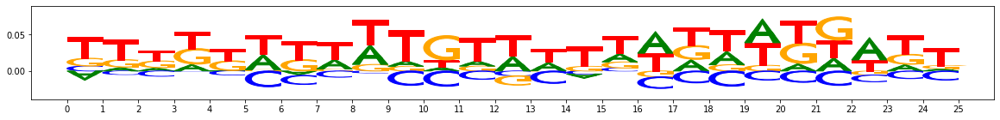

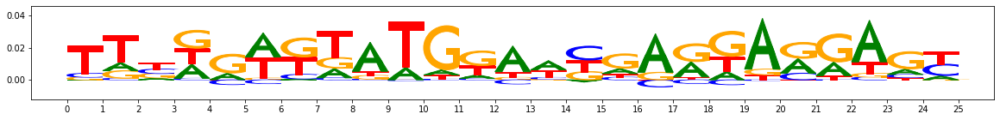

metacluster_0 pattern_5
total seqlets: 23
Task 2 hypothetical scores:


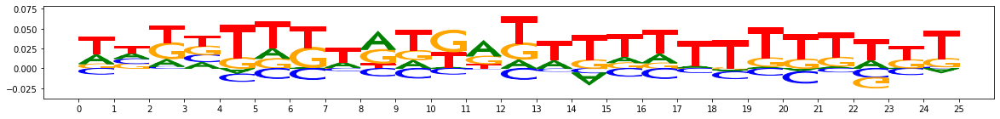

Task 2 actual importance scores:


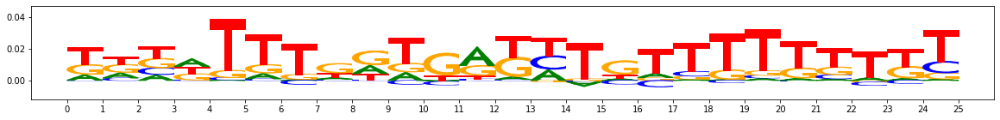

onehot, fwd and rev:


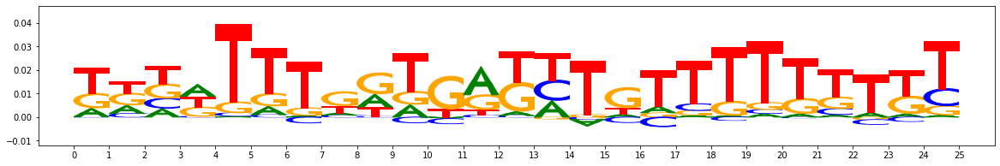

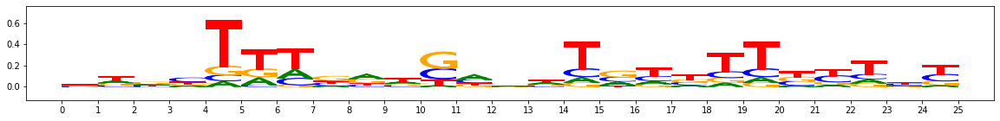

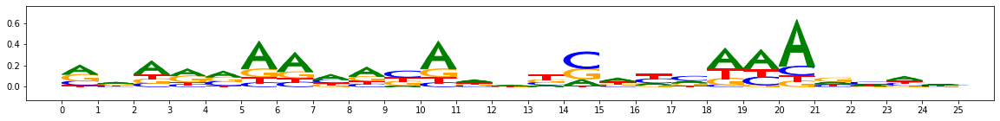

PLOTTING SUBCLUSTERS


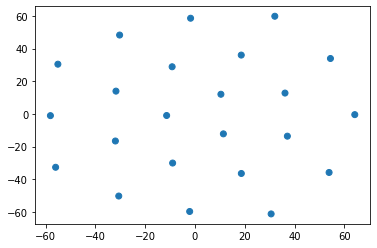

subcluster_0 size 23


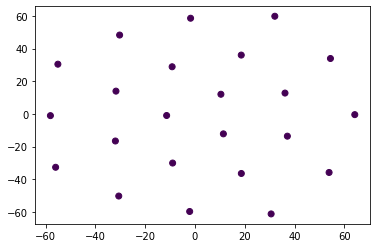

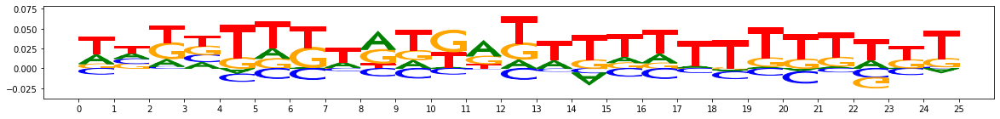

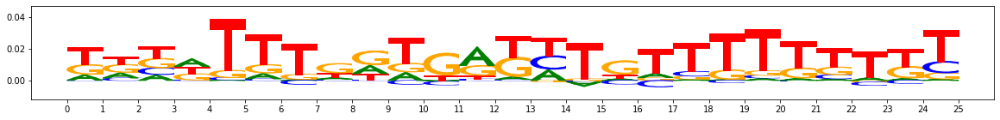

metacluster_0 pattern_6
total seqlets: 22
Task 2 hypothetical scores:


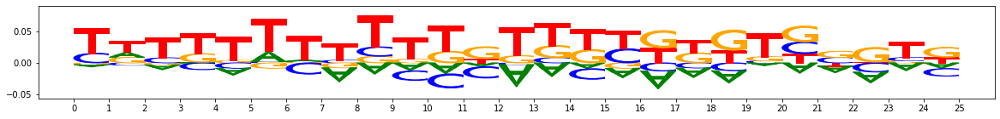

Task 2 actual importance scores:


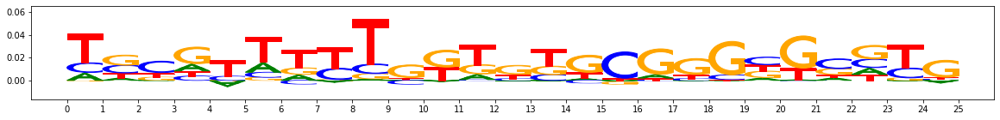

onehot, fwd and rev:


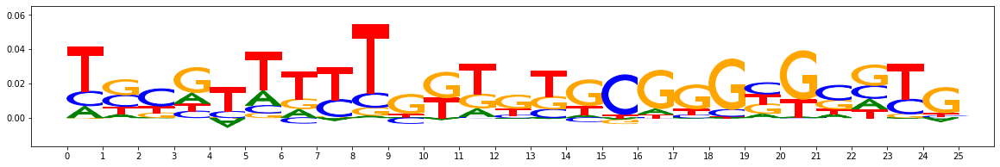

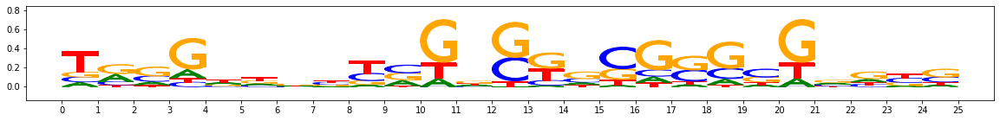

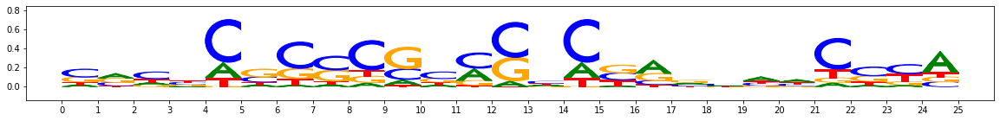

PLOTTING SUBCLUSTERS


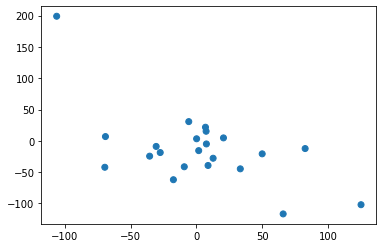

subcluster_0 size 22


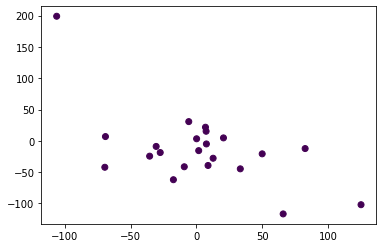

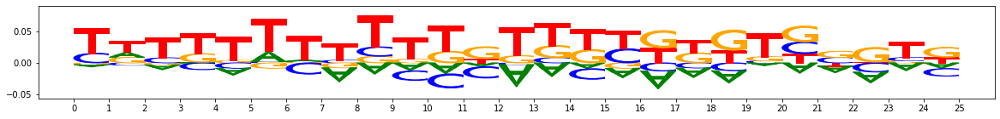

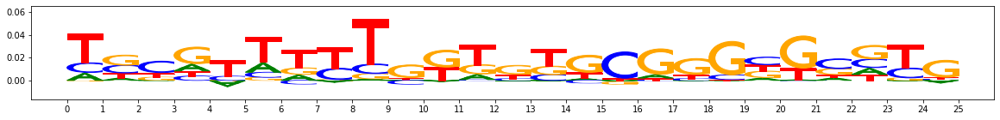

metacluster_1
activity pattern: [-1]
metacluster_1 pattern_0
total seqlets: 26
Task 2 hypothetical scores:


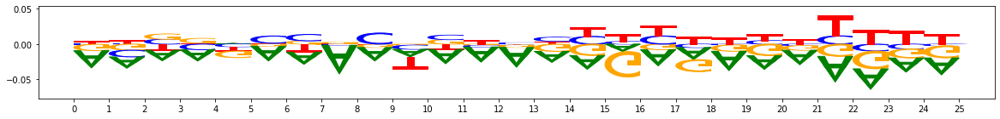

Task 2 actual importance scores:


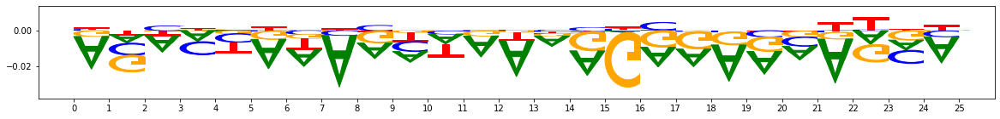

onehot, fwd and rev:


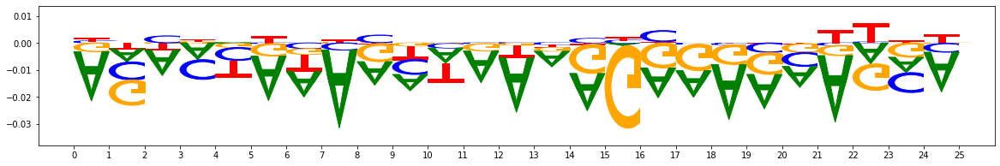

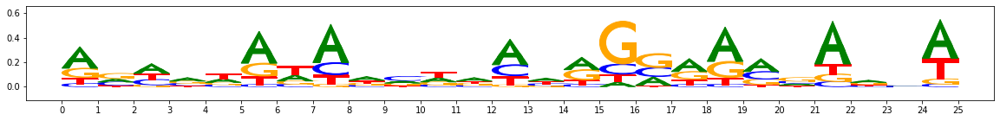

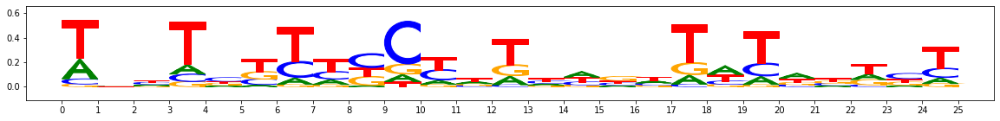

PLOTTING SUBCLUSTERS


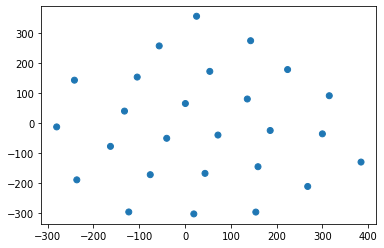

subcluster_0 size 26


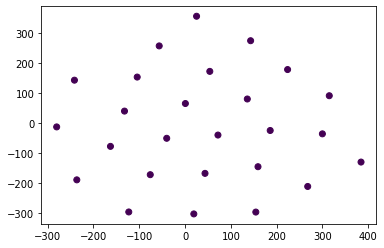

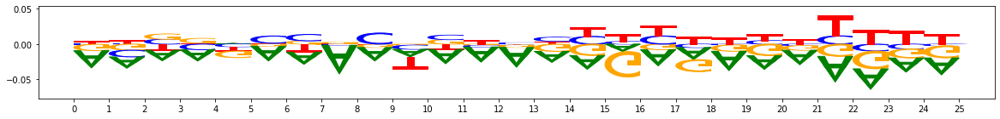

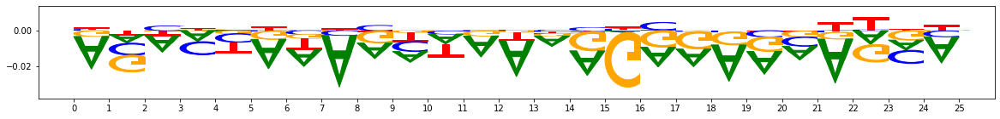

metacluster_1 pattern_1
total seqlets: 22
Task 2 hypothetical scores:


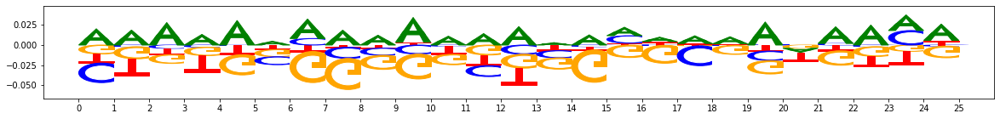

Task 2 actual importance scores:


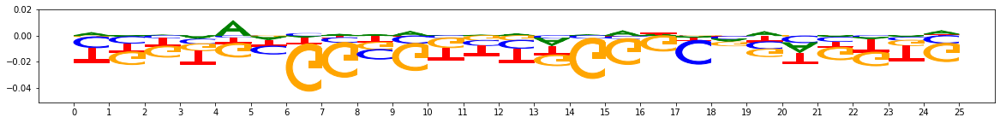

onehot, fwd and rev:


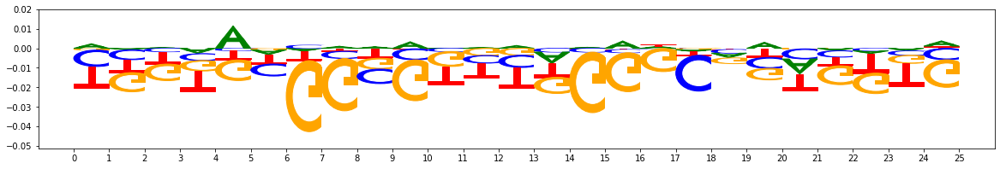

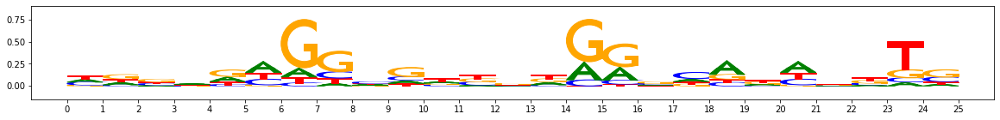

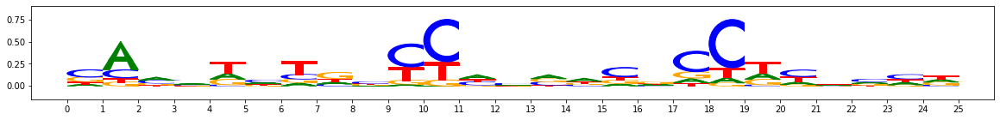

PLOTTING SUBCLUSTERS


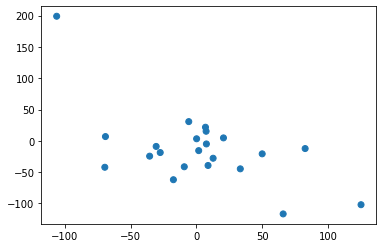

subcluster_0 size 22


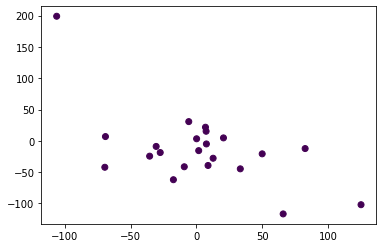

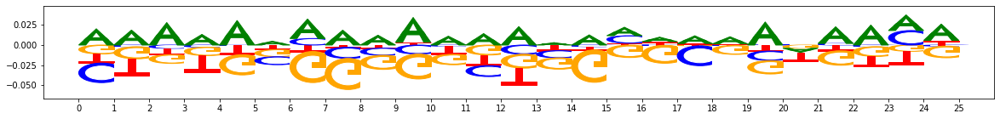

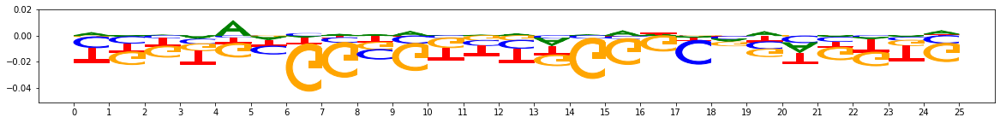

metacluster_1 pattern_2
total seqlets: 22
Task 2 hypothetical scores:


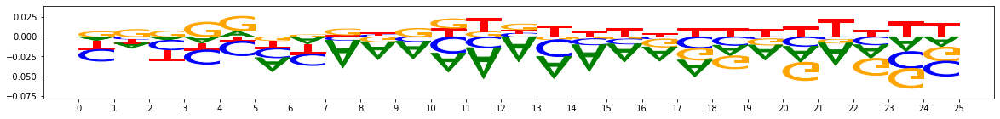

Task 2 actual importance scores:


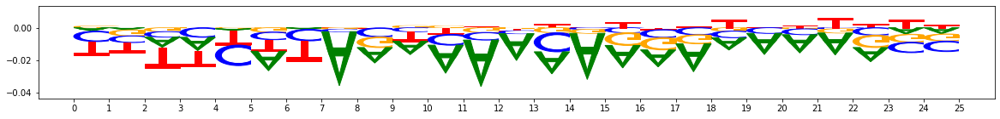

onehot, fwd and rev:


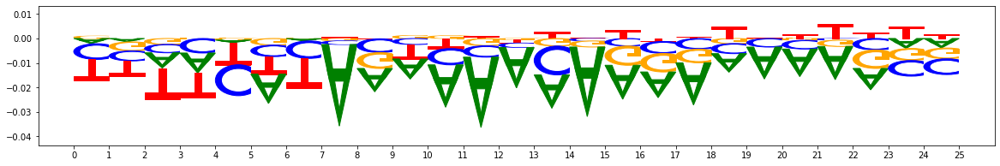

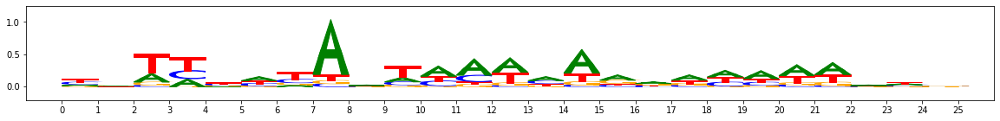

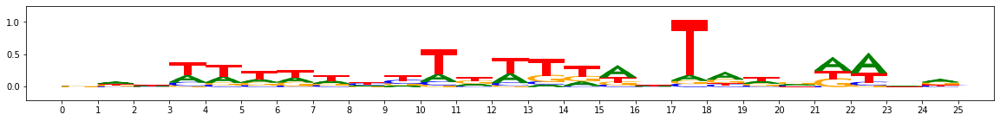

PLOTTING SUBCLUSTERS


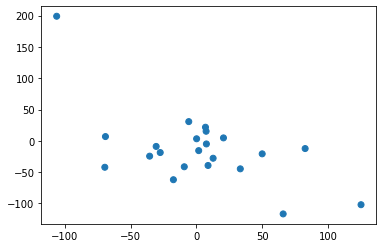

subcluster_0 size 22


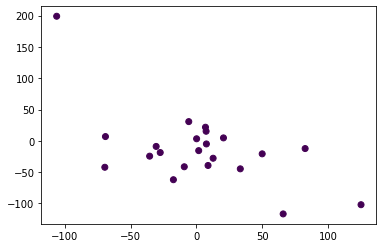

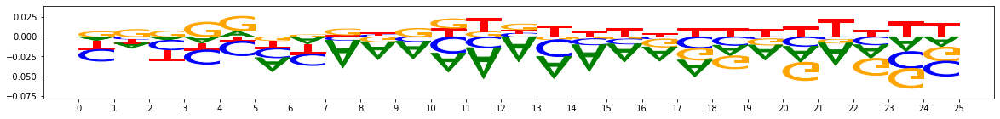

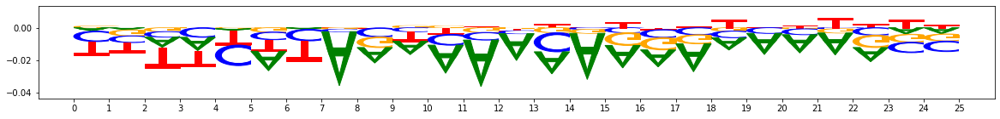

metacluster_1 pattern_3
total seqlets: 21
Task 2 hypothetical scores:


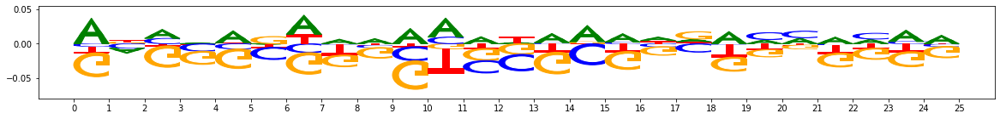

Task 2 actual importance scores:


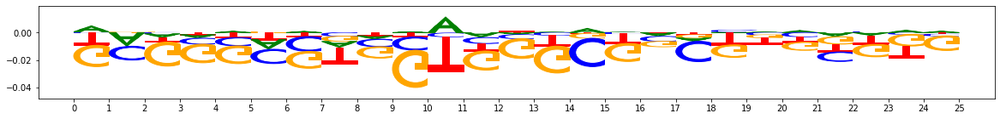

onehot, fwd and rev:


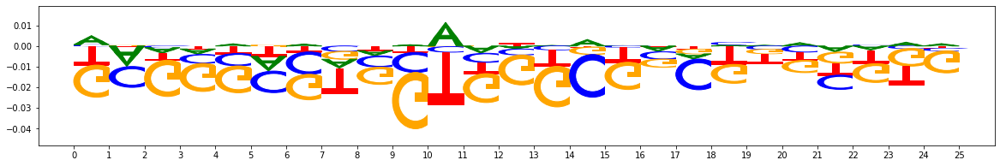

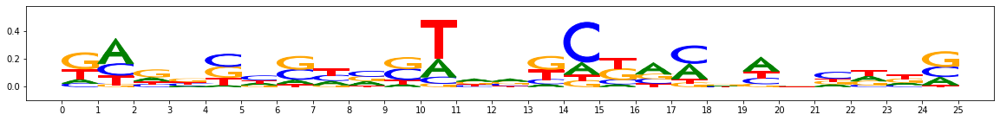

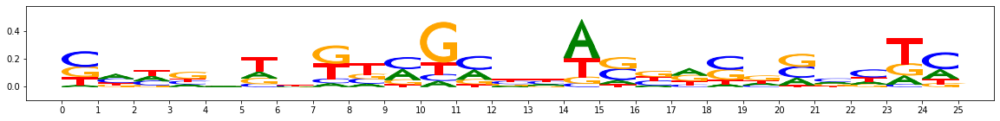

PLOTTING SUBCLUSTERS


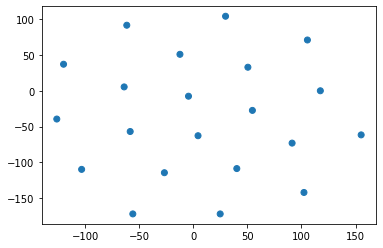

subcluster_0 size 21


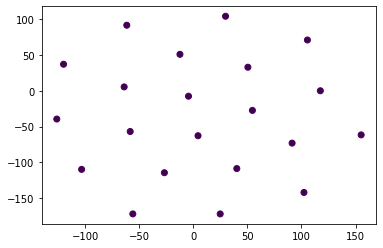

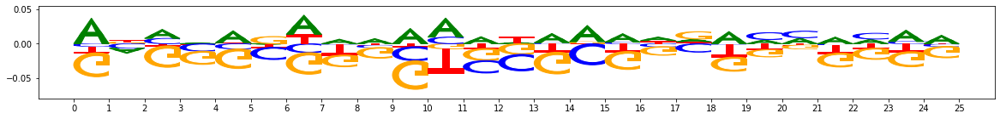

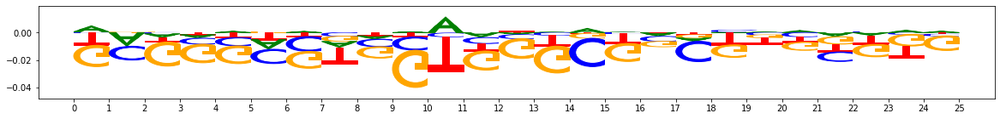

In [38]:
from collections import Counter
import numpy as np

from modisco.visualization import viz_sequence
reload(viz_sequence)
from matplotlib import pyplot as plt

import modisco.affinitymat.core
reload(modisco.affinitymat.core)
import modisco.cluster.phenograph.core
reload(modisco.cluster.phenograph.core)
import modisco.cluster.phenograph.cluster
reload(modisco.cluster.phenograph.cluster)
import modisco.cluster.core
reload(modisco.cluster.core)
import modisco.aggregator
reload(modisco.aggregator)

hdf5_results = h5py.File("tf_modisco/tRNet_modisco_results_inactive.hdf5","r")

print("Metaclusters heatmap")
import seaborn as sns
activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                    np.array(
        [x[0] for x in sorted(
                enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
               key=lambda x: x[1])])]
sns.heatmap(activity_patterns, center=0)
plt.show()

metacluster_names = [
    x.decode("utf-8") for x in 
    list(hdf5_results["metaclustering_results"]
         ["all_metacluster_names"][:])]

all_patterns = []
background = np.array([0.27, 0.23, 0.23, 0.27])

for metacluster_name in metacluster_names:
    print(metacluster_name)
    metacluster_grp = (hdf5_results["metacluster_idx_to_submetacluster_results"]
                                   [metacluster_name])
    print("activity pattern:",metacluster_grp["activity_pattern"][:])
    all_pattern_names = [x.decode("utf-8") for x in 
                         list(metacluster_grp["seqlets_to_patterns_result"]
                                             ["patterns"]["all_pattern_names"][:])]
    if (len(all_pattern_names)==0):
        print("No motifs found for this activity pattern")
    for pattern_name in all_pattern_names:
        print(metacluster_name, pattern_name)
        all_patterns.append((metacluster_name, pattern_name))
        pattern = metacluster_grp["seqlets_to_patterns_result"]["patterns"][pattern_name]
        print("total seqlets:",len(pattern["seqlets_and_alnmts"]["seqlets"]))
        print("Task 2 hypothetical scores:")
        viz_sequence.plot_weights(pattern["task2_hypothetical_contribs"]["fwd"])
        print("Task 2 actual importance scores:")
        viz_sequence.plot_weights(pattern["task2_contrib_scores"]["fwd"])
        #For plotting figures to a png, this code can be used...
        fig = plt.figure(figsize=(20,3))                                           
        ax = fig.add_subplot(111)
        viz_sequence.plot_weights_given_ax(ax, pattern["task2_contrib_scores"]["fwd"])
        plt.savefig("tf_modisco/" + "inactive_" + metacluster_name + "_activity" + str(metacluster_grp["activity_pattern"][0]) + "_" + pattern_name + "_contrib_scores.pdf")
        print("onehot, fwd and rev:")
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["fwd"]),
                                                        background=background)) 
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["rev"]),
                                                        background=background)) 
        #Plot the subclustering too, if available
        if ("subclusters" in pattern):
            print("PLOTTING SUBCLUSTERS")
            subclusters = np.array(pattern["subclusters"])
            twod_embedding = np.array(pattern["twod_embedding"])
            plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=subclusters, cmap="tab20")
            plt.show()
            for subcluster_name in list(pattern["subcluster_to_subpattern"]["subcluster_names"]):
                subpattern = pattern["subcluster_to_subpattern"][subcluster_name]
                print(subcluster_name.decode("utf-8"), "size", len(subpattern["seqlets_and_alnmts"]["seqlets"]))
                subcluster = int(subcluster_name.decode("utf-8").split("_")[1])
                plt.scatter(twod_embedding[:,0], twod_embedding[:,1], c=(subclusters==subcluster))
                viz_sequence.plot_weights(subpattern["task2_hypothetical_contribs"]["fwd"])
                viz_sequence.plot_weights(subpattern["task2_contrib_scores"]["fwd"])
        
hdf5_results.close()